## Prologue

Run these cells prior to running any cell below, in order for the script and models to function in a proper way.

In [1]:
import jupyter_contrib_nbextensions


In [1]:
# Install libraries

import os
import sys
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import matplotlib.lines as lines


from sklearn.preprocessing import MinMaxScaler, PowerTransformer, StandardScaler
from IPython.display import display, HTML

# Ignore warnings 
pd.options.mode.chained_assignment = None

# Set figure size
plt.rcParams['figure.figsize'] = [25, 10]

In [2]:
# Create universally (i.e. across various operating systems) recognized paths

notebook_path = os.path.abspath('Experiments Notebook.ipynb')          # Jupyter notebook path
TCDF_path = os.path.join(os.path.dirname(notebook_path), 'TCDF')       # TCDF folder path
TCDFdata_path = os.path.join(TCDF_path, 'data')                        # TCDF/data folder path
EBT_path = os.path.join(os.path.dirname(notebook_path), 'EBT Data')    # EBT folder path
DefaultCod_path = os.path.join(EBT_path, 'Modified Default Cod')       # EBT/Modified Default Cod folder path
Cod_path = os.path.join(DefaultCod_path, 'Modified Default.out')       # EBT/Modified Default Cod/Modified Default.out file path

In [3]:
# Install conda- and pip packages in the current Jupyter kernel

!conda install -c anaconda tensorflow --y
!pip3 install torch torchvision torchaudio
!{sys.executable} -m pip install torchvision
!pip3 install jupyter_contrib_nbextensions

Solving environment: ...working... done

# All requested packages already installed.

  Created wheel for jupyter-latex-envs: filename=jupyter_latex_envs-1.4.6-py2.py3-none-any.whl size=963394 sha256=e6d0d7a54682fcd377f49861c739b8b7e4a2e14c547d15f08ed009efb7a0b373
  Stored in directory: c:\users\10528504\appdata\local\pip\cache\wheels\4d\ba\f4\b8c0941055519ebc0f27e85bfe2bb223f1a59a3b8bfc5c7515
  Created wheel for jupyter-nbextensions-configurator: filename=jupyter_nbextensions_configurator-0.4.1-py2.py3-none-any.whl size=465825 sha256=cb1c8c91ac5f2b9b9419647ee123b1e49a0ad6e7964db336ec98b1ff9766d51d
  Stored in directory: c:\users\10528504\appdata\local\pip\cache\wheels\e3\3a\b3\a709b437602c3807f079f0c35ccba3e1adf9af6f2e6b0ebfea
Successfully built jupyter-latex-envs jupyter-nbextensions-configurator


In [4]:
# Define function for loading in preprocessed data 

def load_ebt():
    """This function loads the preprocessed data from the ebt tool.
    Returns a DataFrame 36501 x 10 from EBT."""

    # Load clean data from EBT tool into DataFrame
    file_path = os.path.join(TCDFdata_path, 'EBT_dataset.csv')
    data = pd.read_csv(file_path, delimiter = ',', header = 0)

    # Define labels
    labels = ['Time (year)',
              'Rs', 'Rj', 'Ra',                               # Shared resources biomass
              'Sj', 'Sa', 'Sb',                               # Sprat stages biomass
              'Cj', 'Ca', 'Cb',                               # Cod stages biomass
              'Fc']
    biomass_labels = ['Rs', 'Rj', 'Ra',                       # Shared resources biomass
                      'Sj', 'Sa', 'Sb',                       # Sprat stages biomass
                      'Cj', 'Ca', 'Cb',                       # Cod stages biomass
                      'Fc']

    data = data[labels]
    
    return data

In [5]:
# Define function for visualisation of scaled data 

def plot_data(data, years):                      # Add argument 'transformation', for (non)scaling methods
    """This function plots selected data within given timeframe [years] for the triptrophic community. 
    Provided data should be a DataFrame with at least columns [Cj, Ca, Cb, Sj, Sa, Sb, Rj, Rs, Ra].
    The years argument is given as a list with two numbers between 0 and 100."""
    
    # Select data to be visualized
    cod = data[['Cj', 'Ca', 'Cb']]
    sprat = data[['Sj', 'Sa', 'Sb']]
    resource = data[['Rj', 'Rs', 'Ra']]
    data['Time'] = np.linspace(years[0], years[1], len(data))
    time = data['Time']

    # Set subplot figure defaults
    fig, [cod_plt, sprat_plt, resource_plt] = plt.subplots(3, 1, sharex = True)
    fig.subplots_adjust(hspace = 0)
    fig.suptitle('Cod-sprat-resource dynamics {start}-{stop} years (scaled)'.format(start=years[0],stop=years[1]))

    # Set labels for shared x-axis and individual y-axes
    cod_plt.set(ylabel = 'Cod biomass')
    sprat_plt.set(ylabel = 'Sprat biomass')
    resource_plt.set(ylabel = 'Resource biomass')
    plt.xlabel('Time (years)')

    # Visualize data
    cod_plt.plot(time, cod)
    sprat_plt.plot(time, sprat)
    resource_plt.plot(time, resource)

    # Add legends
    cod_plt.legend(['Cj', 'Ca', 'Cb'], loc = 'center left')
    sprat_plt.legend(['Sj', 'Sa', 'Sb'], loc = 'center left')
    resource_plt.legend(['Rj', 'Rs', 'Ra'], loc = 'center left')

    # Remove Time column
    data.drop(['Time'], axis = 1, inplace = True)

In [6]:
# Define function that preprocesses (i.e. scale min-max) and select data from desired timeframe 

def select_data(data, start, stop, preprocessor='min-max'):        
    """This function preprocesses selected data.
    Three processing methods can be used (min-max, standard, power) - min-max default.
    Selection of data timeframe is specified with the [start] and [stop] arguments."""

    # Select information of datapoints
    selected_data = data[(data['Time (year)'] >= start) & (data['Time (year)'] <= stop)]

    biomass_labels = ['Rs', 'Rj', 'Ra',                       # Shared resources biomass
                      'Sj', 'Sa', 'Sb',                       # Sprat stages biomass
                      'Cj', 'Ca', 'Cb',                       # Cod stages biomass
                      'Fc']

    # Normalize data
    # Min-max normalization
    if preprocessor == 'min-max':
        scaler = MinMaxScaler()
    # Power transformer normalization
    elif preprocessor == 'power':
        scaler = PowerTransformer()  
    # Standard normalization
    elif preprocessor == 'standard':
        scaler = StandardScaler()
    
    scaled = scaler.fit_transform(selected_data[biomass_labels])
    
    # Write scaled data to DataFrame
    processed_data = pd.DataFrame(scaled, columns = biomass_labels)

    # Check the scaled DataFrame
    display(processed_data.head(-10))
    # Plot scaled data 
    plot_data(processed_data, [start,stop])
    
    return processed_data

In [7]:
# Define function to plot the model's loss or accuracy (i.e. performance) after running 

def plot_performance(losses_or_accuracy):
    """This function plots the losses for each trained variable for the TCDF model.
    Takes a dictionary with either losses or accuracy for each variable as input"""
    
    # Preallocate plots in subplots
    fig, axs = plt.subplots(3, 3, sharex = True)
    for ax in axs.flat:
        ax.set(xlabel='Epochs', ylabel='Performance measure')

    # Iterate over each key in dictionary
    keys = list(losses_or_accuracy.keys())
    
    # Plot every variable in different subplot
    axs[0, 0].plot(np.arange(len(losses_or_accuracy[keys[0]])), losses_or_accuracy[keys[0]])
    axs[0, 0].set_title('Performance Rs')
    axs[0, 1].plot(np.arange(len(losses_or_accuracy[keys[1]])), losses_or_accuracy[keys[1]])
    axs[0, 1].set_title('Performance Rj')
    axs[0, 2].plot(np.arange(len(losses_or_accuracy[keys[2]])), losses_or_accuracy[keys[2]])
    axs[0, 2].set_title('Performance Ra')
    axs[1, 0].plot(np.arange(len(losses_or_accuracy[keys[3]])), losses_or_accuracy[keys[3]])
    axs[1, 0].set_title('Performance Sj')
    axs[1, 1].plot(np.arange(len(losses_or_accuracy[keys[4]])), losses_or_accuracy[keys[4]])
    axs[1, 1].set_title('Performance Sa')
    axs[1, 2].plot(np.arange(len(losses_or_accuracy[keys[5]])), losses_or_accuracy[keys[5]])
    axs[1, 2].set_title('Performance Sb')
    axs[2, 0].plot(np.arange(len(losses_or_accuracy[keys[6]])), losses_or_accuracy[keys[6]])
    axs[2, 0].set_title('Performance Cj')
    axs[2, 1].plot(np.arange(len(losses_or_accuracy[keys[7]])), losses_or_accuracy[keys[7]])
    axs[2, 1].set_title('Performance Ca')
    axs[2, 2].plot(np.arange(len(losses_or_accuracy[keys[8]])), losses_or_accuracy[keys[8]])
    axs[2, 2].set_title('Performance Cb')


In [8]:
# Define function for adding white noise
def noise(signal, snr):
    """This function adds white Gaussian noise to a signal.
    Noise is added to existing signal and created by a desired signal-to-noise ratio (SNR).
    Function returns the original signal with added noise by the given SNR."""

    # Set mean noise to 0, indicative for white noise
    mean_noise = 0
    sample = len(signal)
    
    # Calculate averages to determine signal power
    average_mean = np.mean(signal)
    average_snr = (10 * np.log10(average_mean)) - snr    
    average_noise = 10 ** (average_snr / 10)

    # Generate noisy signal
    noise_variation = np.random.normal(mean_noise, np.sqrt(average_noise), sample)
    
    # Add noise to the original signal
    noise_signal = signal + noise_variation
    
    return noise_signal

In [9]:
# Define function for creating noisy dataset
def noisy_data(snr):

    # Create dataframe for noisy data
    noisy_ebt = pd.DataFrame(ebt)

    # Add noise for relevant columns
    biomass_labels = ['Rs', 'Rj', 'Ra',                       # Shared resources biomass
                      'Sj', 'Sa', 'Sb',                       # Sprat stages biomass
                      'Cj', 'Ca', 'Cb',                       # Cod stages biomass
                      'Fc']

    for col in ebt[biomass_labels]:
        noisy_ebt[col] = noise(ebt[col], snr)

    # Visualise unscaled and scaled data 
    plot_data(noisy_ebt, [0,100])
    
    # Write the final dataset to DataFrame named noisy_ebt
    noisy_ebt['Time (year)'] = ebt['Time (year)']
    
    return noisy_ebt

In [10]:
# Define needed directory
directory = TCDF_path

# Check current working directory
current_directory = os.getcwd()

# Change working directory to perform TCDF
if current_directory != directory:
    os.chdir(TCDF_path)

# Check new current working directory
os.getcwd()

'C:\\Users\\10528504\\Documents\\GitHub\\thesis\\TCDF'

This part shows the functionality of TCDF.

See the corresponding paper for more detail: ["Causal Discovery with Attention-Based Convolutional Neural Networks"](https://www.mdpi.com/2504-4990/1/1/19).

# TCDF

These next code cells perform the analysis of the (demo) dataset with the TCDF. In the utils.py file you are able to adjust parameters for adaptive learning rate and early stopping. These parameters include type of optimizer (specified in runTCDF.py arguments), number of epochs before adapting learning rate, minimum learning rate, and size of decreasing learning rate factor. For early stopping two parameters are given, the number of epochs before stopping when loss is not improving and the minimum difference in loss improvement.

In [12]:
# Show all argument options

%run -i "runTCDF.py" --help

usage: runTCDF.py [-h] [--cuda] [--epochs EPOCHS] [--kernel_size KERNEL_SIZE]
                  [--hidden_layers HIDDEN_LAYERS]
                  [--learning_rate LEARNING_RATE] [--optimizer {Adam,RMSprop}]
                  [--log_interval LOG_INTERVAL] [--seed SEED]
                  [--dilation_coefficient DILATION_COEFFICIENT]
                  [--significance SIGNIFICANCE] [--plot]
                  (--ground_truth GROUND_TRUTH | --data DATA [DATA ...])
                  [--lr_scheduler] [--early_stopping]

TCDF: Temporal Causal Discovery Framework

optional arguments:
  -h, --help            show this help message and exit
  --cuda                Use CUDA (GPU) (default: False)
  --epochs EPOCHS       Number of epochs (default: 1000)
  --kernel_size KERNEL_SIZE
                        Size of kernel, i.e. window size. Maximum delay to be
                        found is kernel size - 1. Recommended to be equal to
                        dilation coeffient (default: 4)
  --hidden_

# Start of Experiments

## Standardized Scaling

### Signal to Noise ratio 1:0

### TCDF with EBT total dynamics

This data represents the tritrophic biomasses including the total dynamics (shift change). The system first is at its equilibrium and remains stable for ~20 years, fishing pressure is introduced and a new equilibrium is to be found (at 70 years it is stable again). Data is split into two 'total dynamics', 0 - 100 years and 20 - 70 years respectively.

#### 20 - 70 years

,Rs,Rj,Ra,Sj,Sa,Sb,Cj,Ca,Cb,Fc
0,1.585587,-1.104011,-0.475962,-0.704950,-1.607217,-0.872841,0.494314,0.011977,2.209029,-1.434739
1,1.585587,-1.104011,-0.475962,-0.704950,-1.607217,-0.872841,0.494314,0.011977,2.209029,-1.434175
2,1.585587,-1.104011,-0.475962,-0.704950,-1.607217,-0.872841,0.494314,0.011976,2.209029,-1.433611
3,1.585587,-1.104011,-0.475962,-0.704950,-1.607217,-0.872841,0.494313,0.011975,2.209029,-1.433048
4,1.585587,-1.104011,-0.475961,-0.704950,-1.607217,-0.872841,0.494313,0.011974,2.209029,-1.432485
...,...,...,...,...,...,...,...,...,...,...
18236,-1.306742,1.729091,1.199771,-1.661457,1.563188,-1.847004,-1.744753,-1.289063,-0.574815,-1.434739
18237,-1.306741,1.729095,1.199772,-1.661465,1.563195,-1.847027,-1.744757,-1.289063,-0.574816,-1.434739
18238,-1.306741,1.729100,1.199772,-1.661473,1.563201,-1.847049,-1.744761,-1.289063,-0.574816,-1.434739
18239,-1.306740,1.729104,1.199772,-1.661481,1.563207,-1.847071,-1.744765,-1.289063,-0.574817,-1.434739


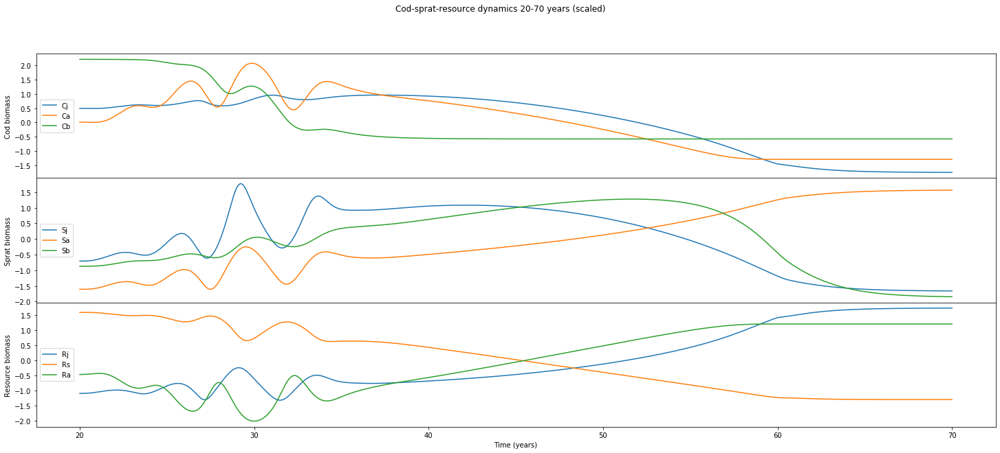

In [13]:
# Select data between 20 and 70 years
ebt_20_70 = select_data(ebt, 20, 70, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_EBT_20_70_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
ebt_20_70.to_csv(EBTScaled_path, index = False)

#### TCDF 20-70 years: first run (in triplicate)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=1000, ground_truth={'data/power_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=5467, significance=0.9)

 Dataset:  power_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.082922
Epoch   151: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [25%] 	Loss: 0.004126
Epoch: 500 [50%] 	Loss: 0.001290
Epoch: 750 [75%] 	Loss: 0.000719
Epoch   757: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 1000 [100%] 	Loss: 0.000652
Potential causes:  [9, 8, 1]
Validated causes:  [1]

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.082848
Epoch    91: reducing learning r

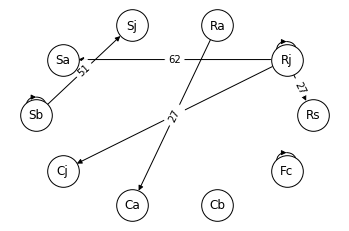

<Figure size 432x288 with 0 Axes>

In [14]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 1000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 5467 --plot


Arguments: Namespace(cuda=False, data=['data/power_EBT_20_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=1000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=5467, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.594565
Epoch   148: reducing learning rate of group 0 to 1.0000e-02.
Epoch   159: reducing learning rate of group 0 to 1.0000e-03.
Epoch   178: reducing learning rate of group 0 to 1.0000e-04.
Epoch   189: reducing learning rate of group 0 to 1.0000e-05.
Epoch   200: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [25%] 	Loss: 0.000408
Epoch: 500 [50%] 	Loss: 0.000404
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.243260
Epoch    20: reducing learning ra

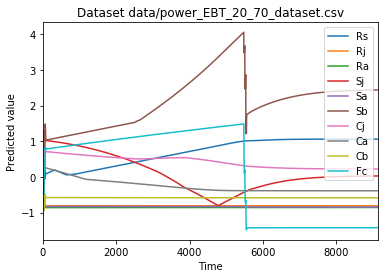

In [15]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 1000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 5467 --plot --train_test_split 0.5

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=1000, ground_truth={'data/power_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=2371, significance=0.9)

 Dataset:  power_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.033876
Epoch    46: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [25%] 	Loss: 0.005821
Epoch: 500 [50%] 	Loss: 0.002154
Epoch: 750 [75%] 	Loss: 0.000365
Epoch: 1000 [100%] 	Loss: 0.000173
Potential causes:  [0, 6, 3]
Validated causes:  [0]

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.034491
Epoch   244: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [25%] 	Loss: 0.008158

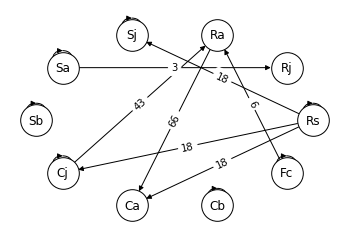

<Figure size 432x288 with 0 Axes>

In [16]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 1000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 2371 --plot


Arguments: Namespace(cuda=False, data=['data/power_EBT_20_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=1000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=2371, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.728353
Epoch    25: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [25%] 	Loss: 0.001535
Epoch: 500 [50%] 	Loss: 0.001200
Epoch   586: reducing learning rate of group 0 to 1.0000e-03.
Epoch   606: reducing learning rate of group 0 to 1.0000e-04.
Epoch   629: reducing learning rate of group 0 to 1.0000e-05.
Epoch   640: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 750 [75%] 	Loss: 0.001134
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.030041


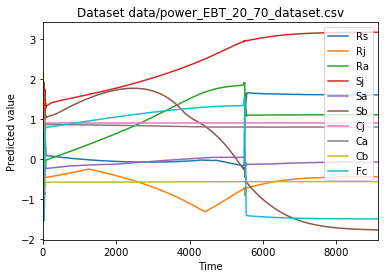

In [17]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 1000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 2371 --plot --train_test_split 0.5

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=1000, ground_truth={'data/power_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=1084, significance=0.9)

 Dataset:  power_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.058376
Epoch   151: reducing learning rate of group 0 to 1.0000e-02.
Epoch   176: reducing learning rate of group 0 to 1.0000e-03.
Epoch   199: reducing learning rate of group 0 to 1.0000e-04.
Epoch   210: reducing learning rate of group 0 to 1.0000e-05.
Epoch   221: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [25%] 	Loss: 0.000768
Epoch: 500 [50%] 	Loss: 0.000765
INFO: Early stopping
Potential causes:  [0, 6]
Validated causes:  [0]

 Analysis started for target:  Rj
INFO

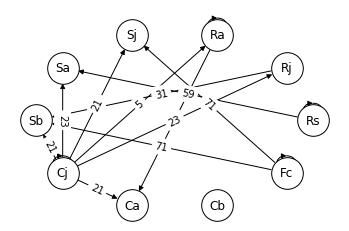

<Figure size 432x288 with 0 Axes>

In [18]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 1000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 1084 --plot


Arguments: Namespace(cuda=False, data=['data/power_EBT_20_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=1000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=1048, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.826018
Epoch    78: reducing learning rate of group 0 to 1.0000e-02.
Epoch    89: reducing learning rate of group 0 to 1.0000e-03.
Epoch   100: reducing learning rate of group 0 to 1.0000e-04.
Epoch   111: reducing learning rate of group 0 to 1.0000e-05.
Epoch   122: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [25%] 	Loss: 0.027943
Epoch: 500 [50%] 	Loss: 0.027855
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.903763
Epoch   155: reducing learning ra

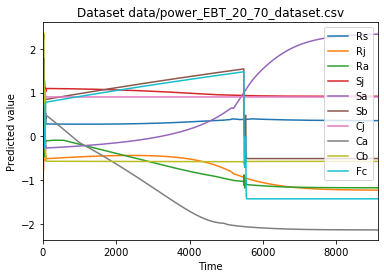

In [19]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 1000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 1048 --plot --train_test_split 0.5

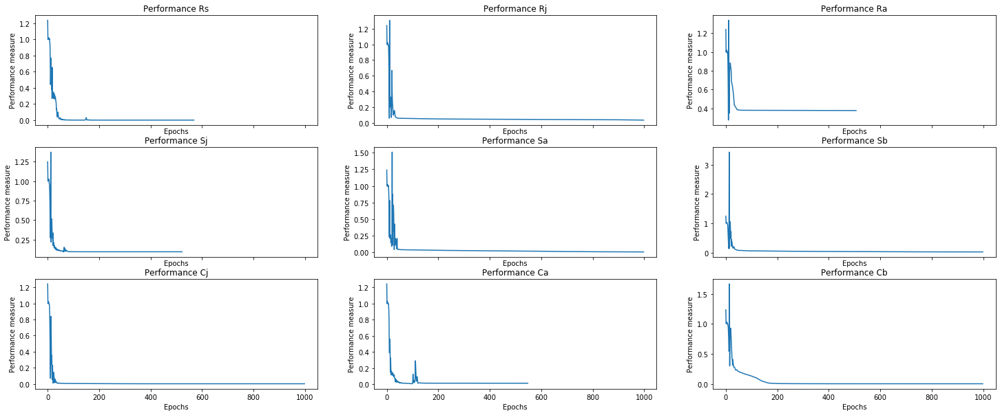

In [20]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

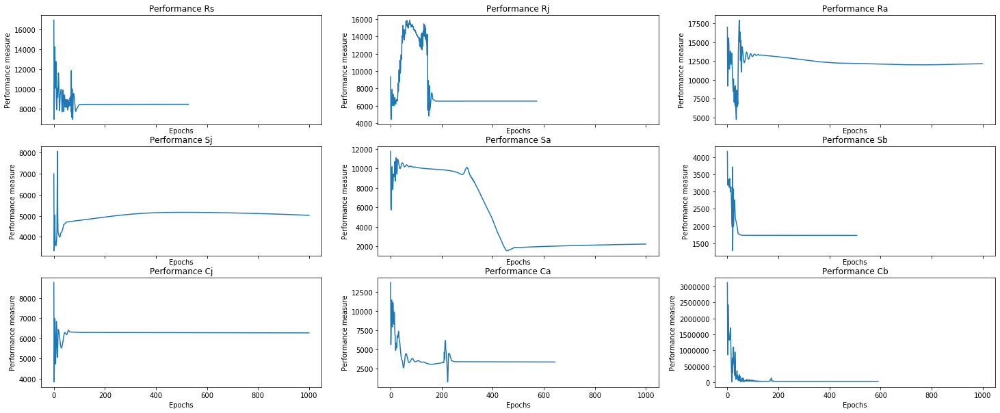

In [21]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 20-70 years: second run (decreased hidden layers by 1, incremented dilation coefficient and kernel size by 1)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=5467, significance=0.9)

 Dataset:  power_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.039829
Epoch    70: reducing learning rate of group 0 to 1.0000e-02.
Epoch    81: reducing learning rate of group 0 to 1.0000e-03.
Epoch    92: reducing learning rate of group 0 to 1.0000e-04.
Epoch   103: reducing learning rate of group 0 to 1.0000e-05.
Epoch   114: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.031683
Epoch: 500 [25%] 	Loss: 0.031426
INFO: Early stopping
Potential causes:  [7, 2, 9, 4, 5]
Validated causes:  [7, 2]

 Analysis started for targ

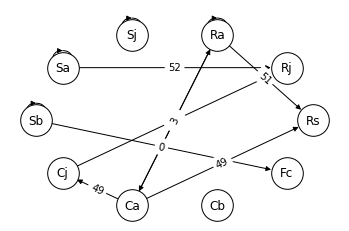

<Figure size 432x288 with 0 Axes>

In [22]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 5467 --plot


Arguments: Namespace(cuda=False, data=['data/power_EBT_20_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=5467, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.709056
Epoch   188: reducing learning rate of group 0 to 1.0000e-02.
Epoch   199: reducing learning rate of group 0 to 1.0000e-03.
Epoch   210: reducing learning rate of group 0 to 1.0000e-04.
Epoch   221: reducing learning rate of group 0 to 1.0000e-05.
Epoch   232: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.004125
Epoch: 500 [25%] 	Loss: 0.004120
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.057839
Epoch    20: reducing learning ra

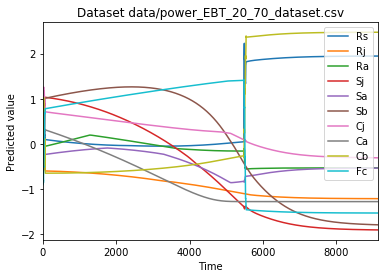

In [23]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 5467 --plot --train_test_split 0.5

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=9238, significance=0.9)

 Dataset:  power_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.022613
Epoch    60: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.002769
Epoch: 500 [25%] 	Loss: 0.001548
Epoch: 750 [38%] 	Loss: 0.000318
Epoch: 1000 [50%] 	Loss: 0.000215
Epoch  1015: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 1250 [62%] 	Loss: 0.000199
Epoch: 1500 [75%] 	Loss: 0.000188
INFO: Early stopping
Potential causes:  [5, 7, 0]
Validated causes:  [0]

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Ini

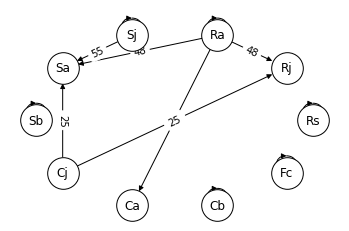

<Figure size 432x288 with 0 Axes>

In [24]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 9238 --plot


Arguments: Namespace(cuda=False, data=['data/power_EBT_20_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=9238, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.779285
Epoch    81: reducing learning rate of group 0 to 1.0000e-02.
Epoch    92: reducing learning rate of group 0 to 1.0000e-03.
Epoch   103: reducing learning rate of group 0 to 1.0000e-04.
Epoch   114: reducing learning rate of group 0 to 1.0000e-05.
Epoch   125: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.042142
Epoch: 500 [25%] 	Loss: 0.042107
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.961563
Epoch   110: reducing learning ra

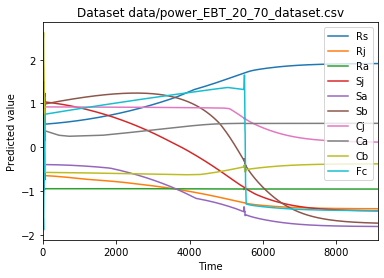

In [25]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 9238 --plot --train_test_split 0.5

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=157, significance=0.9)

 Dataset:  power_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.078943
Epoch    46: reducing learning rate of group 0 to 1.0000e-02.
Epoch    57: reducing learning rate of group 0 to 1.0000e-03.
Epoch    68: reducing learning rate of group 0 to 1.0000e-04.
Epoch    79: reducing learning rate of group 0 to 1.0000e-05.
Epoch    90: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.014138
Epoch: 500 [25%] 	Loss: 0.013929
INFO: Early stopping
Potential causes:  [8, 0]
Validated causes:  [8, 0]

 Analysis started for target:  Rj
IN

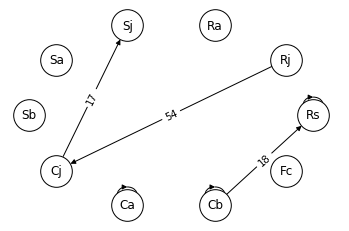

<Figure size 432x288 with 0 Axes>

In [26]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 157 --plot


Arguments: Namespace(cuda=False, data=['data/power_EBT_20_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=157, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.599997
Epoch    32: reducing learning rate of group 0 to 1.0000e-02.
Epoch    43: reducing learning rate of group 0 to 1.0000e-03.
Epoch    54: reducing learning rate of group 0 to 1.0000e-04.
Epoch    65: reducing learning rate of group 0 to 1.0000e-05.
Epoch    76: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.038764
Epoch: 500 [25%] 	Loss: 0.038625
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.329149
Epoch    59: reducing learning rat

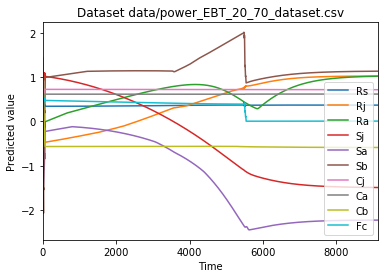

In [27]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 157 --plot --train_test_split 0.5

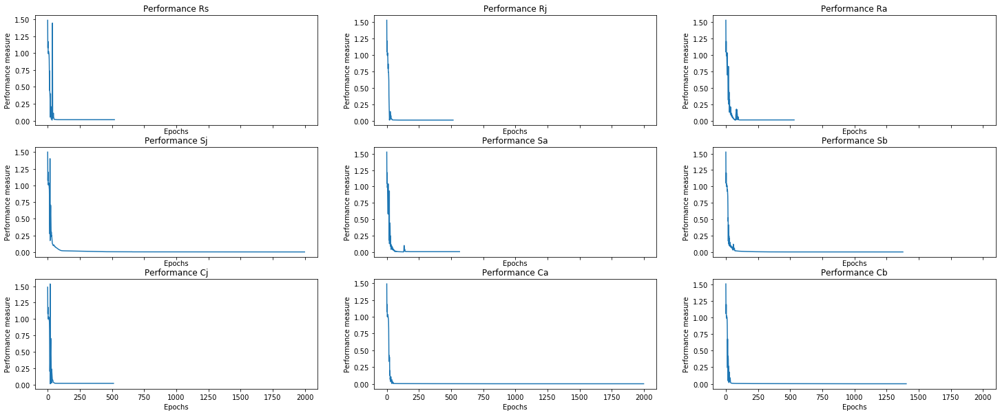

In [28]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

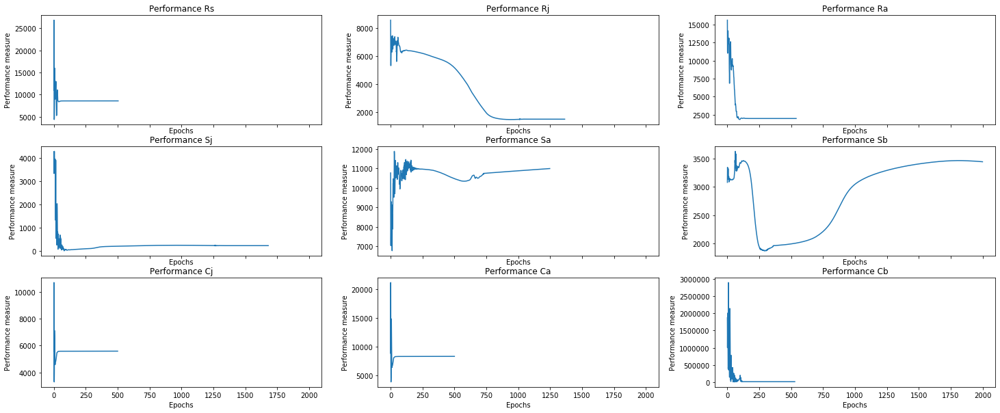

In [29]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 0 - 100 years

,Rs,Rj,Ra,Sj,Sa,Sb,Cj,Ca,Cb,Fc
0,1.316230,-0.994109,-0.829267,0.291364,-1.210665,0.256573,0.840493,0.583177,1.702671,-0.784255
1,1.316230,-0.994109,-0.829267,0.291362,-1.210666,0.256573,0.840493,0.583179,1.702671,-0.784255
2,1.316230,-0.994110,-0.829269,0.291360,-1.210666,0.256572,0.840493,0.583181,1.702671,-0.784255
3,1.316231,-0.994111,-0.829270,0.291358,-1.210666,0.256572,0.840493,0.583183,1.702672,-0.784255
4,1.316231,-0.994111,-0.829271,0.291356,-1.210667,0.256571,0.840493,0.583185,1.702672,-0.784255
...,...,...,...,...,...,...,...,...,...,...
36486,-1.022392,1.239006,1.005011,-1.200602,1.150846,-1.279076,-1.250003,-1.042689,-0.653321,-0.784255
36487,-1.022392,1.239006,1.005011,-1.200602,1.150846,-1.279076,-1.250003,-1.042689,-0.653321,-0.784255
36488,-1.022392,1.239006,1.005011,-1.200602,1.150846,-1.279076,-1.250003,-1.042689,-0.653321,-0.784255
36489,-1.022392,1.239006,1.005011,-1.200602,1.150846,-1.279076,-1.250003,-1.042689,-0.653321,-0.784255


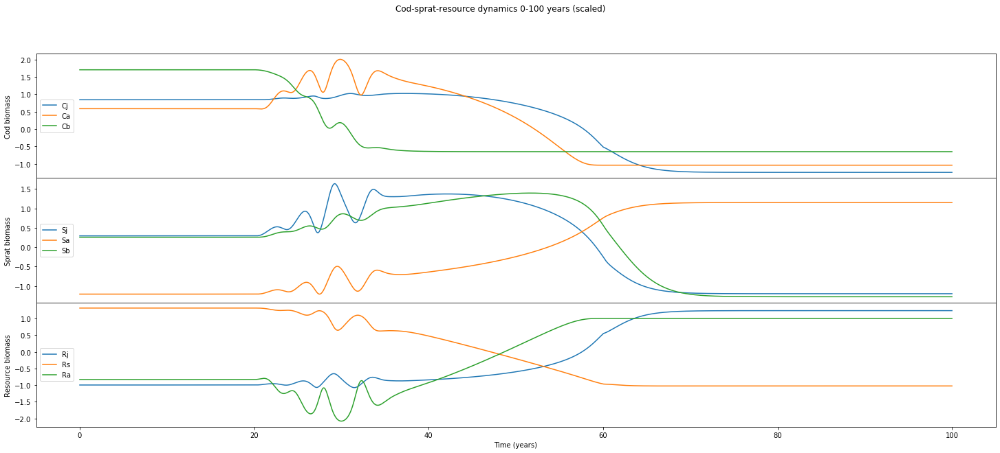

In [30]:
# Select data between 0 and 100 years
ebt_0_100 = select_data(ebt, 0, 100, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_EBT_0_100_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
ebt_0_100.to_csv(EBTScaled_path, index = False)

#### TCDF 0-100 years: first run (in triplicate)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=37519, significance=0.9)

 Dataset:  power_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.047429
Epoch    24: reducing learning rate of group 0 to 1.0000e-02.
Epoch    35: reducing learning rate of group 0 to 1.0000e-03.
Epoch    46: reducing learning rate of group 0 to 1.0000e-04.
Epoch    57: reducing learning rate of group 0 to 1.0000e-05.
Epoch    68: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.165747
Epoch: 500 [25%] 	Loss: 0.164228
INFO: Early stopping
Potential causes:  [6, 9, 3, 8, 7]
Validated causes:  [6]

 Analysis started for target

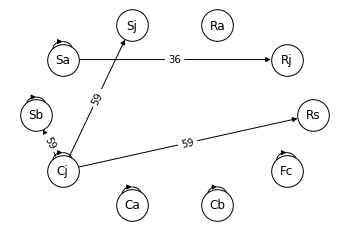

<Figure size 432x288 with 0 Axes>

In [31]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 37519 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_0_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=37519, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.886806
Epoch   233: reducing learning rate of group 0 to 1.0000e-02.
Epoch   244: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [12%] 	Loss: 0.002397
Epoch   255: reducing learning rate of group 0 to 1.0000e-04.
Epoch   266: reducing learning rate of group 0 to 1.0000e-05.
Epoch   277: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.002238
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.537441
Epoch    43: reducing learning r

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


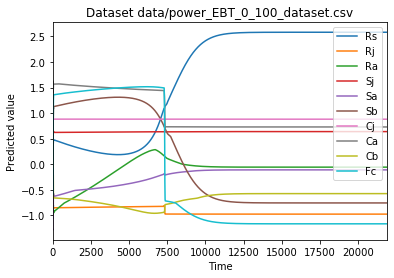

In [32]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 37519 --plot --train_test_split 0.4

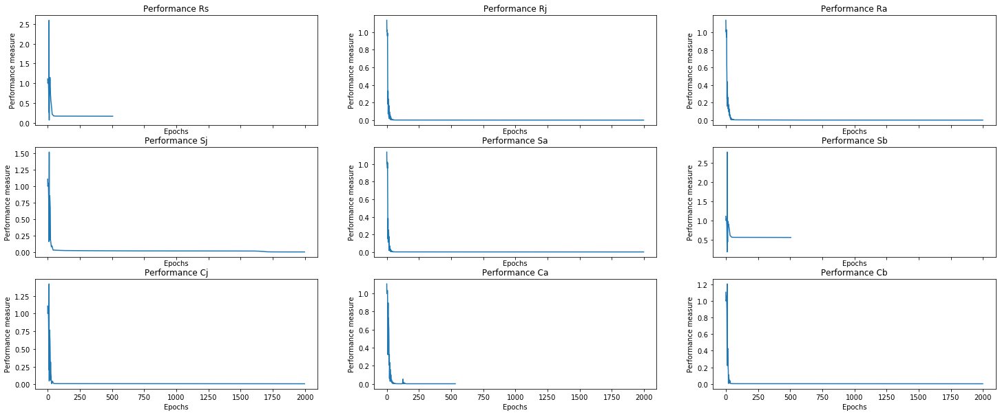

In [33]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

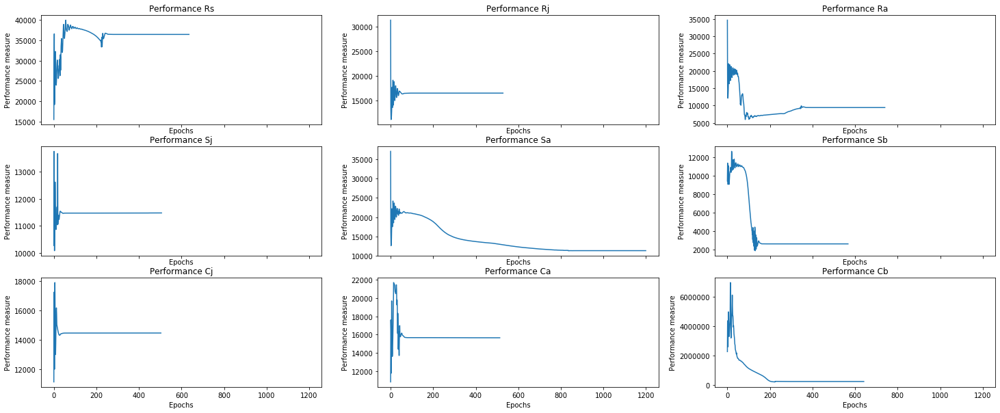

In [34]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=15787, significance=0.9)

 Dataset:  power_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.030890
Epoch   109: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.000725
Epoch: 500 [25%] 	Loss: 0.000402
Epoch: 750 [38%] 	Loss: 0.000205
Epoch: 1000 [50%] 	Loss: 0.000128
Epoch: 1250 [62%] 	Loss: 0.000099
Epoch: 1500 [75%] 	Loss: 0.000085
Epoch: 1750 [88%] 	Loss: 0.000076
INFO: Early stopping
Potential causes:  [5, 4, 1]
Validated causes:  [1]

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Ep

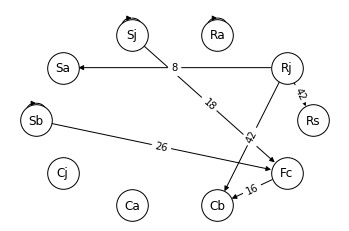

<Figure size 432x288 with 0 Axes>

In [35]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 15787 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_0_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=15787, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.775983
Epoch   190: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.000375
Epoch: 500 [25%] 	Loss: 0.000333
Epoch: 750 [38%] 	Loss: 0.000306
Epoch: 1000 [50%] 	Loss: 0.000291
Epoch: 1250 [62%] 	Loss: 0.000282
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.600103
Epoch    86: reducing learning rate of group 0 to 1.0000e-02.
Epoch   216: reducing learning rate of group 0 to 1.0000e-03.
Epoch   227: reducing learning rate of group 0 to 1.000

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


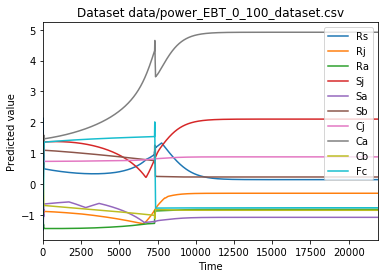

In [36]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 15787 --plot --train_test_split 0.4

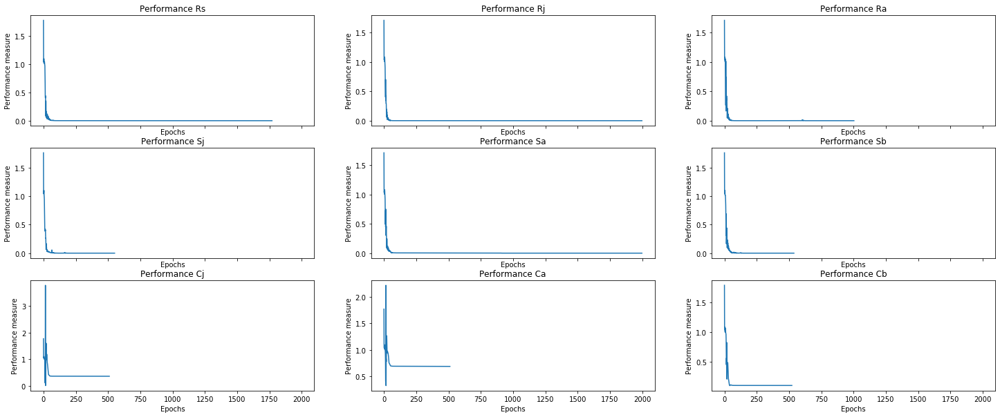

In [37]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

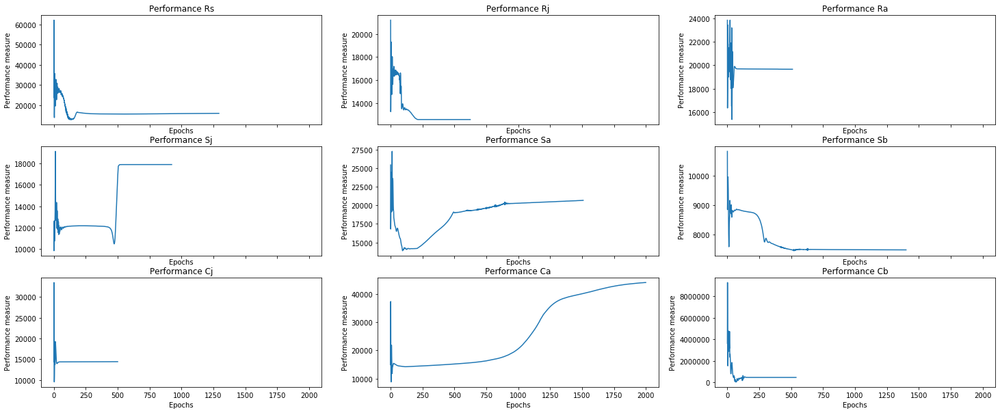

In [38]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=74326, significance=0.9)

 Dataset:  power_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.030528
Epoch   164: reducing learning rate of group 0 to 1.0000e-02.
Epoch   175: reducing learning rate of group 0 to 1.0000e-03.
Epoch   186: reducing learning rate of group 0 to 1.0000e-04.
Epoch   197: reducing learning rate of group 0 to 1.0000e-05.
Epoch   208: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.017023
Epoch: 500 [25%] 	Loss: 0.016963
INFO: Early stopping
Potential causes:  [6, 8]
Validated causes:  [6, 8]

 Analysis started for target:  Rj


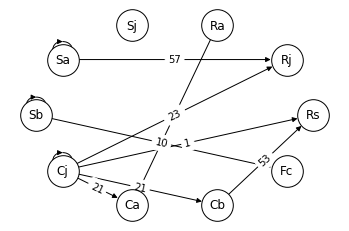

<Figure size 432x288 with 0 Axes>

In [39]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 74326 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_0_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=74326, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.985259
Epoch   135: reducing learning rate of group 0 to 1.0000e-02.
Epoch   146: reducing learning rate of group 0 to 1.0000e-03.
Epoch   157: reducing learning rate of group 0 to 1.0000e-04.
Epoch   168: reducing learning rate of group 0 to 1.0000e-05.
Epoch   179: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.000503
Epoch: 500 [25%] 	Loss: 0.000502
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.262202
Epoch    24: reducing learning r

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


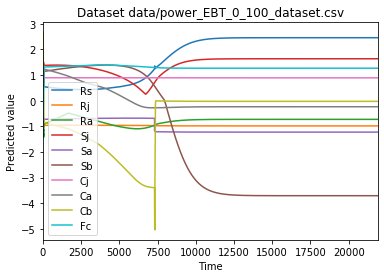

In [40]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 74326 --plot --train_test_split 0.4

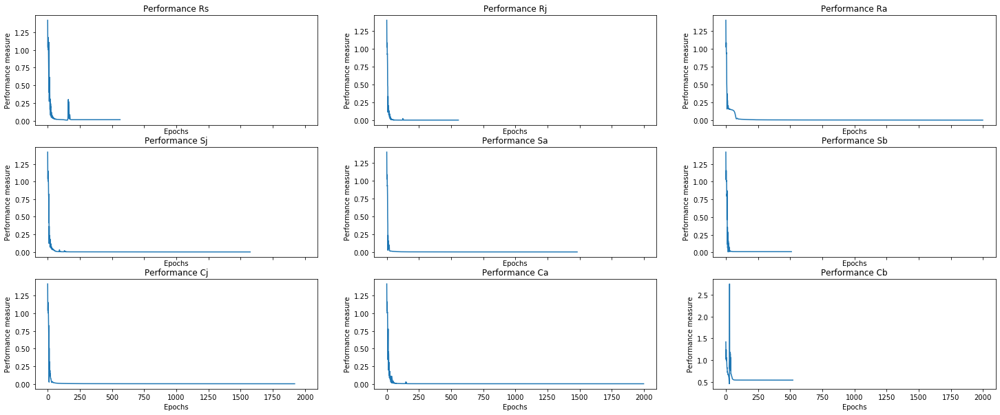

In [41]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

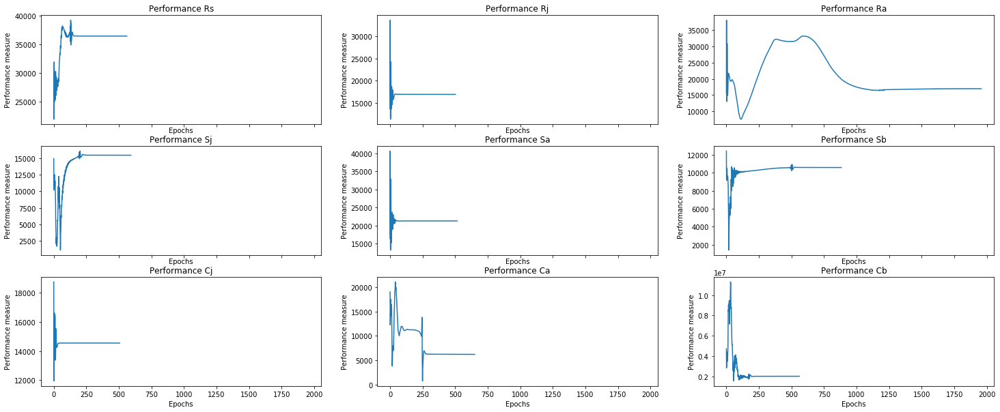

In [42]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

#### TCDF 0-100 years: second run (increased hidden layers by 1, decreased dilation coefficient and kernel size by 1)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=1111, significance=0.9)

 Dataset:  power_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.021784
Epoch    82: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.009291
Epoch: 500 [25%] 	Loss: 0.001522
Epoch: 750 [38%] 	Loss: 0.000935
Epoch   776: reducing learning rate of group 0 to 1.0000e-03.
Epoch   801: reducing learning rate of group 0 to 1.0000e-04.
Epoch   824: reducing learning rate of group 0 to 1.0000e-05.
Epoch   835: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 1000 [50%] 	Loss: 0.000921
INFO: Early stopping
Potential causes:  [4

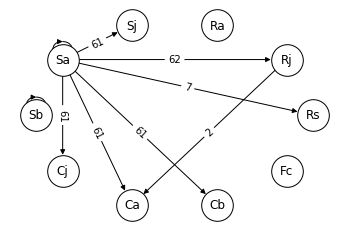

<Figure size 432x288 with 0 Axes>

In [43]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 1111 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_0_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=1111, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.704691
Epoch    72: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.007277
Epoch: 500 [25%] 	Loss: 0.006027
Epoch: 750 [38%] 	Loss: 0.001814
Epoch: 1000 [50%] 	Loss: 0.000693
Epoch: 1250 [62%] 	Loss: 0.000360
Epoch: 1500 [75%] 	Loss: 0.000283
Epoch: 1750 [88%] 	Loss: 0.000222
Epoch  1787: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 2000 [100%] 	Loss: 0.000210

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.643440
Epoch    27: reducing learning rate 

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


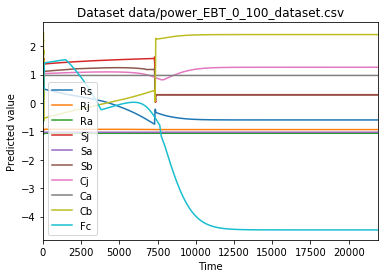

In [44]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 1111 --plot --train_test_split 0.4

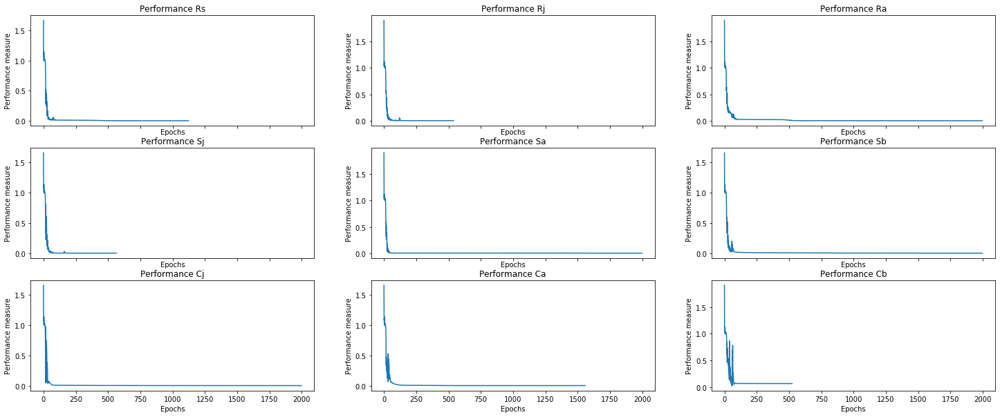

In [45]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

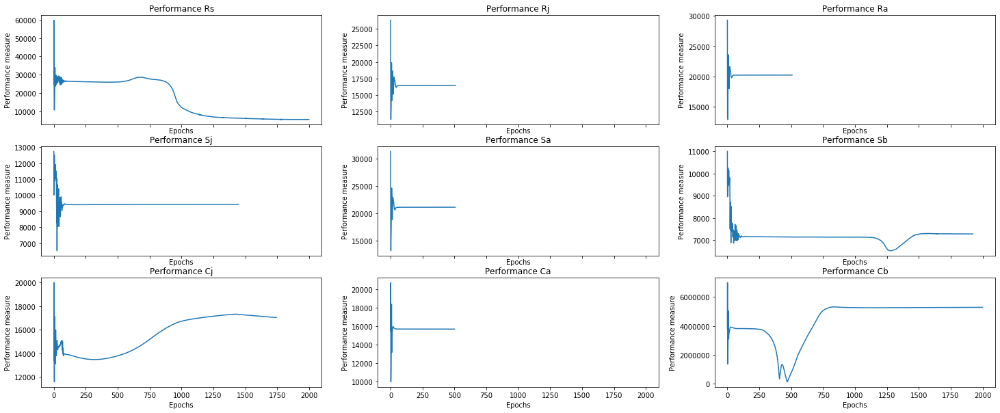

In [46]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=18040, significance=0.9)

 Dataset:  power_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.048048
Epoch    64: reducing learning rate of group 0 to 1.0000e-02.
Epoch    75: reducing learning rate of group 0 to 1.0000e-03.
Epoch    86: reducing learning rate of group 0 to 1.0000e-04.
Epoch    97: reducing learning rate of group 0 to 1.0000e-05.
Epoch   108: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.078056
Epoch: 500 [25%] 	Loss: 0.076415
INFO: Early stopping
Potential causes:  [6, 3]
Validated causes:  [6]

 Analysis started for target:  Rj
INF

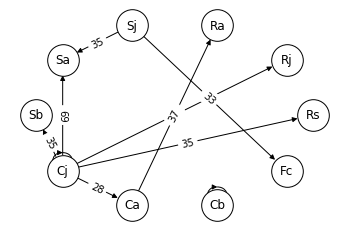

<Figure size 432x288 with 0 Axes>

In [47]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 18040 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_0_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=18040, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.902942
Epoch    41: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.005769
Epoch: 500 [25%] 	Loss: 0.002163
Epoch: 750 [38%] 	Loss: 0.001969
Epoch: 1000 [50%] 	Loss: 0.001850
Epoch  1092: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 1250 [62%] 	Loss: 0.001807
Epoch: 1500 [75%] 	Loss: 0.001796
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.363153
Epoch    24: reducing learning rate of group 0 to 1.0000e-02.
Epoch    35: reducing

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


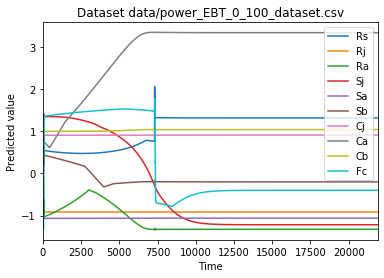

In [48]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 18040 --plot --train_test_split 0.4

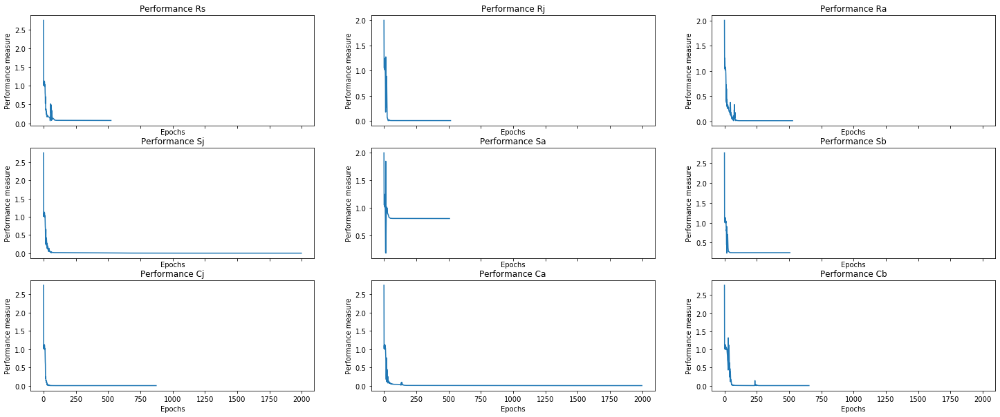

In [49]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

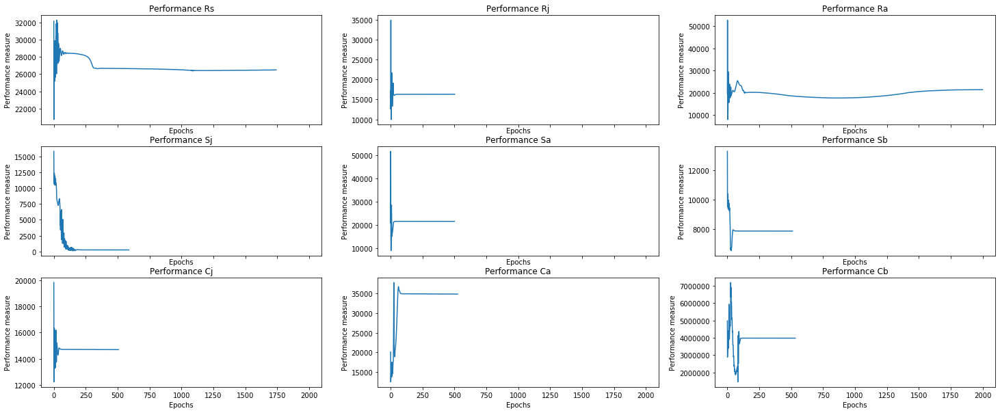

In [50]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=86547, significance=0.9)

 Dataset:  power_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.044520
Epoch   105: reducing learning rate of group 0 to 1.0000e-02.
Epoch   116: reducing learning rate of group 0 to 1.0000e-03.
Epoch   127: reducing learning rate of group 0 to 1.0000e-04.
Epoch: 250 [12%] 	Loss: 0.003012
Epoch: 500 [25%] 	Loss: 0.003002
Epoch: 750 [38%] 	Loss: 0.002992
INFO: Early stopping
Potential causes:  [9, 3, 8, 4]
Validated causes:  [4]

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [

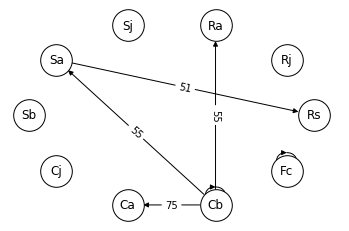

<Figure size 432x288 with 0 Axes>

In [51]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 86547 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_0_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=86547, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.873880
Epoch   111: reducing learning rate of group 0 to 1.0000e-02.
Epoch   122: reducing learning rate of group 0 to 1.0000e-03.
Epoch   133: reducing learning rate of group 0 to 1.0000e-04.
Epoch   144: reducing learning rate of group 0 to 1.0000e-05.
Epoch   155: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.007038
Epoch: 500 [25%] 	Loss: 0.007030
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.544466
Epoch    21: reducing learning r

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


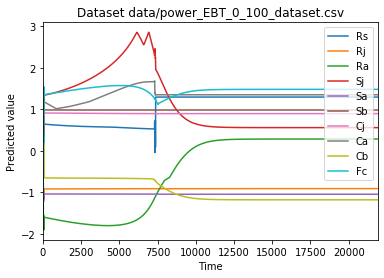

In [52]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 86547 --plot --train_test_split 0.4

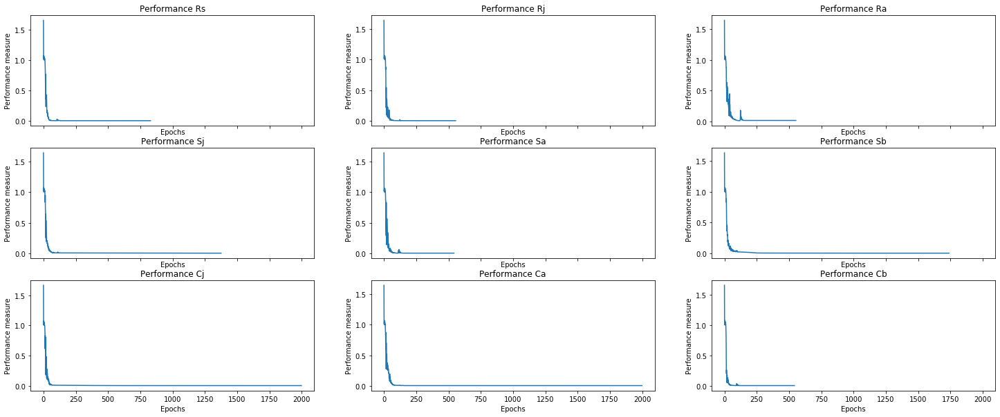

In [53]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

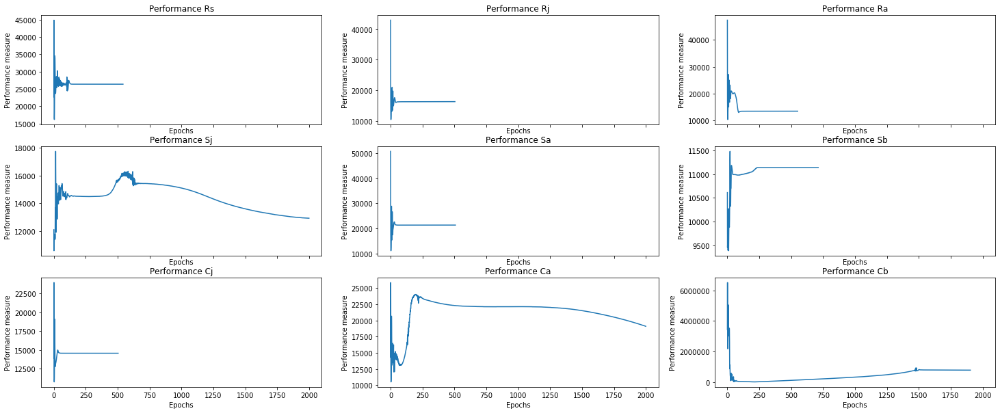

In [54]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

### TCDF with EBT equilibrium dynamics

This data represents the tritrophic biomasses before the introduced fishing pressure on cod. The system first finds it equilibrium and remains stable for ~20 years. Therefore, no relations should be found by the machine learning model.

#### 0 - 20 years

In [11]:
# Select data between 0 and 20 years
ebt_0_20 = select_data(ebt, 0, 20, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_EBT_0_20_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
ebt_0_20.to_csv(EBTScaled_path, index = False)

C:\Users\10528504\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:3202: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\10528504\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:3237: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
C:\Users\10528504\Anaconda3\lib\site-packages\numpy\core\_methods.py:232: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\10528504\Anaconda3\lib\site-packages\numpy\core\_methods.py:243: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


ValueError: Input contains infinity or a value too large for dtype('float64').

#### TCDF 0 - 20 years: first run (in triplicate)

In [56]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 37519 --plot

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_0_20_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=37519, significance=0.9)

 Dataset:  power_EBT_0_20_dataset.csv


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_0_20_dataset.csv'

In [57]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 37519 --plot --train_test_split 0.8

Arguments: Namespace(cuda=False, data=['data/power_EBT_0_20_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=37519, train_test_split=0.8)


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_0_20_dataset.csv'

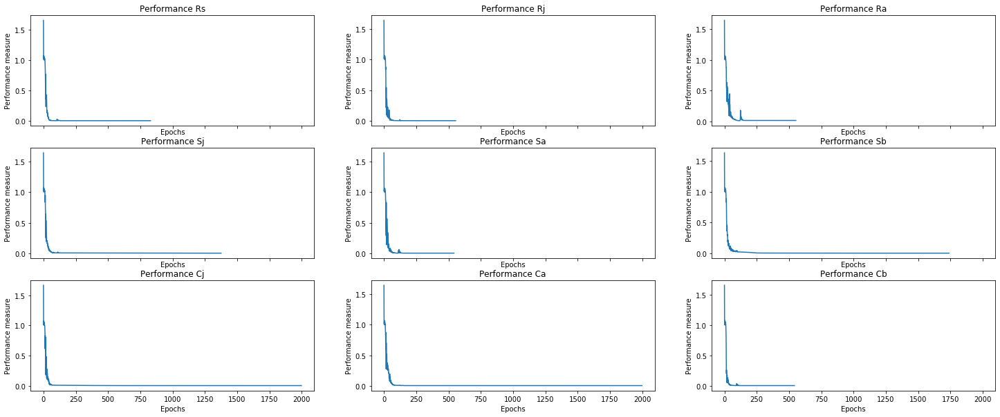

In [58]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

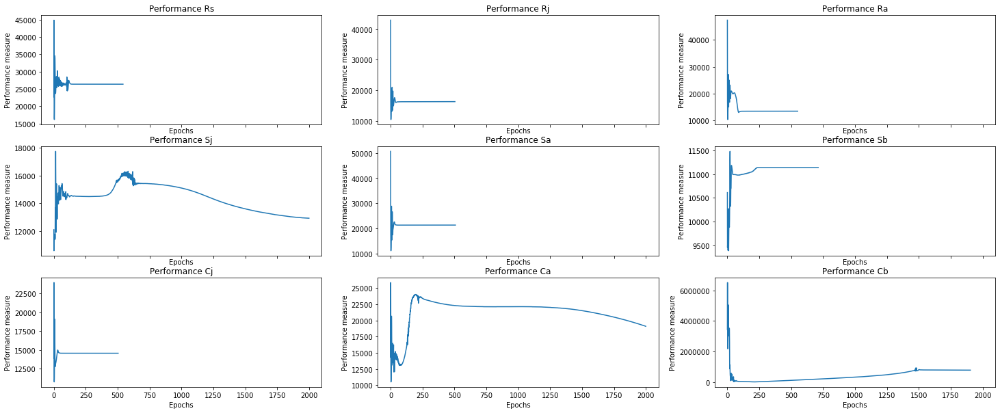

In [59]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [60]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 49741 --plot

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_0_20_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=49741, significance=0.9)

 Dataset:  power_EBT_0_20_dataset.csv


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_0_20_dataset.csv'

In [61]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 49741 --plot --train_test_split 0.8

Arguments: Namespace(cuda=False, data=['data/power_EBT_0_20_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=49741, train_test_split=0.8)


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_0_20_dataset.csv'

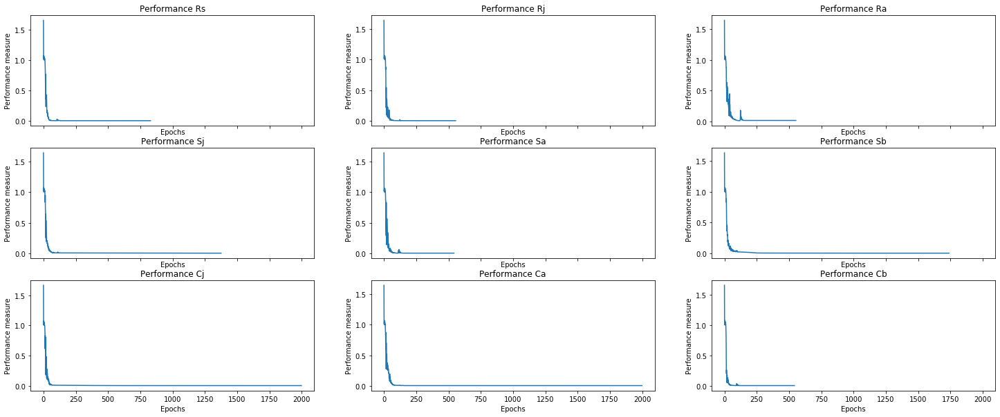

In [62]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

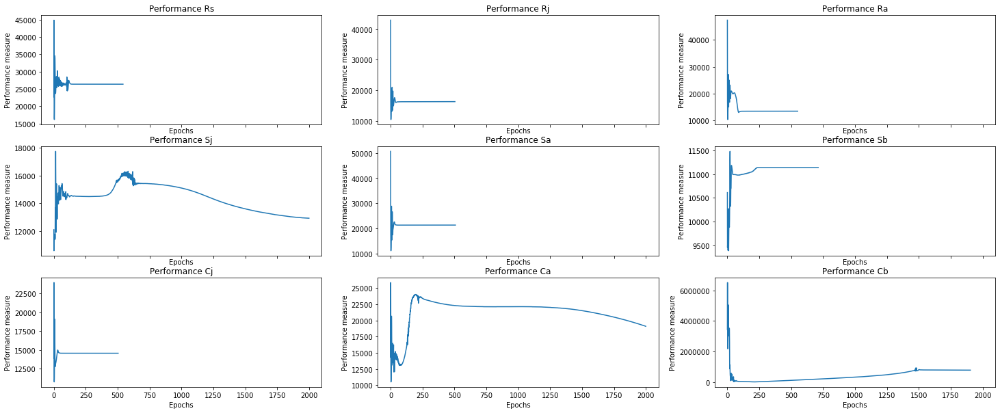

In [63]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [64]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 37786 --plot

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_0_20_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=37786, significance=0.9)

 Dataset:  power_EBT_0_20_dataset.csv


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_0_20_dataset.csv'

In [65]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 37786 --plot --train_test_split 0.8

Arguments: Namespace(cuda=False, data=['data/power_EBT_0_20_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=37786, train_test_split=0.8)


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_0_20_dataset.csv'

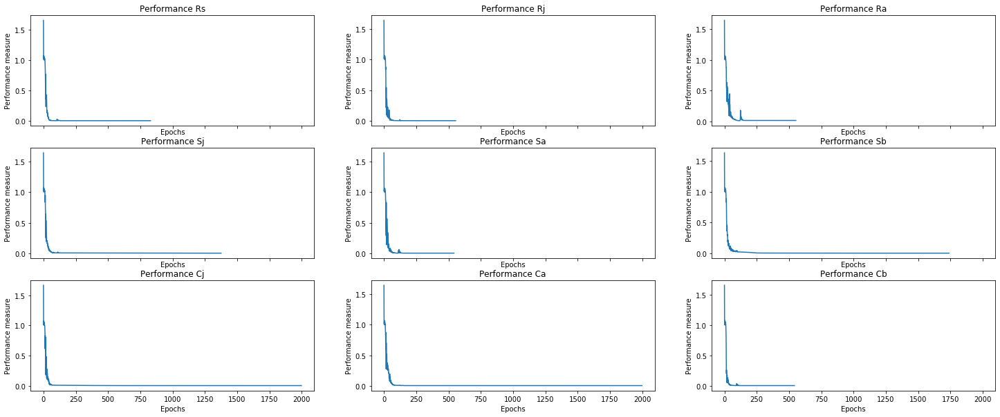

In [66]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

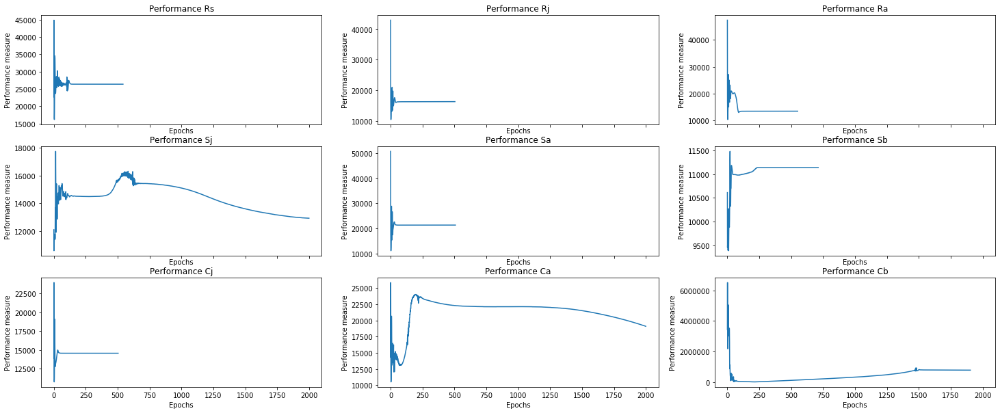

In [67]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 0-20 years: second run (increased hidden layers by 1, decreased dilation coefficient and kernel size by 1)

In [68]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 94139 --plot


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_0_20_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=94139, significance=0.9)

 Dataset:  power_EBT_0_20_dataset.csv


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_0_20_dataset.csv'

In [69]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 94139 --plot --train_test_split 0.8

Arguments: Namespace(cuda=False, data=['data/power_EBT_0_20_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=94139, train_test_split=0.8)


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_0_20_dataset.csv'

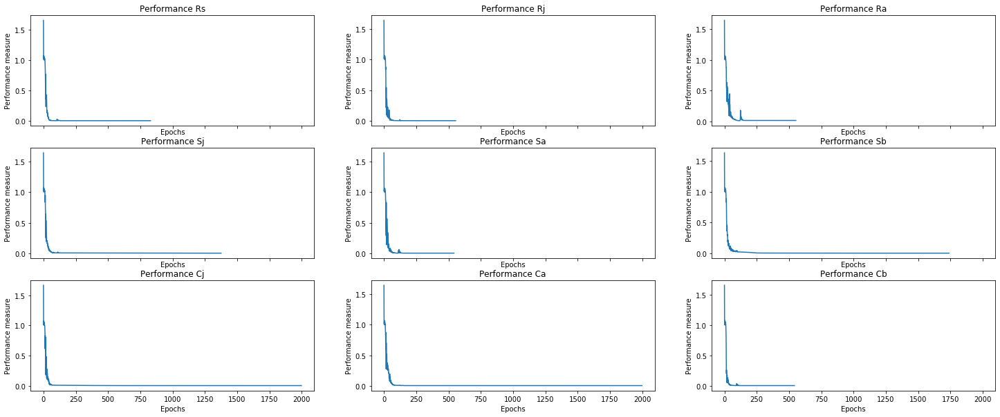

In [70]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

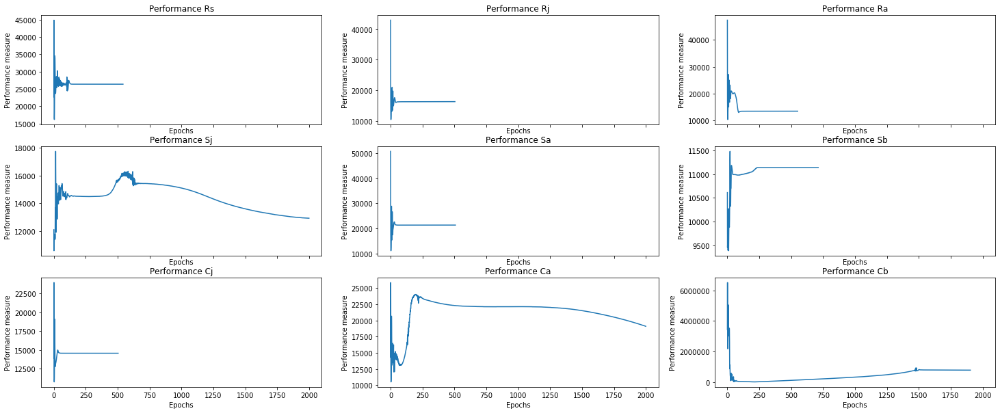

In [71]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [72]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 18147 --plot


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_0_20_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=18147, significance=0.9)

 Dataset:  power_EBT_0_20_dataset.csv


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_0_20_dataset.csv'

In [73]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 18147 --plot --train_test_split 0.8

Arguments: Namespace(cuda=False, data=['data/power_EBT_0_20_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=18147, train_test_split=0.8)


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_0_20_dataset.csv'

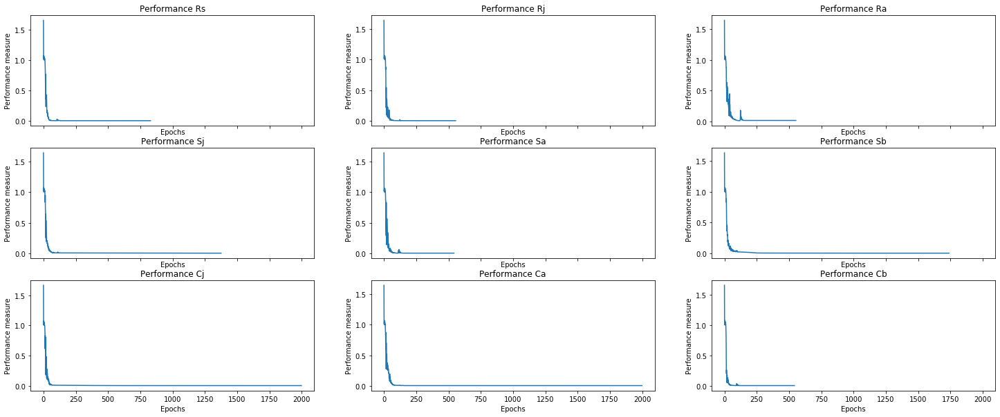

In [74]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

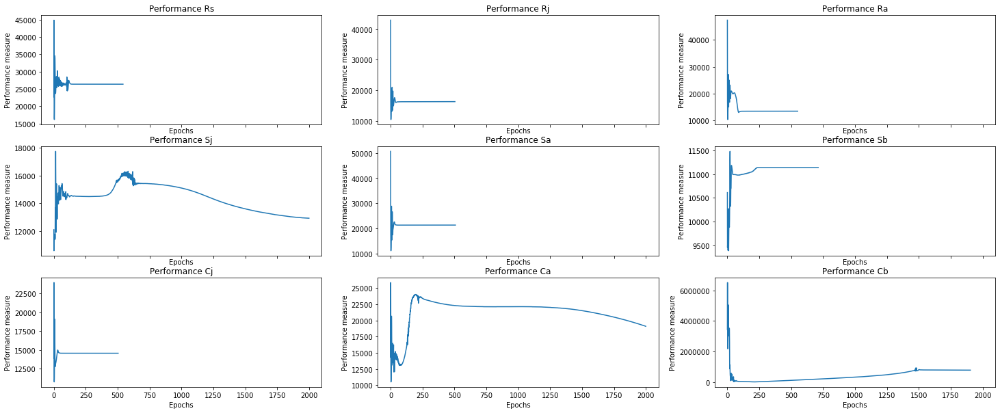

In [75]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [76]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 69089 --plot


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_0_20_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=69089, significance=0.9)

 Dataset:  power_EBT_0_20_dataset.csv


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_0_20_dataset.csv'

In [77]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 69089 --plot --train_test_split 0.8

Arguments: Namespace(cuda=False, data=['data/power_EBT_0_20_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=69089, train_test_split=0.8)


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_0_20_dataset.csv'

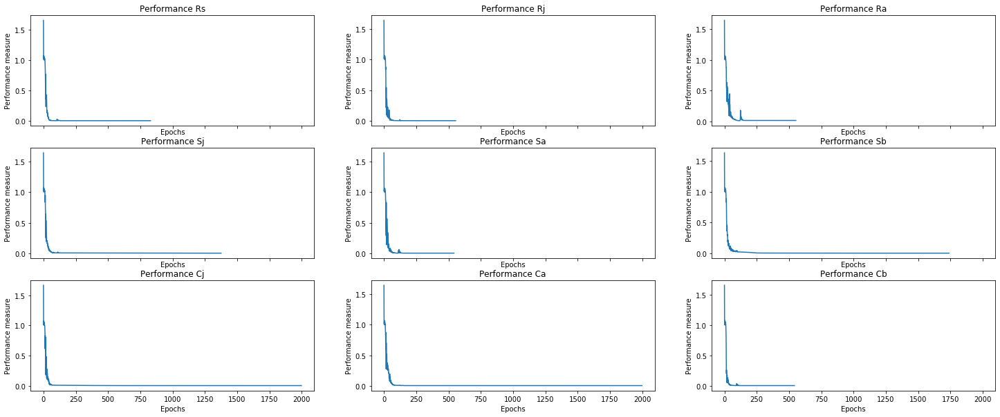

In [78]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

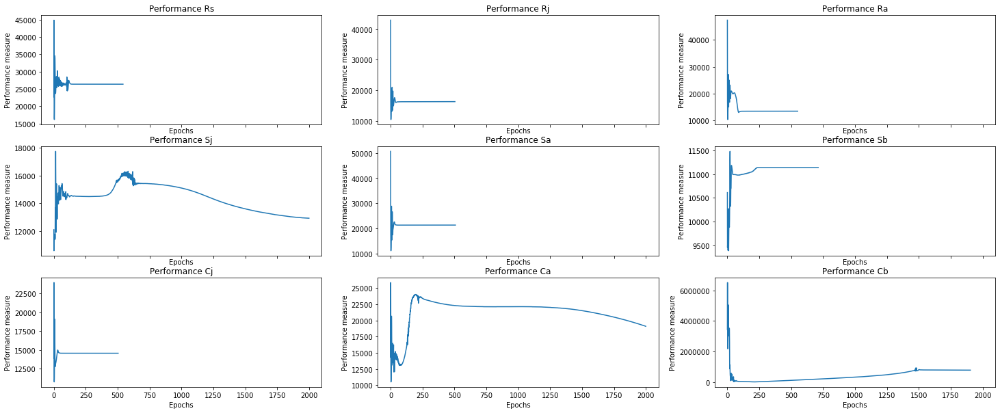

In [79]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 70 - 100 years

In [80]:
# Select data between 70 and 100 years
ebt_70_100 = select_data(ebt, 70, 100, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_EBT_70_100_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
ebt_70_100.to_csv(EBTScaled_path, index = False)

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:3202: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/numpy/core/_methods.py:195: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/numpy/core/_methods.py:199: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims)
/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:3237: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


ValueError: Input contains infinity or a value too large for dtype('float64').

#### TCDF 70-100: first run (in triplicate)

In [81]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 34321 --plot

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_70_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=34321, significance=0.9)

 Dataset:  power_EBT_70_100_dataset.csv


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_70_100_dataset.csv'

In [82]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 34321 --plot --train_test_split 0.8

Arguments: Namespace(cuda=False, data=['data/power_EBT_70_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=34321, train_test_split=0.8)


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_70_100_dataset.csv'

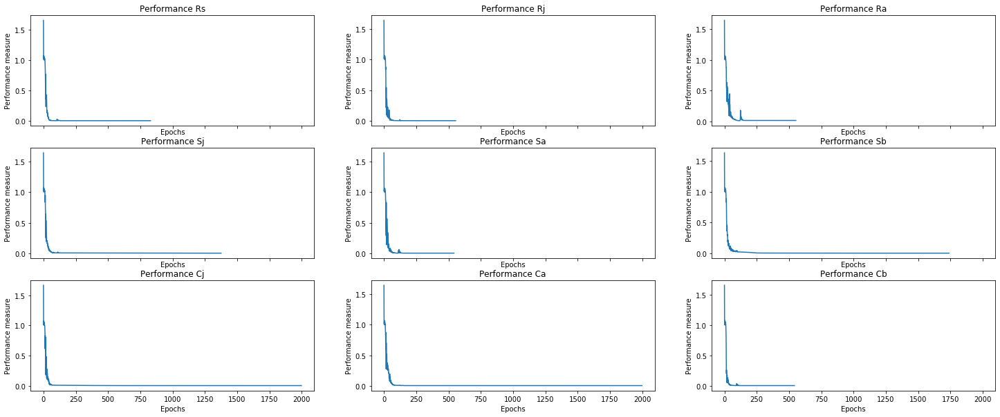

In [83]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

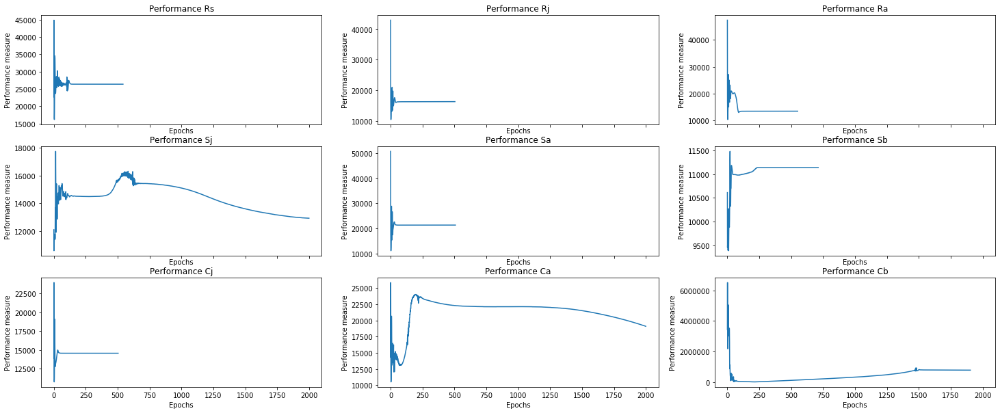

In [84]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [85]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 85672 --plot

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_70_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=85672, significance=0.9)

 Dataset:  power_EBT_70_100_dataset.csv


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_70_100_dataset.csv'

In [86]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 85672 --plot --train_test_split 0.8

Arguments: Namespace(cuda=False, data=['data/power_EBT_70_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=85672, train_test_split=0.8)


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_70_100_dataset.csv'

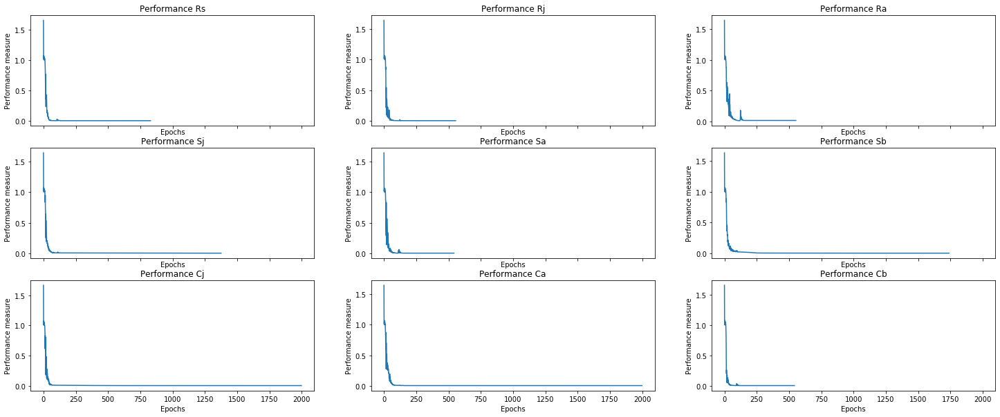

In [87]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

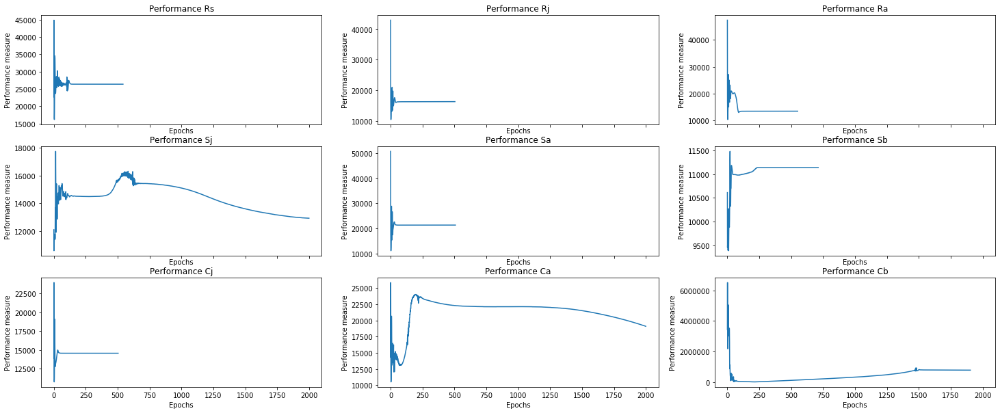

In [88]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [89]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 63109 --plot

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_70_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=63109, significance=0.9)

 Dataset:  power_EBT_70_100_dataset.csv


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_70_100_dataset.csv'

In [90]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 63109 --plot --train_test_split 0.8

Arguments: Namespace(cuda=False, data=['data/power_EBT_70_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=63109, train_test_split=0.8)


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_70_100_dataset.csv'

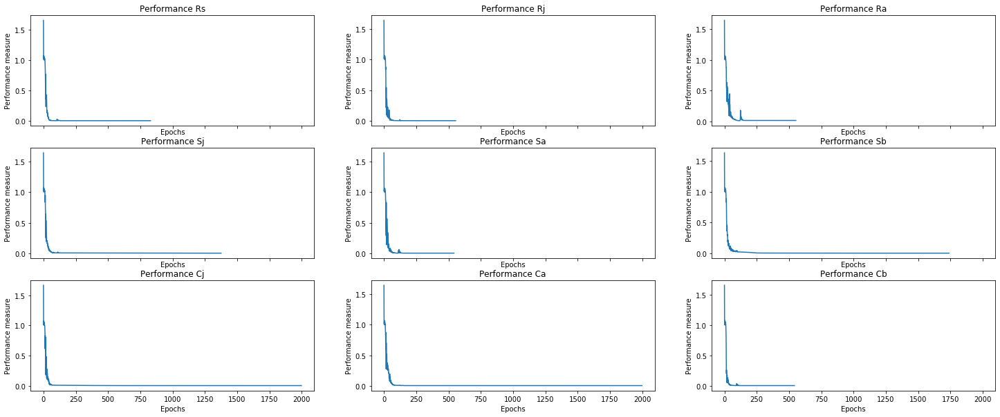

In [91]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

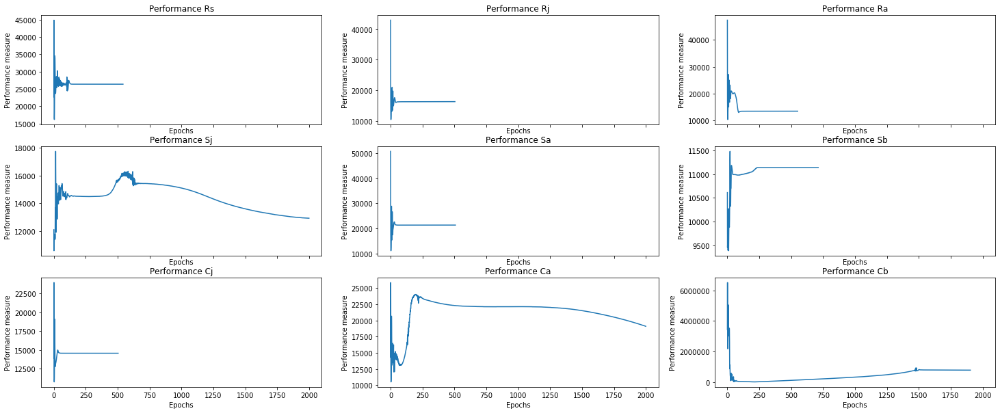

In [92]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 70-100: second run  (increased hidden layers by 1, decreased dilation coefficient and kernel size by 1)

In [93]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 1238 --plot

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_70_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=1238, significance=0.9)

 Dataset:  power_EBT_70_100_dataset.csv


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_70_100_dataset.csv'

In [94]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 1238 --plot --train_test_split 0.8

Arguments: Namespace(cuda=False, data=['data/power_EBT_70_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=1238, train_test_split=0.8)


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_70_100_dataset.csv'

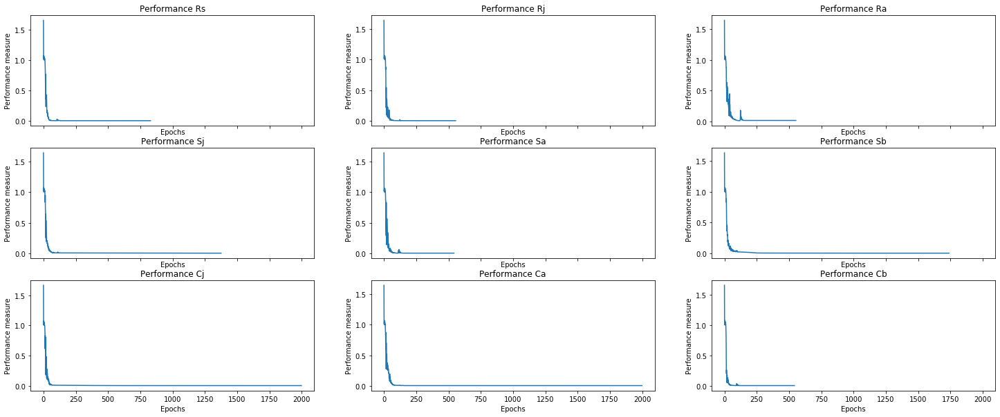

In [95]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

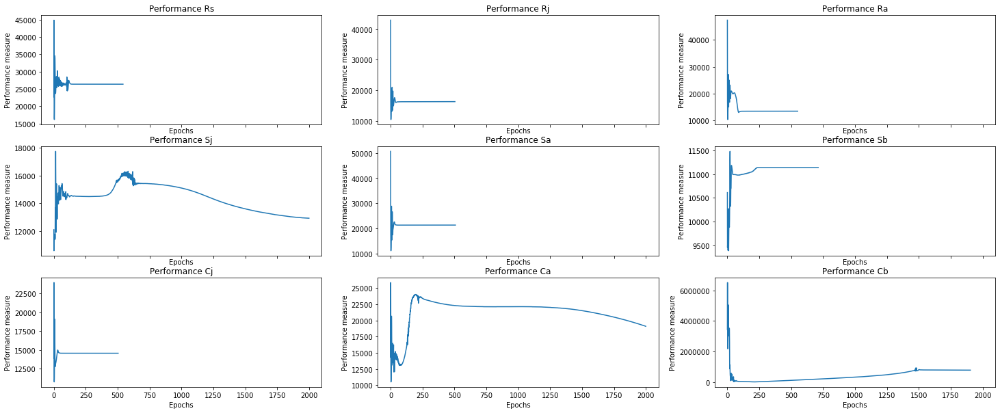

In [96]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [97]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 53988 --plot

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_70_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=53988, significance=0.9)

 Dataset:  power_EBT_70_100_dataset.csv


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_70_100_dataset.csv'

In [98]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 53988 --plot --train_test_split 0.8

Arguments: Namespace(cuda=False, data=['data/power_EBT_70_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=53988, train_test_split=0.8)


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_70_100_dataset.csv'

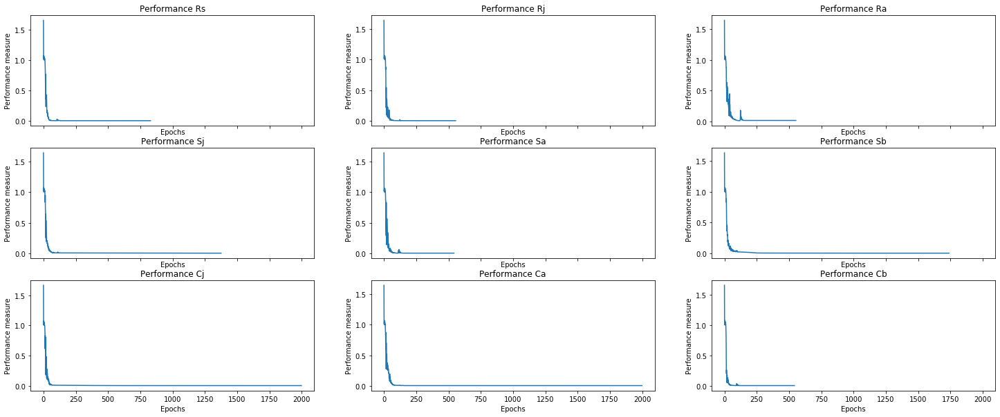

In [99]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

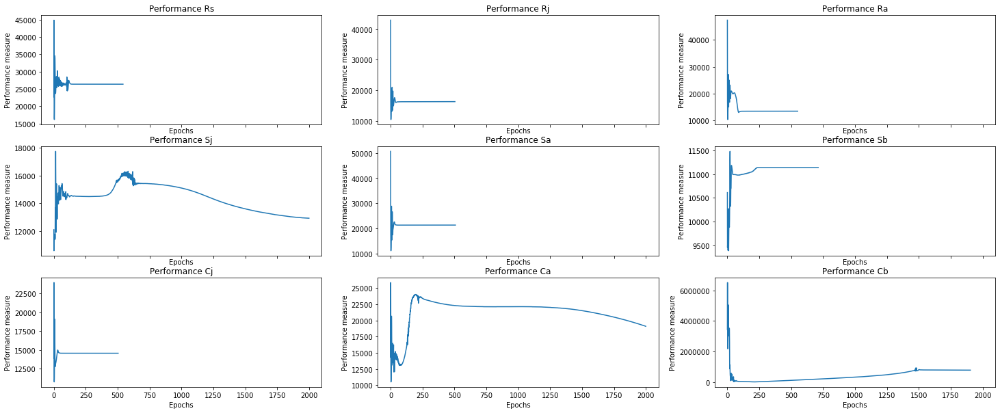

In [100]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [101]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 92422 --plot

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_70_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=92422, significance=0.9)

 Dataset:  power_EBT_70_100_dataset.csv


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_70_100_dataset.csv'

In [102]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 92422 --plot --train_test_split 0.8

Arguments: Namespace(cuda=False, data=['data/power_EBT_70_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=92422, train_test_split=0.8)


FileNotFoundError: [Errno 2] No such file or directory: 'data/power_EBT_70_100_dataset.csv'

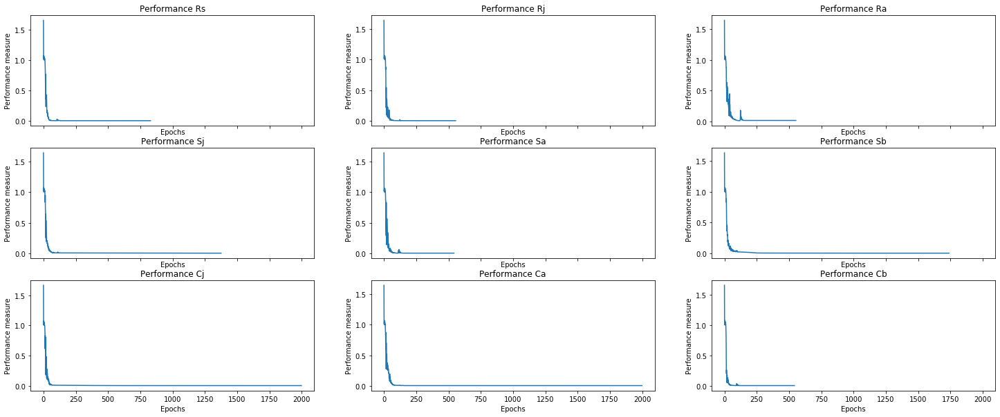

In [103]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

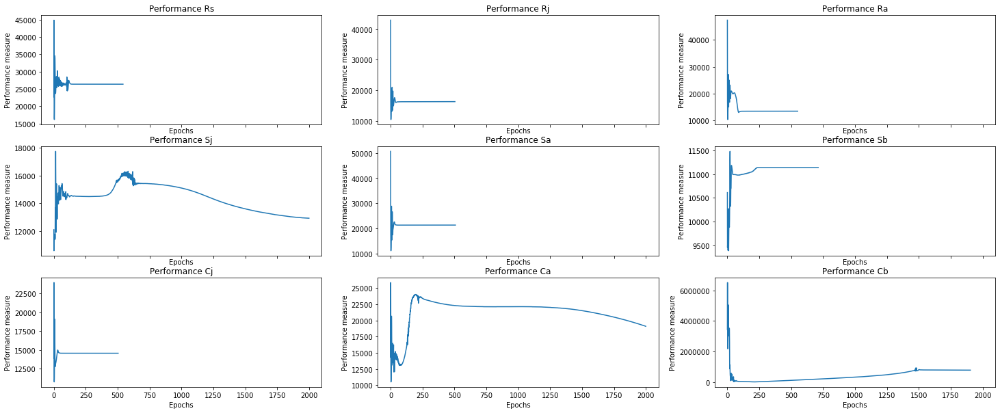

In [104]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

### TCDF with EBT transient dynamics

This data represents the tritrophic biomasses during the introduced fishing pressure on cod. At 20 years Fc increases and is put to a halt on 40 years. Therefore I split the transient dynamics into two separate transient phases: 20-40 years (fishing pressure increases linearly) and 40-70 years (searching for a new equilibrium).

#### 20 - 60 years

,Rs,Rj,Ra,Sj,Sa,Sb,Cj,Ca,Cb,Fc
0,1.581070,-1.326452,-0.132121,-1.497747,-1.702588,-1.671975,-0.145319,-0.424383,2.047950,-1.963964
1,1.581070,-1.326452,-0.132121,-1.497747,-1.702588,-1.671975,-0.145320,-0.424383,2.047950,-1.963562
2,1.581070,-1.326452,-0.132121,-1.497747,-1.702588,-1.671975,-0.145320,-0.424384,2.047950,-1.963159
3,1.581070,-1.326451,-0.132121,-1.497747,-1.702588,-1.671975,-0.145321,-0.424385,2.047950,-1.962756
4,1.581070,-1.326451,-0.132120,-1.497747,-1.702588,-1.671975,-0.145322,-0.424387,2.047950,-1.962354
...,...,...,...,...,...,...,...,...,...,...
14586,-1.704873,2.057709,1.578227,-1.986435,2.078170,-1.144538,-1.983791,-1.748472,-0.652092,1.596584
14587,-1.705029,2.057851,1.578227,-1.987032,2.078580,-1.146357,-1.983822,-1.748473,-0.652092,1.596777
14588,-1.705184,2.057992,1.578227,-1.987629,2.078989,-1.148176,-1.983852,-1.748473,-0.652092,1.596970
14589,-1.705340,2.058134,1.578228,-1.988226,2.079398,-1.149994,-1.983883,-1.748473,-0.652092,1.597164


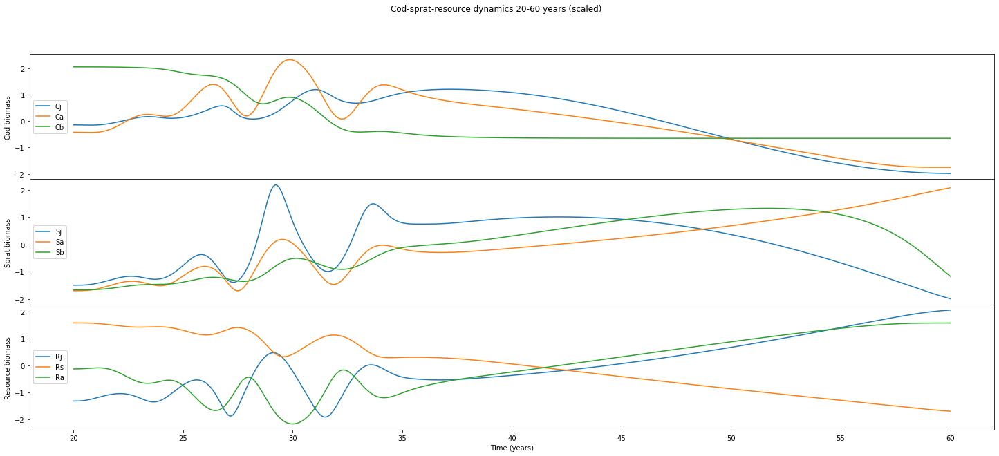

In [105]:
# Select data between 20 and 60 years
ebt_20_60 = select_data(ebt, 20, 60, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_EBT_20_60_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
ebt_20_60.to_csv(EBTScaled_path, index = False)

#### TCDF 20-60 years: first run (in triplicate)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=1000, ground_truth={'data/power_EBT_20_60_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=24310, significance=0.9)

 Dataset:  power_EBT_20_60_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.078675
Epoch   129: reducing learning rate of group 0 to 1.0000e-02.
Epoch   140: reducing learning rate of group 0 to 1.0000e-03.
Epoch   151: reducing learning rate of group 0 to 1.0000e-04.
Epoch   162: reducing learning rate of group 0 to 1.0000e-05.
Epoch   173: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [25%] 	Loss: 0.011936
Epoch: 500 [50%] 	Loss: 0.011853
INFO: Early stopping
Potential causes:  [8, 4]
Validated causes:  [4]

 Analysis started for target:  Rj
INF

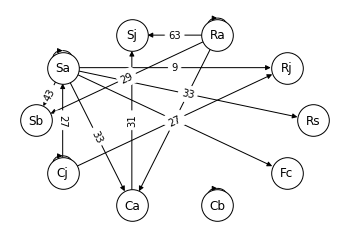

<Figure size 432x288 with 0 Axes>

In [106]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 1000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 24310 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_20_60_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=1000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=24310, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.547046
Epoch    35: reducing learning rate of group 0 to 1.0000e-02.
Epoch    46: reducing learning rate of group 0 to 1.0000e-03.
Epoch    57: reducing learning rate of group 0 to 1.0000e-04.
Epoch: 250 [25%] 	Loss: 0.047883
Epoch: 500 [50%] 	Loss: 0.040801
Epoch: 750 [75%] 	Loss: 0.033308
Epoch: 1000 [100%] 	Loss: 0.025984

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.019897
Epoch    15: reducing learning rate of group 0 to 1.0000e-02.
Epoch    36: reducing learning rate of group 0 

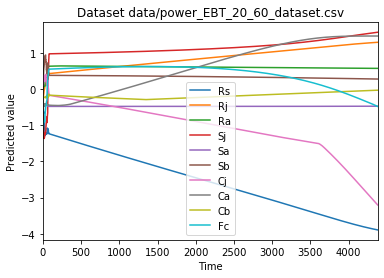

In [107]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 1000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 24310 --plot --train_test_split 0.7

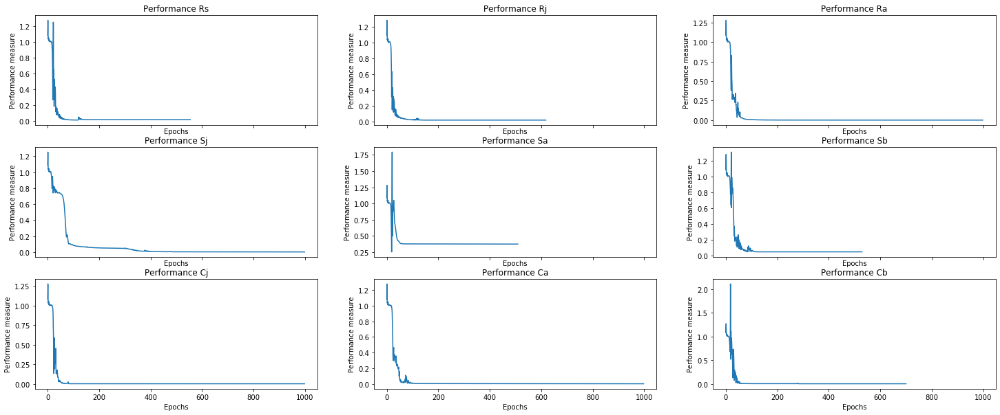

In [108]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

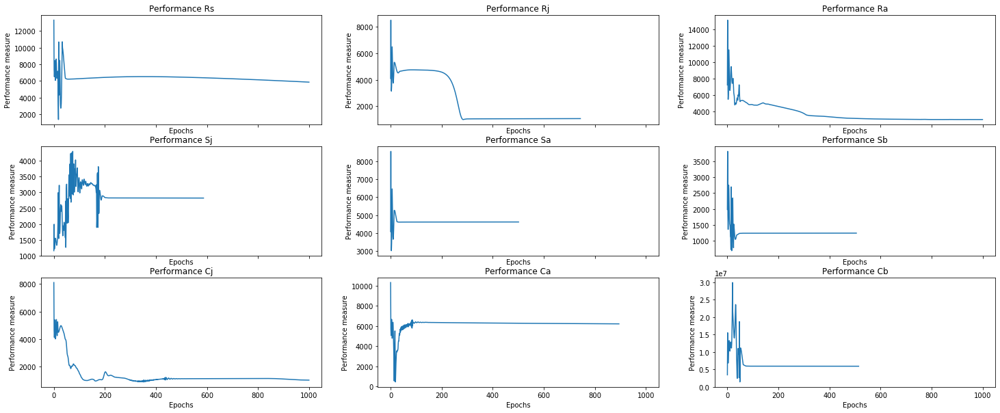

In [109]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=1000, ground_truth={'data/power_EBT_20_60_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=77139, significance=0.9)

 Dataset:  power_EBT_20_60_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.109549
Epoch   101: reducing learning rate of group 0 to 1.0000e-02.
Epoch   112: reducing learning rate of group 0 to 1.0000e-03.
Epoch   123: reducing learning rate of group 0 to 1.0000e-04.
Epoch   134: reducing learning rate of group 0 to 1.0000e-05.
Epoch   145: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [25%] 	Loss: 0.011047
Epoch: 500 [50%] 	Loss: 0.011034
INFO: Early stopping
Potential causes:  [5, 9, 1, 8, 3]
Validated causes:  [9]

 Analysis started for target

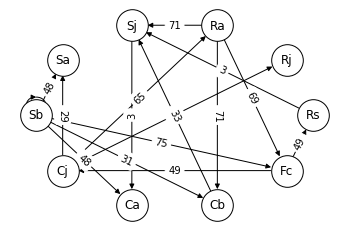

<Figure size 432x288 with 0 Axes>

In [110]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 1000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 77139 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_20_60_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=1000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=77139, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.214267
Epoch    42: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [25%] 	Loss: 0.028657
Epoch   495: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 500 [50%] 	Loss: 0.001011
Epoch: 750 [75%] 	Loss: 0.000851
Epoch: 1000 [100%] 	Loss: 0.000802

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.390099
Epoch   107: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [25%] 	Loss: 0.015266
Epoch: 500 [50%] 	Loss: 0.006960
Epoch: 750 [75%] 	Loss: 0.005140
Epoch   90

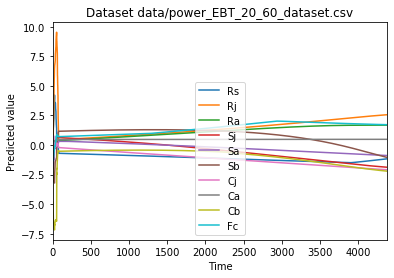

In [111]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 1000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 77139 --plot --train_test_split 0.7

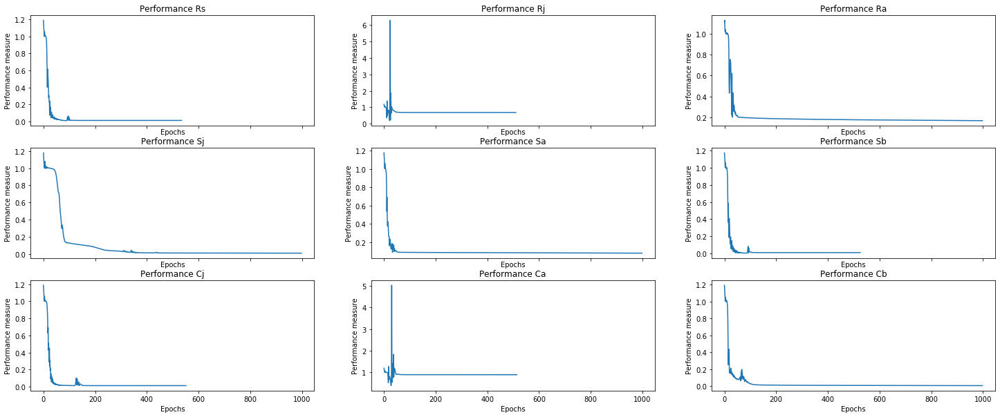

In [112]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

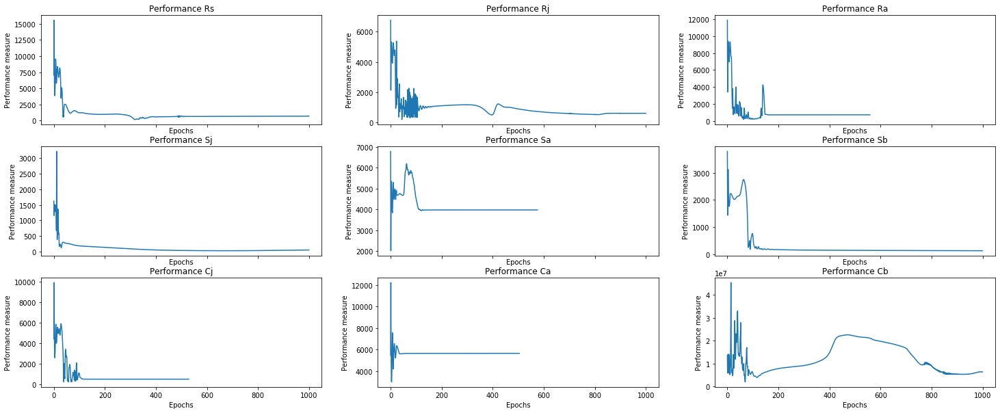

In [113]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=1000, ground_truth={'data/power_EBT_20_60_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=45184, significance=0.9)

 Dataset:  power_EBT_20_60_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.008141
Epoch    38: reducing learning rate of group 0 to 1.0000e-02.
Epoch    49: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [25%] 	Loss: 0.130828
Epoch: 500 [50%] 	Loss: 0.107560
Epoch: 750 [75%] 	Loss: 0.052727
Epoch: 1000 [100%] 	Loss: 0.009849
Potential causes:  [9, 1, 3, 7, 0]
Validated causes:  []

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.007941
Epoch    38: reducing lear

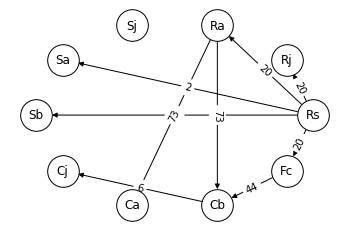

<Figure size 432x288 with 0 Axes>

In [114]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 1000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 45184 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_20_60_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=1000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=45184, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.861498
Epoch    56: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [25%] 	Loss: 0.000969
Epoch: 500 [50%] 	Loss: 0.000465
Epoch: 750 [75%] 	Loss: 0.000183
Epoch: 1000 [100%] 	Loss: 0.000069

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.549357
Epoch    51: reducing learning rate of group 0 to 1.0000e-02.
Epoch    62: reducing learning rate of group 0 to 1.0000e-03.
Epoch    73: reducing learning rate of group 0 to 1.0000e-04.
Epoch    84: reducing learning rate of group 0 

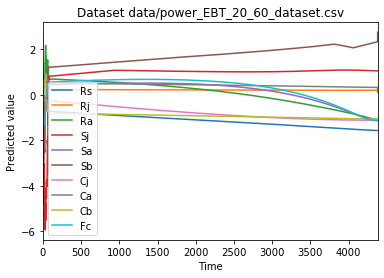

In [115]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 1000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 45184 --plot --train_test_split 0.7

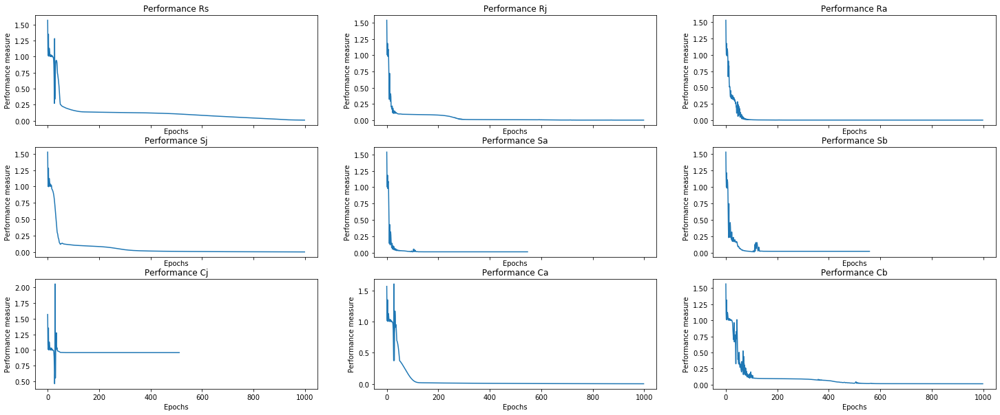

In [116]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

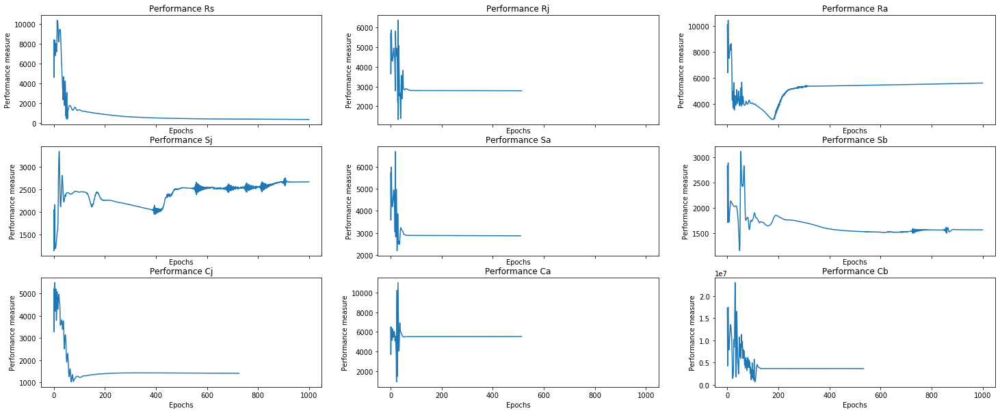

In [117]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 20-60 years: second run  (decreased hidden layers by 1, increased dilation coefficient and kernel size by 1)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_20_60_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=78025, significance=0.9)

 Dataset:  power_EBT_20_60_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.001070
Epoch    28: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.001886
Epoch: 500 [25%] 	Loss: 0.000470
Epoch: 750 [38%] 	Loss: 0.000230
Epoch: 1000 [50%] 	Loss: 0.000167
Epoch: 1250 [62%] 	Loss: 0.000144
Epoch: 1500 [75%] 	Loss: 0.000128
Epoch: 1750 [88%] 	Loss: 0.000116
Epoch  1774: reducing learning rate of group 0 to 1.0000e-03.
Epoch  1785: reducing learning rate of group 0 to 1.0000e-04.
Epoch  1804: reducing learning rate of group 0 to 1.0000e-05.
E

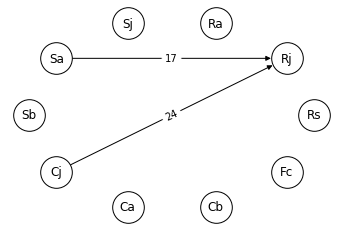

<Figure size 432x288 with 0 Axes>

In [118]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 78025 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_20_60_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=78025, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.730205
Epoch   125: reducing learning rate of group 0 to 1.0000e-02.
Epoch   148: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [12%] 	Loss: 0.002214
Epoch: 500 [25%] 	Loss: 0.001858
Epoch: 750 [38%] 	Loss: 0.001447
Epoch: 1000 [50%] 	Loss: 0.001033
Epoch: 1250 [62%] 	Loss: 0.000669
Epoch: 1500 [75%] 	Loss: 0.000403
Epoch: 1750 [88%] 	Loss: 0.000257
Epoch: 2000 [100%] 	Loss: 0.000203

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.671164
Epoch    27: reducing learning rate

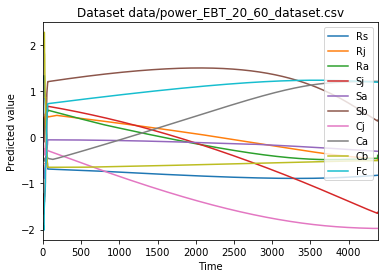

In [119]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 78025 --plot --train_test_split 0.7

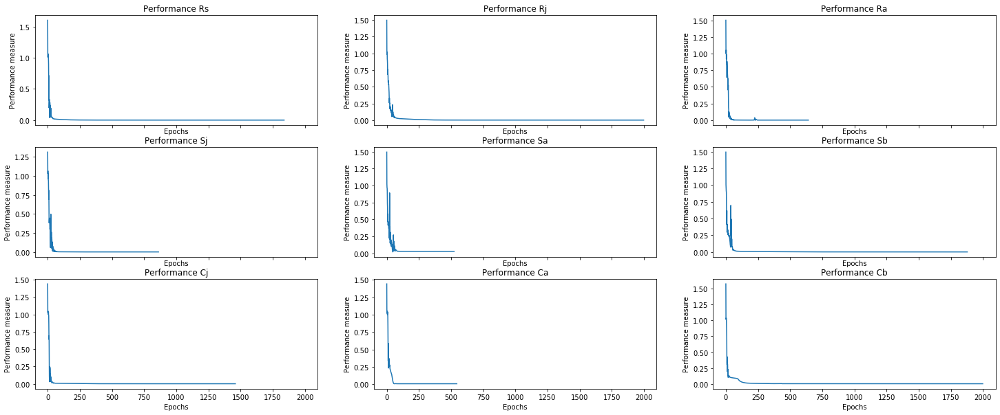

In [120]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

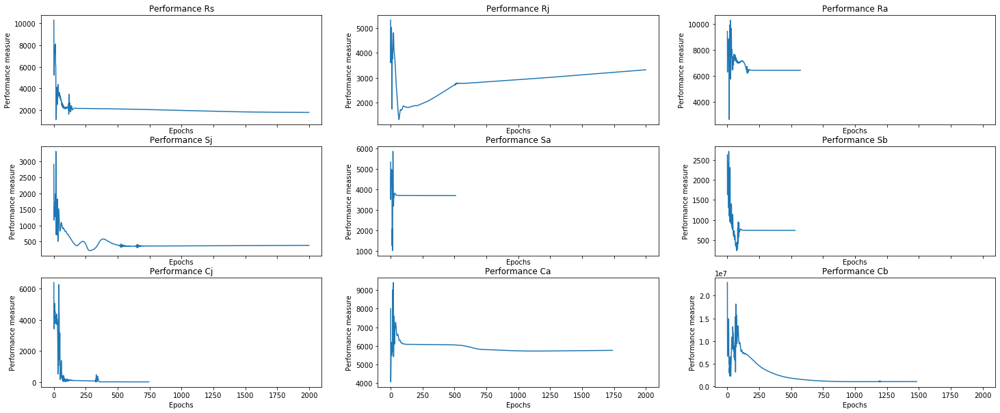

In [121]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_20_60_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=53391, significance=0.9)

 Dataset:  power_EBT_20_60_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.083651
Epoch    31: reducing learning rate of group 0 to 1.0000e-02.
Epoch    52: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [12%] 	Loss: 0.002980
Epoch: 500 [25%] 	Loss: 0.002778
Epoch: 750 [38%] 	Loss: 0.002604
Epoch: 1000 [50%] 	Loss: 0.002414
Epoch: 1250 [62%] 	Loss: 0.002187
Epoch: 1500 [75%] 	Loss: 0.001861
Epoch: 1750 [88%] 	Loss: 0.001370
Epoch: 2000 [100%] 	Loss: 0.000903
Potential causes:  [0, 4]
Validated causes:  [0]

 Analysis started for target:  Rj
INFO: 

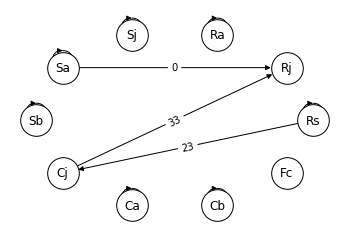

<Figure size 432x288 with 0 Axes>

In [122]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 53391 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_20_60_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=53391, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.144427
Epoch    82: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.000362
Epoch: 500 [25%] 	Loss: 0.000152
Epoch: 750 [38%] 	Loss: 0.000101
Epoch: 1000 [50%] 	Loss: 0.000083
Epoch: 1250 [62%] 	Loss: 0.000067
Epoch: 1500 [75%] 	Loss: 0.000054
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.409409
Epoch   112: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.001202
Epoch: 500 [25%] 	Loss: 0.001005
Epoch: 750 [38%] 

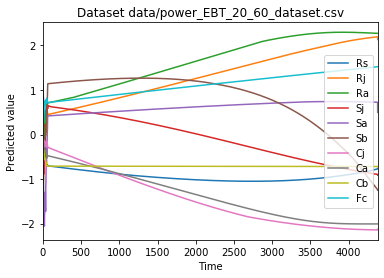

In [123]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 53391 --plot --train_test_split 0.7

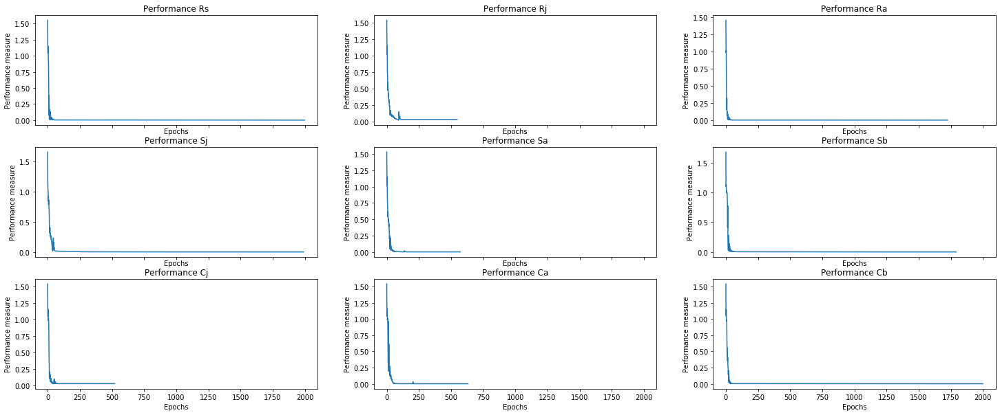

In [124]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

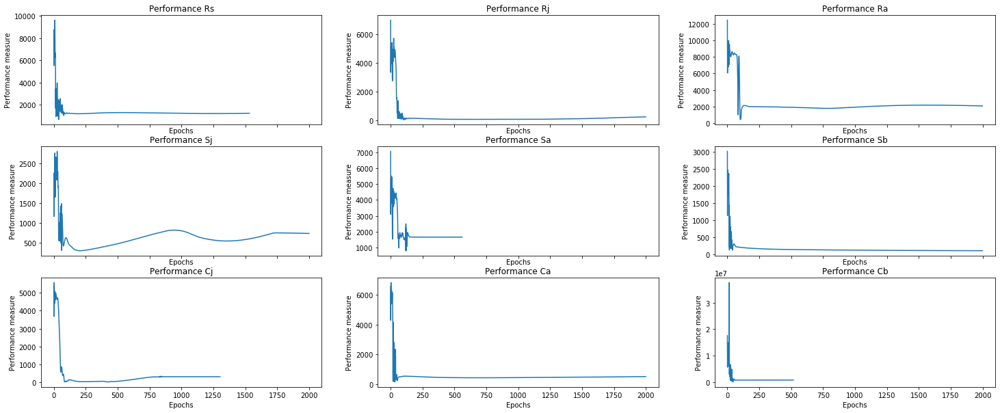

In [125]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_20_60_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=34061, significance=0.9)

 Dataset:  power_EBT_20_60_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.051339
Epoch    51: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.004252
Epoch   344: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 500 [25%] 	Loss: 0.000909
Epoch: 750 [38%] 	Loss: 0.000781
Epoch: 1000 [50%] 	Loss: 0.000667
Epoch: 1250 [62%] 	Loss: 0.000569
Epoch: 1500 [75%] 	Loss: 0.000483
Epoch: 1750 [88%] 	Loss: 0.000408
Epoch: 2000 [100%] 	Loss: 0.000345
Potential causes:  [2, 0, 5]
Validated causes:  [0]

 Analysis started for target:  Rj
INF

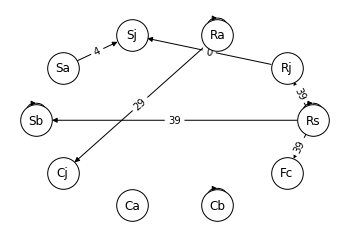

<Figure size 432x288 with 0 Axes>

In [126]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 34061 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_20_60_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=34061, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.046776
Epoch    84: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.001010
Epoch: 500 [25%] 	Loss: 0.000510
Epoch: 750 [38%] 	Loss: 0.000278
Epoch: 1000 [50%] 	Loss: 0.000207
Epoch: 1250 [62%] 	Loss: 0.000184
Epoch: 1500 [75%] 	Loss: 0.000167
Epoch: 1750 [88%] 	Loss: 0.000151
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.444915
Epoch    72: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.008288
Epoch: 500 [25%]

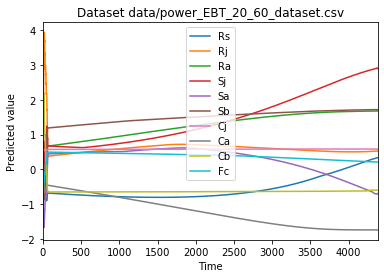

In [127]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 34061 --plot --train_test_split 0.7

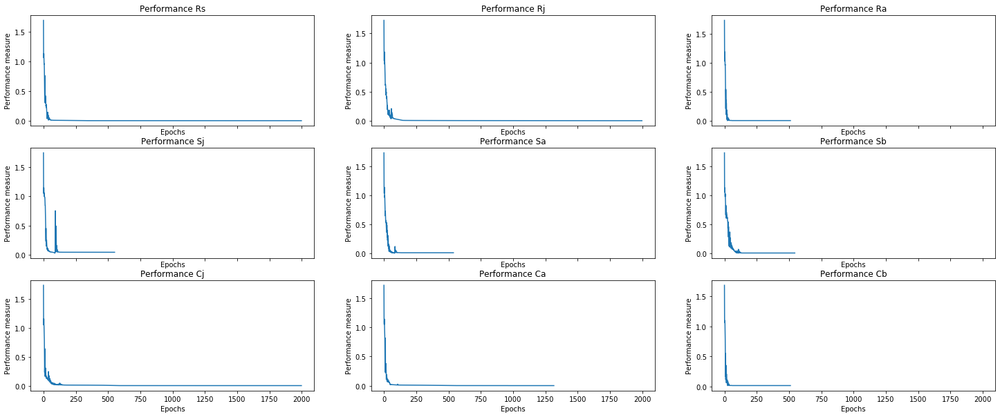

In [128]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

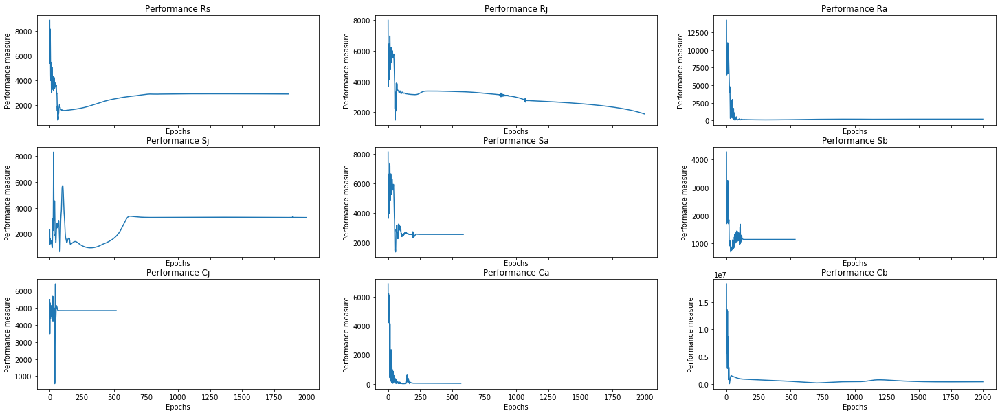

In [129]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 60 - 70 years

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:3237: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:3202: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/numpy/core/_methods.py:195: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/numpy/core/_methods.py:199: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims)


,Rs,Rj,Ra,Sj,Sa,Sb,Cj,Ca,Cb,Fc
0,0.0,-1.677118,1.573953,1.788484,-1.791699,1.688493,1.675900,-1.618859,-2.114859,0.0
1,0.0,-1.676263,1.576736,1.787762,-1.791003,1.687772,1.675523,-1.415895,-2.114588,0.0
2,0.0,-1.675480,1.568386,1.787035,-1.790306,1.687049,1.675145,-1.226154,-2.114267,0.0
3,0.0,-1.674760,1.550293,1.786302,-1.789609,1.686326,1.674766,-1.048770,-2.113896,0.0
4,0.0,-1.674096,1.522458,1.785563,-1.788910,1.685601,1.674386,-0.882920,-2.113476,0.0
...,...,...,...,...,...,...,...,...,...,...
3636,0.0,1.271717,1.373544,-1.274008,1.258848,-1.417328,-1.305200,-1.516083,-1.199746,0.0
3637,0.0,1.271906,1.374240,-1.274211,1.259044,-1.417641,-1.305411,-1.516656,-1.200415,0.0
3638,0.0,1.272094,1.374935,-1.274413,1.259240,-1.417955,-1.305623,-1.517228,-1.201084,0.0
3639,0.0,1.272282,1.374935,-1.274616,1.259435,-1.418268,-1.305833,-1.517800,-1.201752,0.0


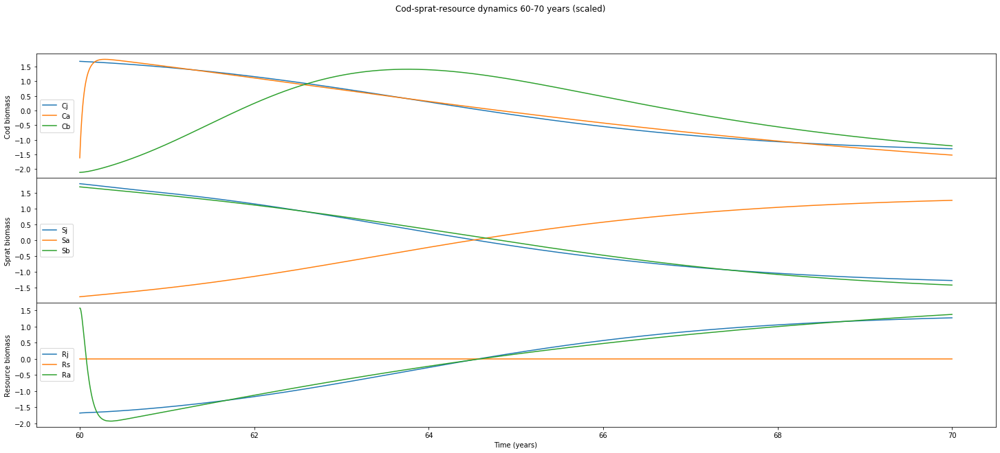

In [130]:
# Select data between 60 and 70 years
ebt_60_70 = select_data(ebt, 60, 70, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_EBT_60_70_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
ebt_60_70.to_csv(EBTScaled_path, index = False)

#### TCDF 60-70 years: first run (in triplicate)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_60_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=2369, significance=0.9)

 Dataset:  power_EBT_60_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.028979
Epoch    14: reducing learning rate of group 0 to 1.0000e-02.
Epoch    35: reducing learning rate of group 0 to 1.0000e-03.
Epoch    46: reducing learning rate of group 0 to 1.0000e-04.
Epoch    57: reducing learning rate of group 0 to 1.0000e-05.
Epoch    68: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.000130
Epoch: 500 [25%] 	Loss: 0.000122
INFO: Early stopping
Potential causes:  [4, 0, 9, 6]
Validated causes:  []

 Analysis started for target:  Rj

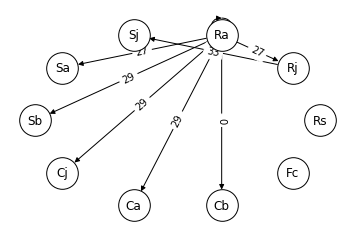

<Figure size 432x288 with 0 Axes>

In [131]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 2369 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_60_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=2369, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.029022
Epoch    45: reducing learning rate of group 0 to 1.0000e-02.
Epoch    62: reducing learning rate of group 0 to 1.0000e-03.
Epoch    73: reducing learning rate of group 0 to 1.0000e-04.
Epoch    84: reducing learning rate of group 0 to 1.0000e-05.
Epoch    95: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.000007
Epoch: 500 [25%] 	Loss: 0.000006
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.087688
Epoch: 250 [12%] 	Loss: 0.000323


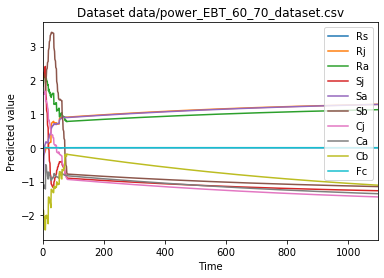

In [132]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 2369 --plot --train_test_split 0.7

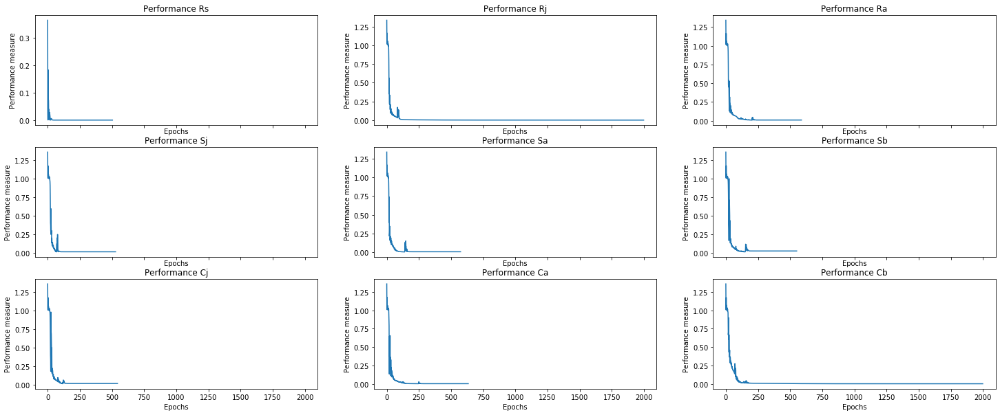

In [133]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

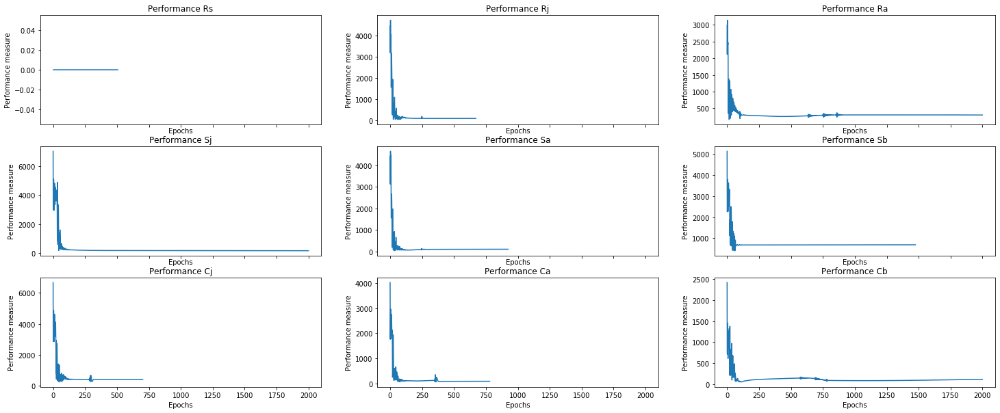

In [134]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_60_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=33520, significance=0.9)

 Dataset:  power_EBT_60_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.000350
Epoch    13: reducing learning rate of group 0 to 1.0000e-02.
Epoch    24: reducing learning rate of group 0 to 1.0000e-03.
Epoch    35: reducing learning rate of group 0 to 1.0000e-04.
Epoch    46: reducing learning rate of group 0 to 1.0000e-05.
Epoch    57: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.000456
Epoch: 500 [25%] 	Loss: 0.000445
INFO: Early stopping
Potential causes:  [1, 0, 9, 3, 6]
Validated causes:  [1, 0, 9, 3, 6]

 Analysis starte

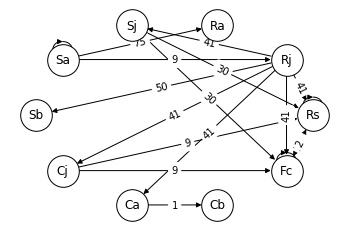

<Figure size 432x288 with 0 Axes>

In [135]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 33520 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_60_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=33520, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.000350
Epoch    14: reducing learning rate of group 0 to 1.0000e-02.
Epoch    25: reducing learning rate of group 0 to 1.0000e-03.
Epoch    36: reducing learning rate of group 0 to 1.0000e-04.
Epoch    47: reducing learning rate of group 0 to 1.0000e-05.
Epoch    58: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.000610
Epoch: 500 [25%] 	Loss: 0.000594
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.878747
Epoch: 250 [12%] 	Loss: 0.000245

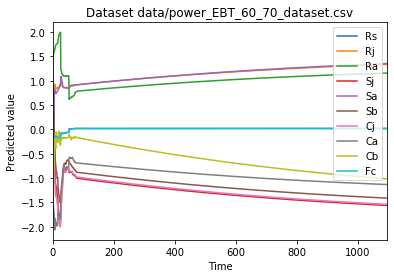

In [136]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 33520 --plot --train_test_split 0.7

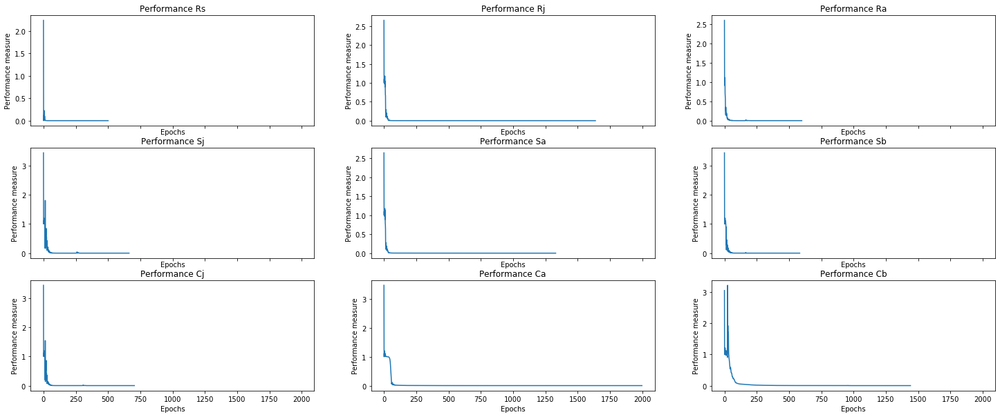

In [137]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

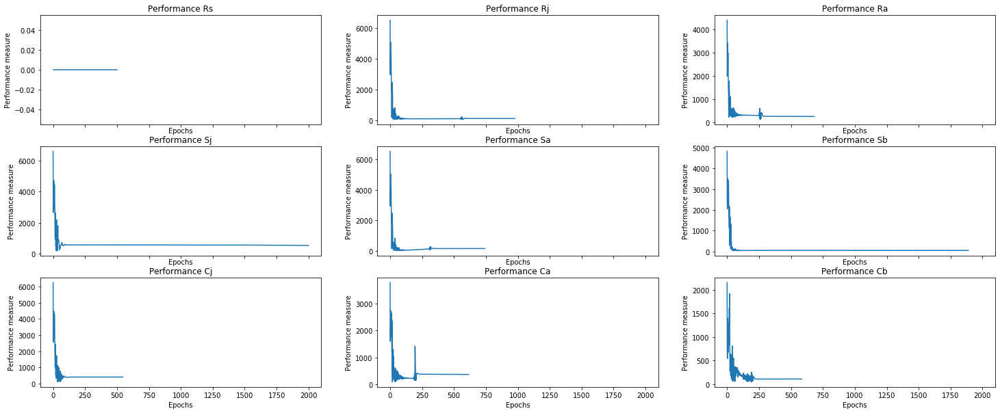

In [138]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_60_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=66848, significance=0.9)

 Dataset:  power_EBT_60_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.103884
Epoch    15: reducing learning rate of group 0 to 1.0000e-02.
Epoch    26: reducing learning rate of group 0 to 1.0000e-03.
Epoch    37: reducing learning rate of group 0 to 1.0000e-04.
Epoch    48: reducing learning rate of group 0 to 1.0000e-05.
Epoch    59: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.000309
Epoch: 500 [25%] 	Loss: 0.000294
INFO: Early stopping
Potential causes:  [3, 5, 0, 9, 1]
Validated causes:  []

 Analysis started for target:

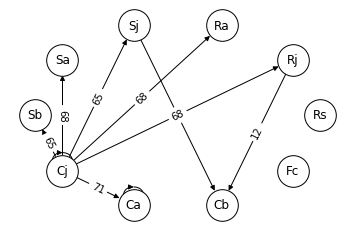

<Figure size 432x288 with 0 Axes>

In [139]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 66848 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_60_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=66848, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.103756
Epoch    16: reducing learning rate of group 0 to 1.0000e-02.
Epoch    27: reducing learning rate of group 0 to 1.0000e-03.
Epoch    38: reducing learning rate of group 0 to 1.0000e-04.
Epoch    49: reducing learning rate of group 0 to 1.0000e-05.
Epoch    60: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.000203
Epoch: 500 [25%] 	Loss: 0.000194
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.694106
Epoch    24: reducing learning r

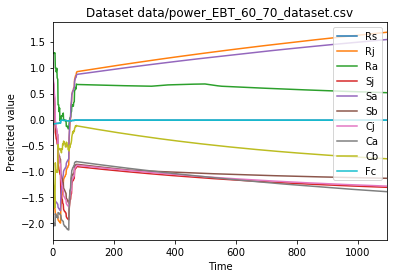

In [140]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 66848 --plot --train_test_split 0.7

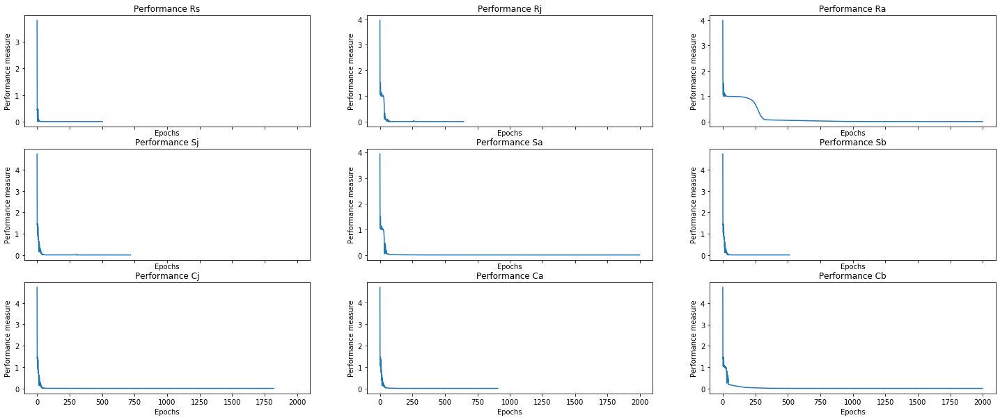

In [141]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

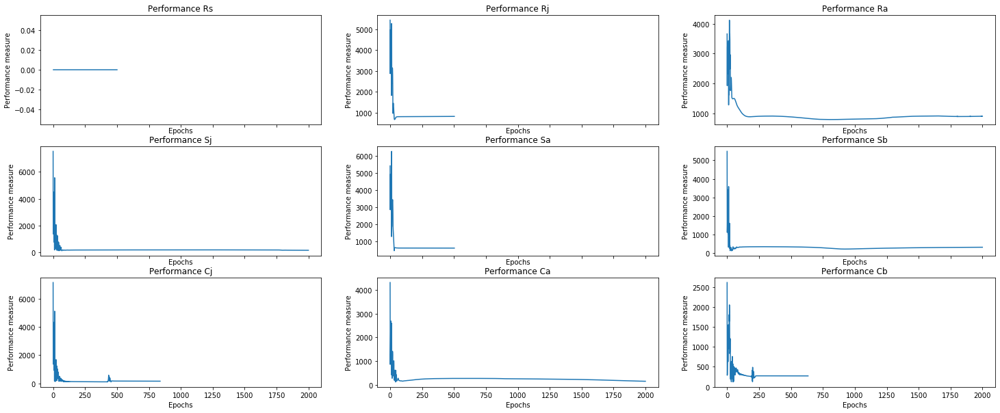

In [142]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 60-70 years: second run  (decreased hidden layers by 1, increased dilation coefficient and kernel size by 1)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_60_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=2369, significance=0.9)

 Dataset:  power_EBT_60_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.084943
Epoch    42: reducing learning rate of group 0 to 1.0000e-02.
Epoch    63: reducing learning rate of group 0 to 1.0000e-03.
Epoch    74: reducing learning rate of group 0 to 1.0000e-04.
Epoch    85: reducing learning rate of group 0 to 1.0000e-05.
Epoch    96: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.000007
Epoch: 500 [25%] 	Loss: 0.000007
INFO: Early stopping
Potential causes:  [5, 0, 9, 4, 1]
Validated causes:  []

 Analysis started for target: 

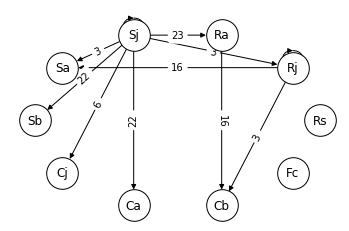

<Figure size 432x288 with 0 Axes>

In [143]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 2369 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_60_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=2369, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.084937
Epoch    21: reducing learning rate of group 0 to 1.0000e-02.
Epoch    32: reducing learning rate of group 0 to 1.0000e-03.
Epoch    43: reducing learning rate of group 0 to 1.0000e-04.
Epoch    54: reducing learning rate of group 0 to 1.0000e-05.
Epoch    65: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.000188
Epoch: 500 [25%] 	Loss: 0.000176
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.258213
Epoch    13: reducing learning ra

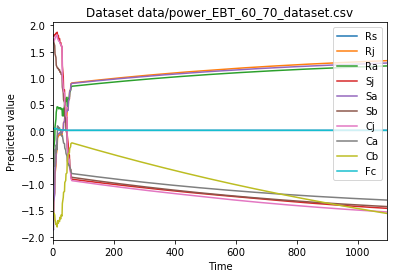

In [144]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 2369 --plot --train_test_split 0.7

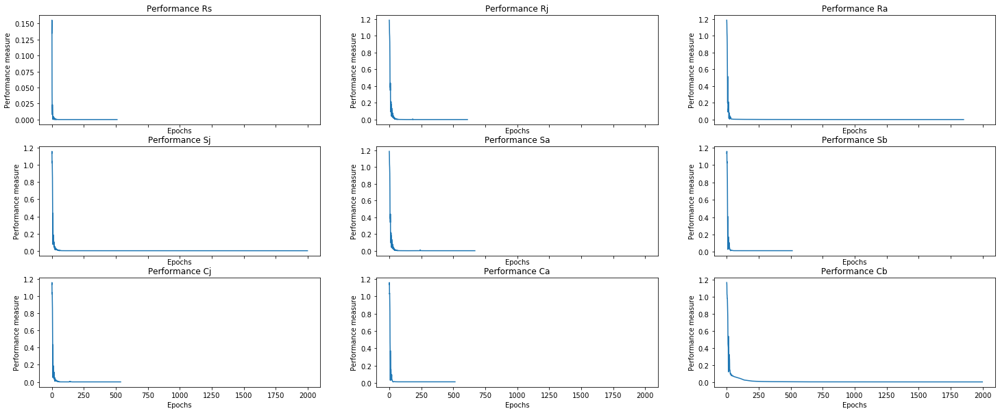

In [145]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

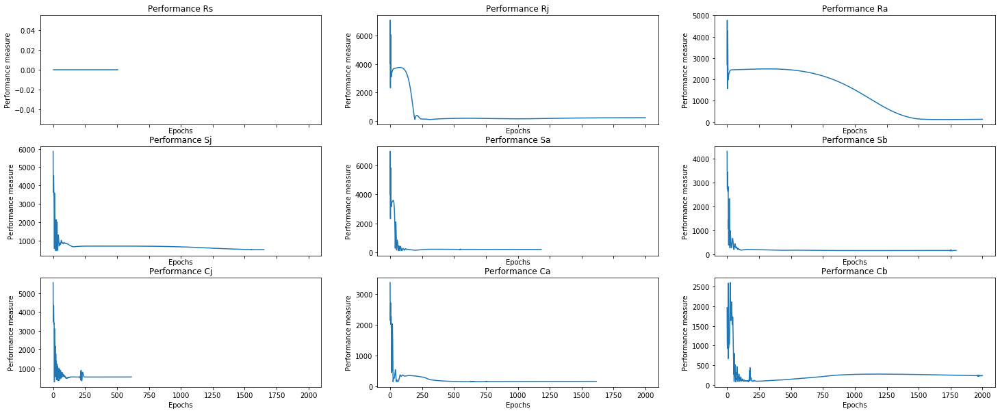

In [146]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_60_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=21312, significance=0.9)

 Dataset:  power_EBT_60_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.036411
Epoch: 250 [12%] 	Loss: 0.000000
Epoch: 500 [25%] 	Loss: 0.000000
INFO: Early stopping
Potential causes:  [0, 9, 6]
Validated causes:  []

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.036954
Epoch    30: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.002427
Epoch: 500 [25%] 	Loss: 0.001184
Epoch: 750 [38%] 	Loss: 0.000424
Epoch: 1000 [50%] 	Loss: 0.000258
Epoch: 1

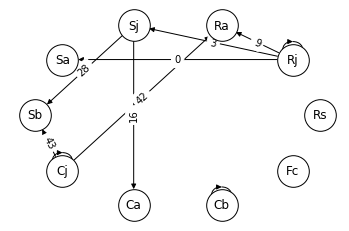

<Figure size 432x288 with 0 Axes>

In [147]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 21312 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_60_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=21312, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.036370
Epoch    36: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.000002
Epoch: 500 [25%] 	Loss: 0.000001
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.751755
Epoch   198: reducing learning rate of group 0 to 1.0000e-02.
Epoch   209: reducing learning rate of group 0 to 1.0000e-03.
Epoch   220: reducing learning rate of group 0 to 1.0000e-04.
Epoch   231: reducing learning rate of group 0 to 1.0000e-05.
Epoch   242: reducing learning r

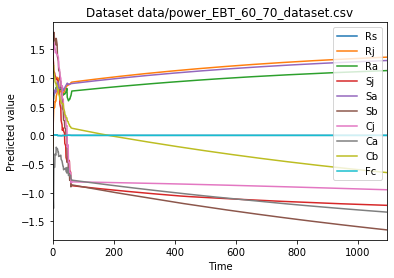

In [148]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 21312 --plot --train_test_split 0.7

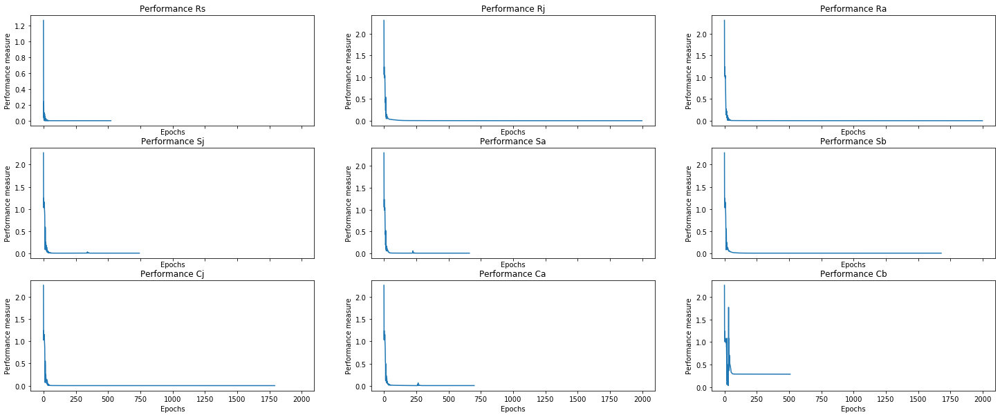

In [149]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

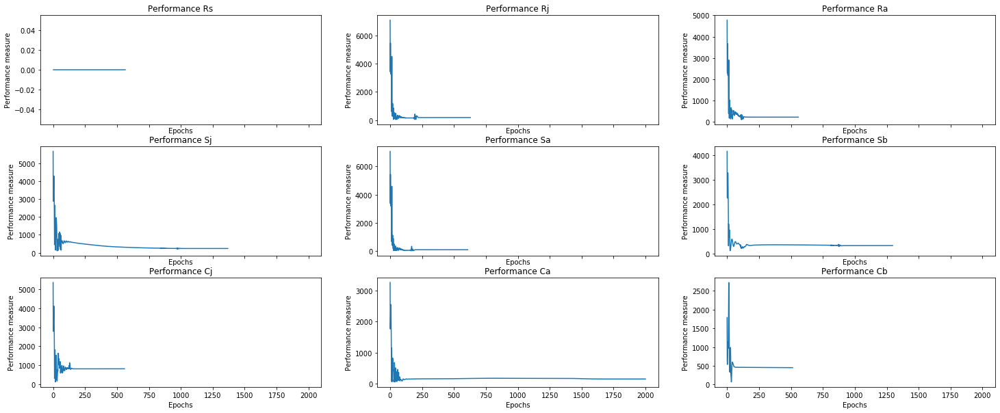

In [150]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_EBT_60_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=8023, significance=0.9)

 Dataset:  power_EBT_60_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.003543
Epoch    50: reducing learning rate of group 0 to 1.0000e-02.
Epoch    68: reducing learning rate of group 0 to 1.0000e-03.
Epoch    79: reducing learning rate of group 0 to 1.0000e-04.
Epoch    90: reducing learning rate of group 0 to 1.0000e-05.
Epoch   101: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.000010
Epoch: 500 [25%] 	Loss: 0.000009
INFO: Early stopping
Potential causes:  [2, 0, 9, 1]
Validated causes:  []

 Analysis started for target:  Rj

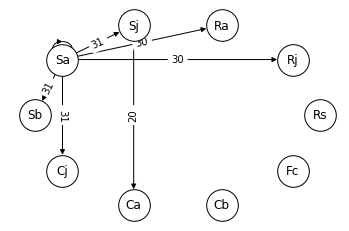

<Figure size 432x288 with 0 Axes>

In [151]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 8023 --plot

Arguments: Namespace(cuda=False, data=['data/power_EBT_60_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=8023, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.003563
Epoch    24: reducing learning rate of group 0 to 1.0000e-02.
Epoch    35: reducing learning rate of group 0 to 1.0000e-03.
Epoch    46: reducing learning rate of group 0 to 1.0000e-04.
Epoch    57: reducing learning rate of group 0 to 1.0000e-05.
Epoch    68: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.000269
Epoch: 500 [25%] 	Loss: 0.000253
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.957131
Epoch    48: reducing learning ra

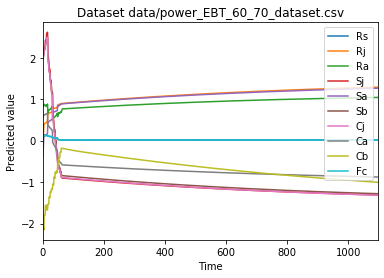

In [152]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 8023 --plot --train_test_split 0.7

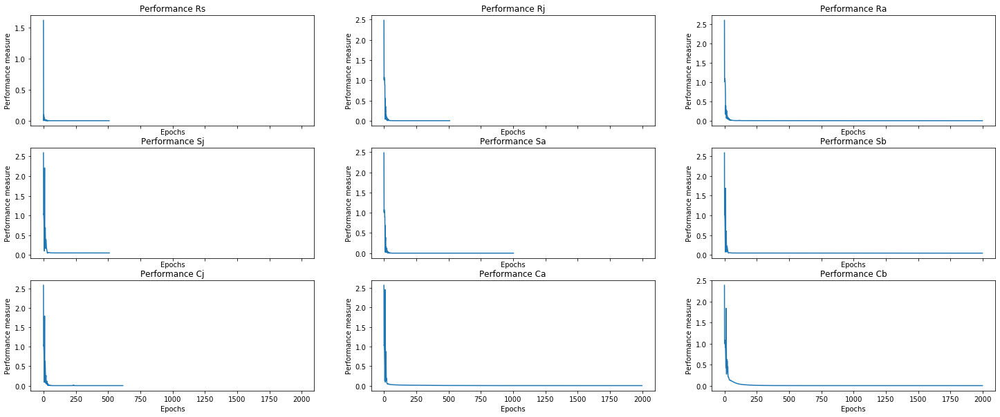

In [153]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

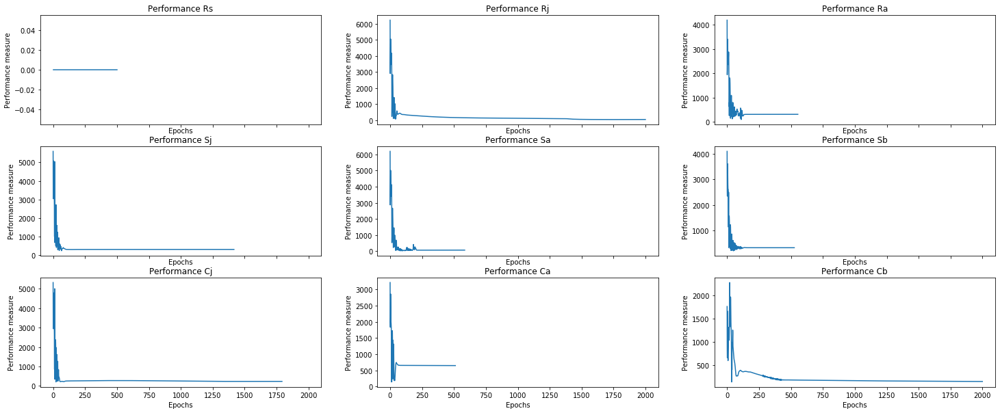

In [154]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

## TCDF: Noisy Data

Same exact models are run with noisy data.

### Adding white noise (Additive White Gaussian Noise)

Training the model with additive noise might be helpful in avoiding overfitting of the model. Data in this section is augmented by adding noise with additive white Gaussian noise. Three different datasets are provided - SNR 1:0.1, 1:1, 1:10. Each noisy dataset is analysed with optimized (hyper)parameters for the particular dataset to increase performance and accuracy.

### Signal to Noise ratio 1:0.1

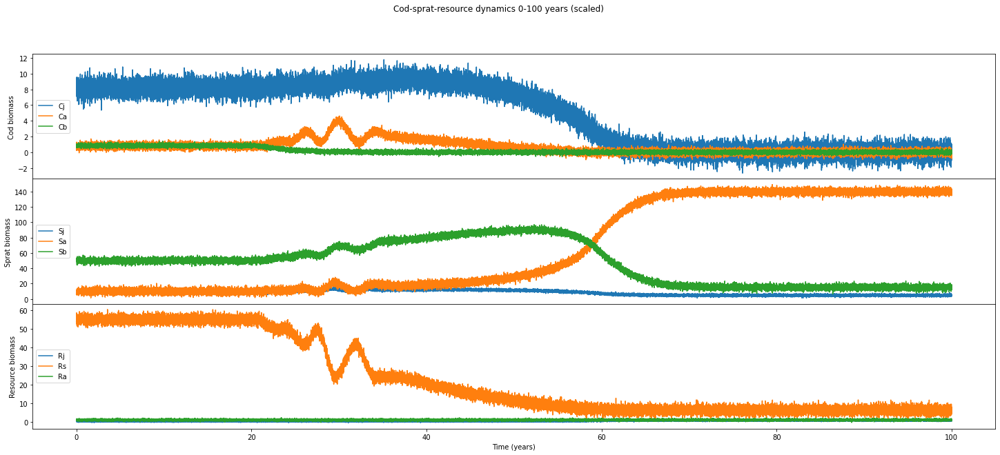

In [17]:
# Create new dataset with snr 1:0.1
noisy_ebt = noisy_data(10)

#### 20 - 70 years

,Rs,Rj,Ra,Sj,Sa,Sb,Cj,Ca,Cb,Fc
0,1.680729,-0.757742,0.054963,-0.904510,-2.227742,-0.843036,0.677976,0.183983,2.460289,-2.203112
1,1.664478,0.214982,-0.411612,-0.413866,-1.633669,-0.981038,0.146163,-0.591955,2.747335,-1.384775
2,1.640516,-0.561261,-0.661548,-0.429361,-1.034234,-0.876753,0.993794,-0.467706,2.602478,-0.883535
3,1.680642,-0.970204,0.534852,-0.989351,-1.203531,-0.764601,0.439583,0.175696,2.481862,-1.354278
4,1.616996,-0.843943,1.441987,-0.538778,-1.342420,-0.949640,0.355393,0.145514,2.307448,-1.208114
...,...,...,...,...,...,...,...,...,...,...
18236,-1.919256,1.177335,-0.170236,-2.010766,1.566525,-1.852378,-1.810302,-1.179329,-1.170567,-1.015615
18237,-1.218339,1.704113,2.986704,-1.929987,1.592859,-1.805275,-1.802263,-1.058086,0.469451,-1.345702
18238,-0.852467,0.945798,0.132807,-1.113718,1.588232,-1.821928,-1.870490,-1.396245,0.644088,-1.396557
18239,-1.139321,1.498177,-1.349068,-1.396985,1.575743,-1.889205,-1.683030,-1.224163,-0.574852,-1.379558


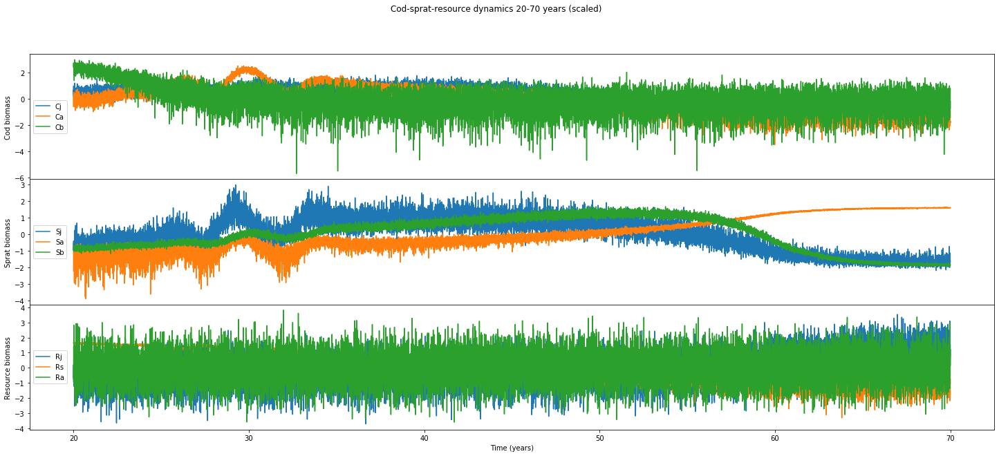

In [156]:
# Select data between 20 and 70 years
noisy_ebt_20_70 = select_data(noisy_ebt, 20, 70, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_0.1_noisy_EBT_20_70_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_20_70.to_csv(EBTScaled_path, index = False)

#### TCDF 20-70 years: first run (in triplicate)

In [157]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 5678


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=5678, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.020137
Epoch    95: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.052234
Epoch: 500 [25%] 	Loss: 0.046476
Epoch   567: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 750 [38%] 	Loss: 0.045120
Epoch: 1000 [50%] 	Loss: 0.045001
Epoch: 1250 [62%] 	Loss: 0.044888
Epoch: 1500 [75%] 	Loss: 0.044770
Epoch: 1750 [88%] 	Loss: 0.044634
Epoch: 2000 [100%] 	Loss: 0.044503
Potential causes:  [3, 9, 4, 1, 5]
Validated causes:  [4]

 Analys

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_20_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=5467, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.601708
Epoch    34: reducing learning rate of group 0 to 1.0000e-02.
Epoch    45: reducing learning rate of group 0 to 1.0000e-03.
Epoch    56: reducing learning rate of group 0 to 1.0000e-04.
Epoch    67: reducing learning rate of group 0 to 1.0000e-05.
Epoch    78: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.236874
Epoch: 500 [25%] 	Loss: 0.236733
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.152328
Epoch: 250 [12%] 	Los

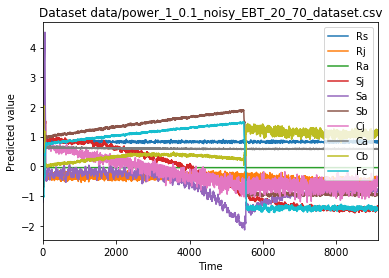

In [158]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 5467 --plot --train_test_split 0.5

In [159]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 2371


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=2371, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.033840
Epoch: 250 [12%] 	Loss: 0.043054
Epoch   261: reducing learning rate of group 0 to 1.0000e-02.
Epoch   290: reducing learning rate of group 0 to 1.0000e-03.
Epoch   309: reducing learning rate of group 0 to 1.0000e-04.
Epoch   320: reducing learning rate of group 0 to 1.0000e-05.
Epoch   331: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.042904
INFO: Early stopping
Potential causes:  [0, 3]
Validated causes:  [0]

 Analysis sta

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_20_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=2371, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.730678
Epoch   101: reducing learning rate of group 0 to 1.0000e-02.
Epoch   112: reducing learning rate of group 0 to 1.0000e-03.
Epoch   123: reducing learning rate of group 0 to 1.0000e-04.
Epoch   134: reducing learning rate of group 0 to 1.0000e-05.
Epoch   145: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.086871
Epoch: 500 [25%] 	Loss: 0.086833
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.028857
Epoch   144: reducing

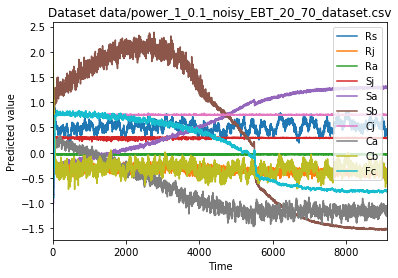

In [160]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 2371 --plot --train_test_split 0.5

In [161]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 1084


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=1084, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.058381
Epoch   152: reducing learning rate of group 0 to 1.0000e-02.
Epoch   163: reducing learning rate of group 0 to 1.0000e-03.
Epoch   174: reducing learning rate of group 0 to 1.0000e-04.
Epoch   185: reducing learning rate of group 0 to 1.0000e-05.
Epoch   196: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.045027
Epoch: 500 [25%] 	Loss: 0.045024
INFO: Early stopping
Potential causes:  [6, 0]
Validated causes:  [6]

 Analysis sta

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_20_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=1048, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.825316
Epoch   136: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.008458
Epoch: 500 [25%] 	Loss: 0.007275
Epoch: 750 [38%] 	Loss: 0.006955
Epoch: 1000 [50%] 	Loss: 0.006781
Epoch: 1250 [62%] 	Loss: 0.006665
Epoch: 1500 [75%] 	Loss: 0.006570
Epoch: 1750 [88%] 	Loss: 0.006483
Epoch: 2000 [100%] 	Loss: 0.006406

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.960445
Epoch    27: reducing learning rate of group 0 to 1.0000e-02.
Epoch    48: reducing le

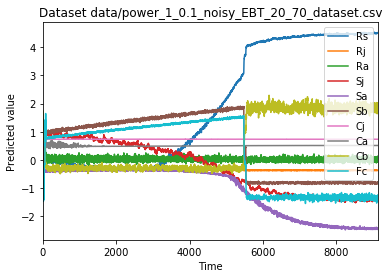

In [162]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 1048 --plot --train_test_split 0.5

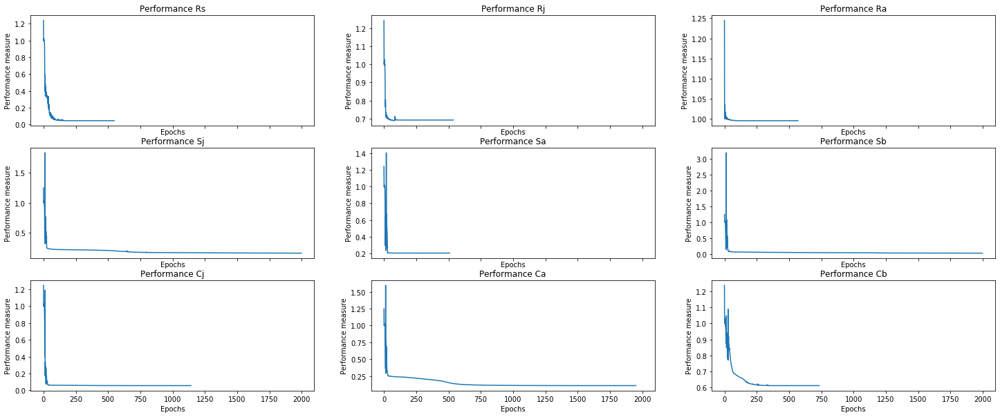

In [163]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

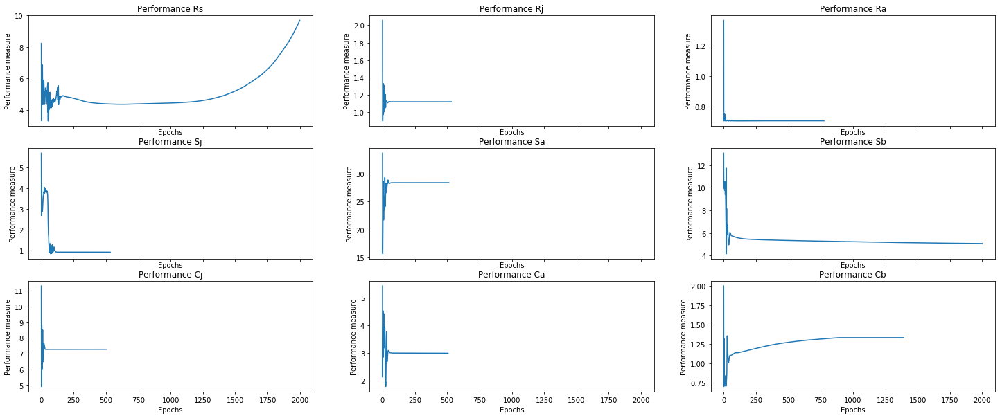

In [164]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 20-70 years: second run (decreased hidden layers by 1, incremented dilation coefficient and kernel size by 1)

In [165]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 5467


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=5467, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.039621
Epoch   103: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.045919
Epoch: 500 [25%] 	Loss: 0.045059
Epoch: 750 [38%] 	Loss: 0.044044
Epoch: 1000 [50%] 	Loss: 0.043550
Epoch  1042: reducing learning rate of group 0 to 1.0000e-03.
Epoch  1062: reducing learning rate of group 0 to 1.0000e-04.
Epoch  1073: reducing learning rate of group 0 to 1.0000e-05.
Epoch  1084: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 1250 [62%]

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_20_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=5467, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.711897
Epoch   147: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.008762
Epoch: 500 [25%] 	Loss: 0.008169
Epoch: 750 [38%] 	Loss: 0.007627
Epoch   892: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 1000 [50%] 	Loss: 0.007383
Epoch: 1250 [62%] 	Loss: 0.007350
Epoch: 1500 [75%] 	Loss: 0.007312
Epoch: 1750 [88%] 	Loss: 0.007274
Epoch: 2000 [100%] 	Loss: 0.007236

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.044561
Epoch   185: reducing le

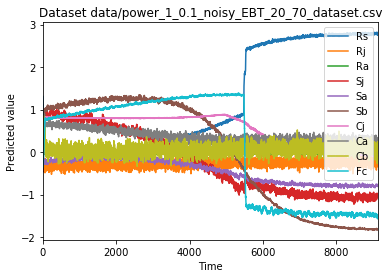

In [166]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 5467 --plot --train_test_split 0.5

In [167]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 9238


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=9238, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.022590
Epoch   105: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.045328
Epoch: 500 [25%] 	Loss: 0.042504
Epoch   655: reducing learning rate of group 0 to 1.0000e-03.
Epoch   675: reducing learning rate of group 0 to 1.0000e-04.
Epoch   686: reducing learning rate of group 0 to 1.0000e-05.
Epoch   697: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 750 [38%] 	Loss: 0.042267
Epoch: 1000 [50%] 	Loss: 0.042267
INFO: Early stopp

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_20_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=9238, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.779999
Epoch   242: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.007236
Epoch   253: reducing learning rate of group 0 to 1.0000e-03.
Epoch   264: reducing learning rate of group 0 to 1.0000e-04.
Epoch   275: reducing learning rate of group 0 to 1.0000e-05.
Epoch   286: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.007029
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.991224
Epoch    97: reducing

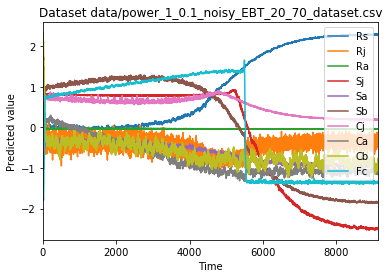

In [168]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 9238 --plot --train_test_split 0.5

In [169]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 157


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=157, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.078920
Epoch: 250 [12%] 	Loss: 0.044652
Epoch   317: reducing learning rate of group 0 to 1.0000e-02.
Epoch   328: reducing learning rate of group 0 to 1.0000e-03.
Epoch   339: reducing learning rate of group 0 to 1.0000e-04.
Epoch   350: reducing learning rate of group 0 to 1.0000e-05.
Epoch   361: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.045906
INFO: Early stopping
Potential causes:  [8, 0, 7]
Validated causes:  [0]

 Analysis s

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_20_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=157, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.580691
Epoch    21: reducing learning rate of group 0 to 1.0000e-02.
Epoch    32: reducing learning rate of group 0 to 1.0000e-03.
Epoch    43: reducing learning rate of group 0 to 1.0000e-04.
Epoch    54: reducing learning rate of group 0 to 1.0000e-05.
Epoch    65: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.248131
Epoch: 500 [25%] 	Loss: 0.248058
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.734544
Epoch    16: reducing 

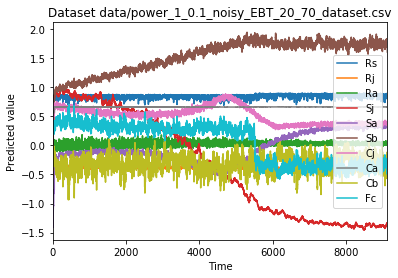

In [170]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 157 --plot --train_test_split 0.5

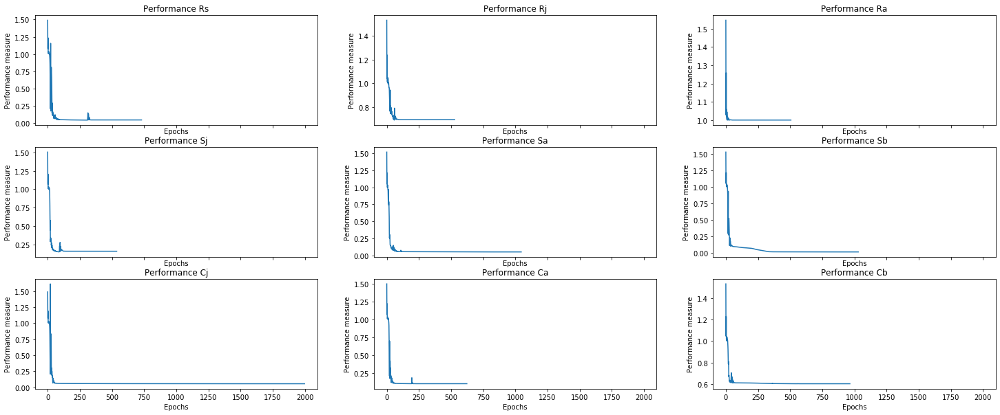

In [171]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

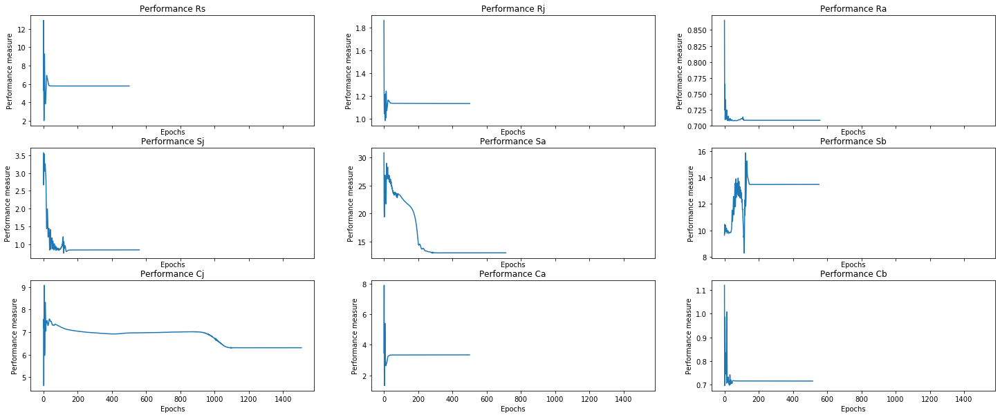

In [172]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 0 - 100 years

,Rs,Rj,Ra,Sj,Sa,Sb,Cj,Ca,Cb,Fc
0,1.362956,0.244246,-2.383722,0.038259,-0.952598,0.157574,0.565253,-0.078632,1.334769,-0.543177
1,1.306197,-1.494814,-2.716558,0.027710,-1.143237,0.199476,0.711184,0.390475,1.703183,-0.782429
2,1.300431,-0.986402,1.916785,-0.059629,-1.321097,0.314990,0.905003,0.456593,1.658282,-0.709232
3,1.290706,0.361318,-0.849699,0.780368,-0.988542,0.280417,0.598313,0.286376,1.391204,-0.146104
4,1.339887,0.058228,-0.797459,0.250091,-1.095484,0.368322,1.164362,0.480401,1.448264,-0.758395
...,...,...,...,...,...,...,...,...,...,...
36486,-0.657225,0.173316,0.026790,-0.292177,1.113560,-1.069435,-1.055194,-1.205811,-0.450691,-0.239640
36487,-1.187539,0.826386,-1.450640,-1.205091,1.134094,-1.273127,-1.317667,-0.783081,-0.059513,-0.469447
36488,-0.487974,1.197350,-1.825222,-0.808458,1.140915,-1.292888,-0.813779,-0.782215,-0.131910,-0.566673
36489,-0.648486,1.616571,0.088954,-1.069290,1.150413,-1.296287,-1.357860,-0.165612,-0.396587,-1.455217


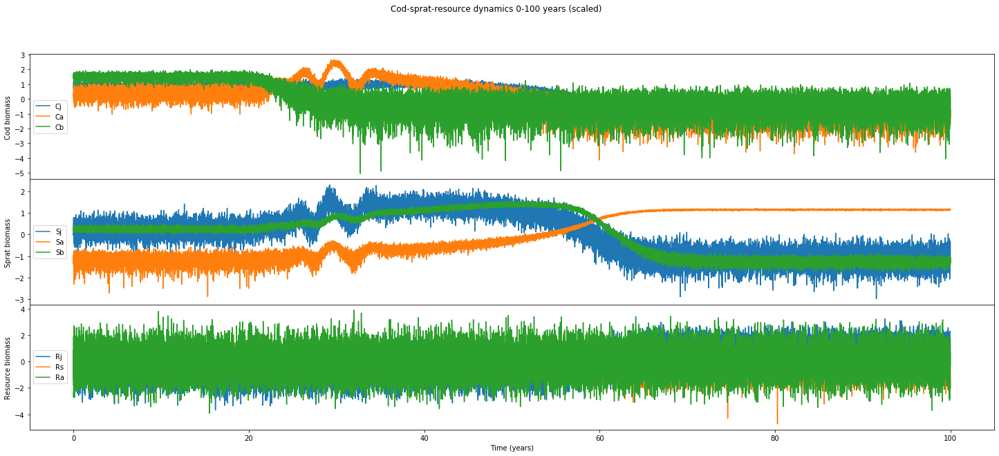

In [173]:
# Select data between 0 and 100 years
noisy_ebt_0_100 = select_data(noisy_ebt, 0, 100, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_0.1_noisy_EBT_0_100_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_0_100.to_csv(EBTScaled_path, index = False)

#### TCDF 0-100 years: first run (in triplicate)

In [174]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 37519

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=37519, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.047415
Epoch    22: reducing learning rate of group 0 to 1.0000e-02.
Epoch    33: reducing learning rate of group 0 to 1.0000e-03.
Epoch    44: reducing learning rate of group 0 to 1.0000e-04.
Epoch    55: reducing learning rate of group 0 to 1.0000e-05.
Epoch    66: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.884924
Epoch: 500 [25%] 	Loss: 0.884443
INFO: Early stopping
Potential causes:  [6, 9, 2, 3, 7]
Validated causes:  [6, 3]



Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_0_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=37519, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.846022
Epoch    60: reducing learning rate of group 0 to 1.0000e-02.
Epoch    71: reducing learning rate of group 0 to 1.0000e-03.
Epoch    82: reducing learning rate of group 0 to 1.0000e-04.
Epoch    93: reducing learning rate of group 0 to 1.0000e-05.
Epoch   104: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.007489
Epoch: 500 [25%] 	Loss: 0.007478
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.718971
Epoch    21: reducin

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


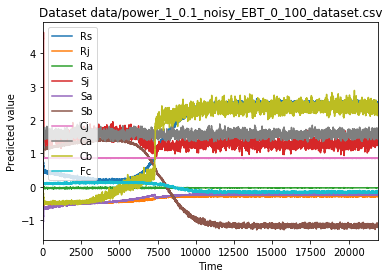

In [175]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 37519 --plot --train_test_split 0.4

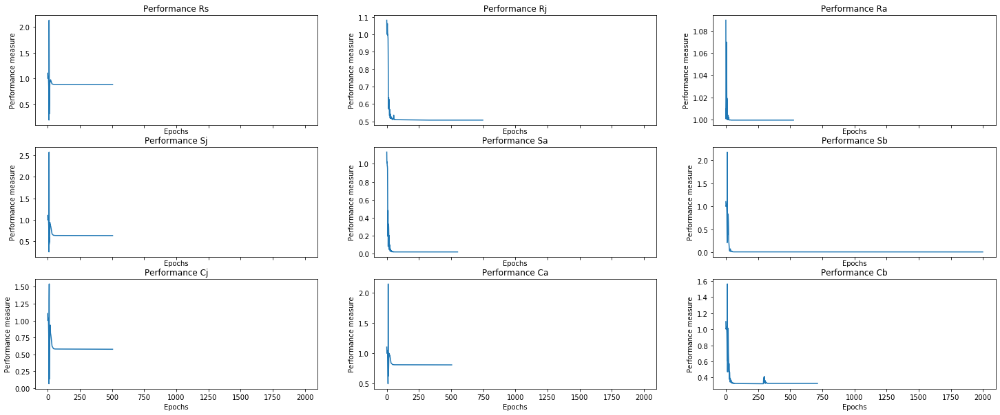

In [176]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

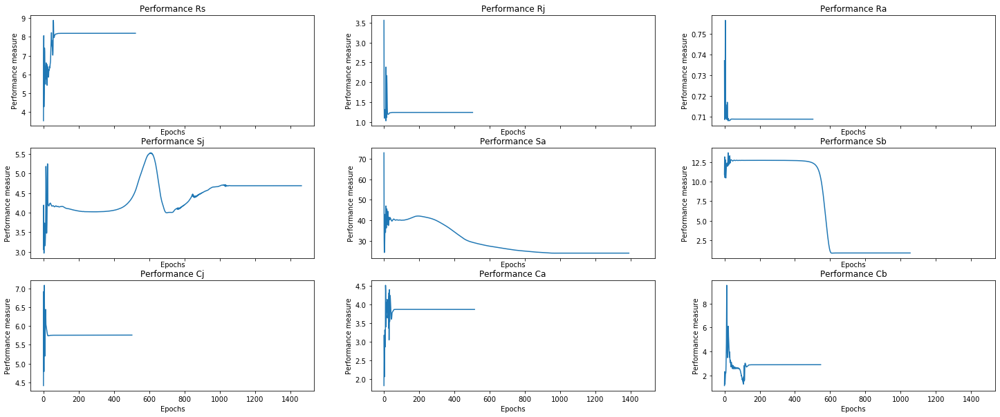

In [177]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

In [178]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 15787

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=15787, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.030812
Epoch    34: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.051562
Epoch: 500 [25%] 	Loss: 0.050005
Epoch: 750 [38%] 	Loss: 0.049436
Epoch: 1000 [50%] 	Loss: 0.049122
Epoch: 1250 [62%] 	Loss: 0.048913
Epoch  1291: reducing learning rate of group 0 to 1.0000e-03.
Epoch  1306: reducing learning rate of group 0 to 1.0000e-04.
Epoch  1317: reducing learning rate of group 0 to 1.0000e-05.
Epoch  1328: reducing learning rate of group

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_0_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=15787, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.736968
Epoch    40: reducing learning rate of group 0 to 1.0000e-02.
Epoch    62: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [12%] 	Loss: 0.010189
Epoch: 500 [25%] 	Loss: 0.008830
Epoch: 750 [38%] 	Loss: 0.007732
Epoch: 1000 [50%] 	Loss: 0.006552
Epoch: 1250 [62%] 	Loss: 0.005490
Epoch: 1500 [75%] 	Loss: 0.004324
Epoch: 1750 [88%] 	Loss: 0.003443
Epoch: 2000 [100%] 	Loss: 0.002996

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.755066
Epoch    23: reducing l

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


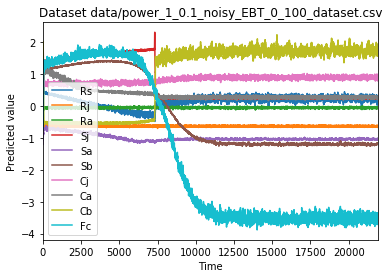

In [179]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 15787 --plot --train_test_split 0.4

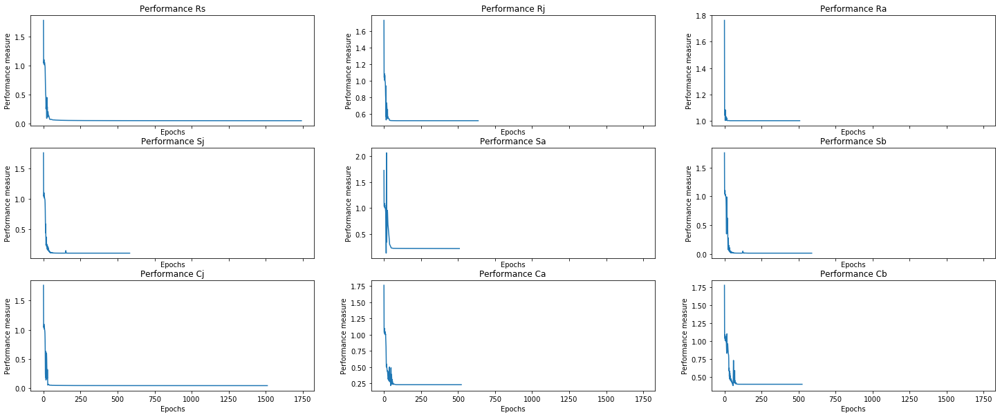

In [180]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

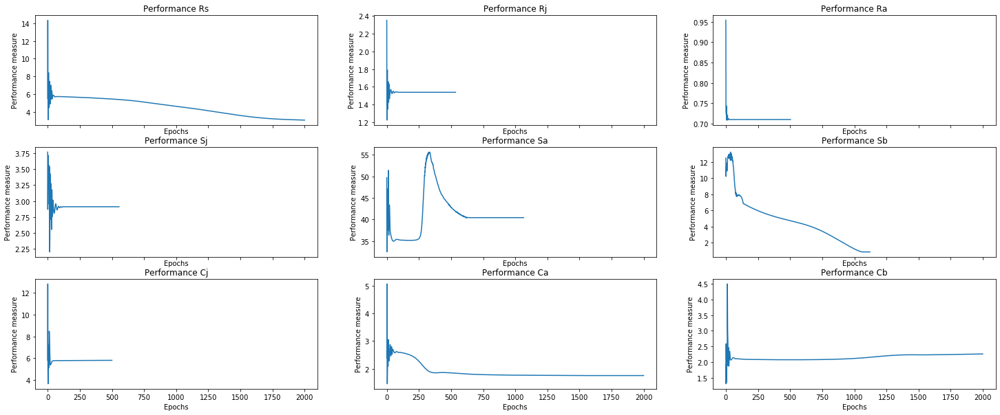

In [181]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

In [182]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 74326

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=74326, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.030482
Epoch    93: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.057232
Epoch: 500 [25%] 	Loss: 0.052254
Epoch   507: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 750 [38%] 	Loss: 0.051923
Epoch: 1000 [50%] 	Loss: 0.051709
Epoch: 1250 [62%] 	Loss: 0.051492
Epoch: 1500 [75%] 	Loss: 0.051275
Epoch: 1750 [88%] 	Loss: 0.051068
Epoch: 2000 [100%] 	Loss: 0.050873
Potential causes:  [6, 5]
Validated causes:  []

 Analysis starte

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_0_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=74326, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.961787
Epoch    97: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.002681
Epoch: 500 [25%] 	Loss: 0.002210
Epoch: 750 [38%] 	Loss: 0.002113
Epoch   792: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 1000 [50%] 	Loss: 0.002073
Epoch: 1250 [62%] 	Loss: 0.001992
Epoch: 1500 [75%] 	Loss: 0.001849
Epoch: 1750 [88%] 	Loss: 0.001760
Epoch: 2000 [100%] 	Loss: 0.001731

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.194408
Epoch    13: reducing l

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


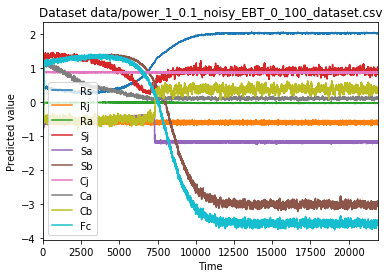

In [183]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 74326 --plot --train_test_split 0.4

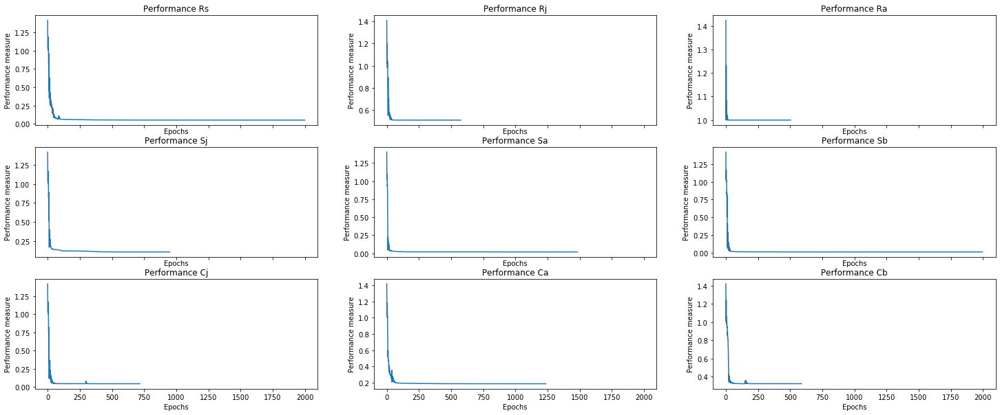

In [184]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

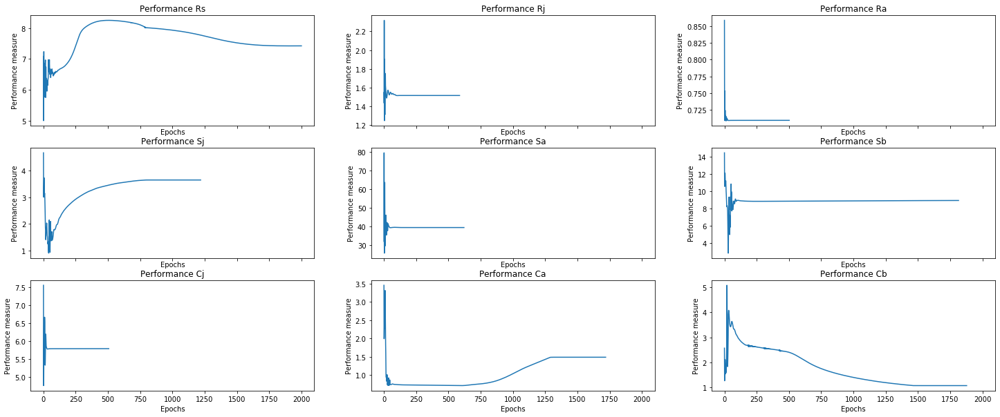

In [185]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

#### TCDF 0-100 years: second run (increased hidden layers by 1, decreased dilation coefficient and kernel size by 1)

In [186]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 1111

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=1111, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.021795
Epoch   126: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.053270
Epoch: 500 [25%] 	Loss: 0.051204
Epoch: 750 [38%] 	Loss: 0.050879
Epoch: 1000 [50%] 	Loss: 0.050368
Epoch: 1250 [62%] 	Loss: 0.049637
Epoch: 1500 [75%] 	Loss: 0.049070
Epoch: 1750 [88%] 	Loss: 0.048910
Epoch  1760: reducing learning rate of group 0 to 1.0000e-03.
Epoch  1772: reducing learning rate of group 0 to 1.0000e-04.
Epoch  1783: reducing learning rate of 

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_0_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=1111, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.666998
Epoch   145: reducing learning rate of group 0 to 1.0000e-02.
Epoch   156: reducing learning rate of group 0 to 1.0000e-03.
Epoch   167: reducing learning rate of group 0 to 1.0000e-04.
Epoch   178: reducing learning rate of group 0 to 1.0000e-05.
Epoch   189: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.012774
Epoch: 500 [25%] 	Loss: 0.012684
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.780791
Epoch    27: reducing

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


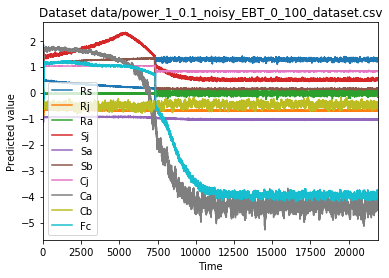

In [187]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 1111 --plot --train_test_split 0.4

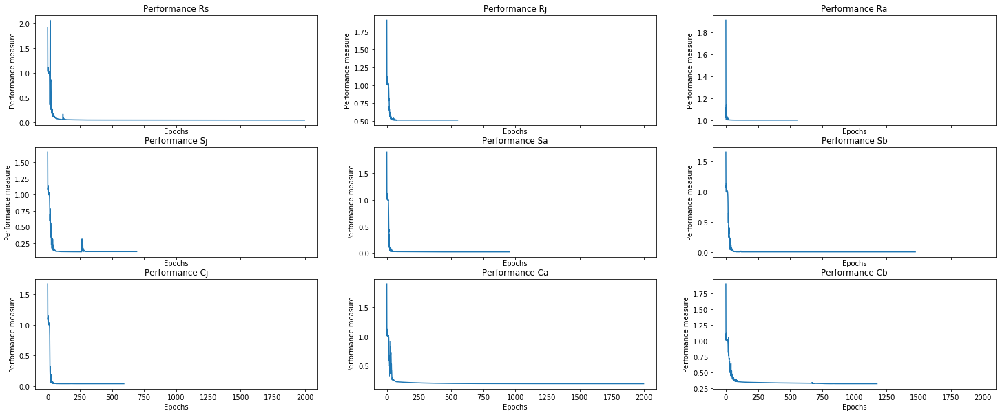

In [188]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

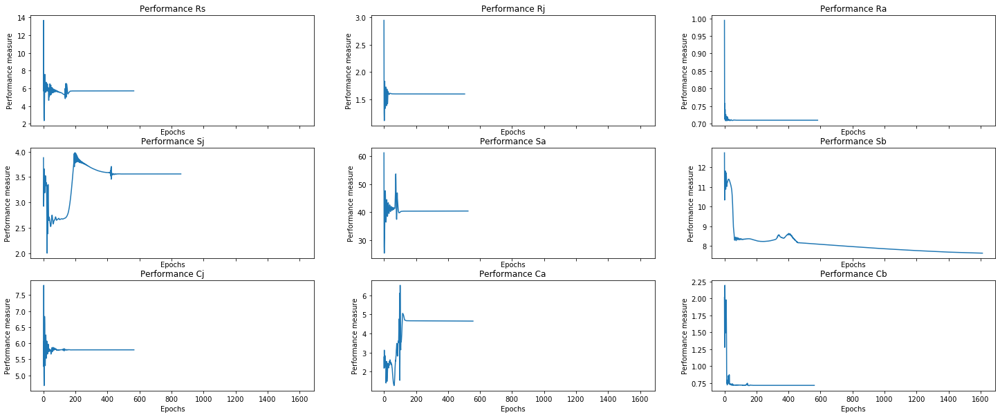

In [189]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

In [190]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 18040

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=18040, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.048004
Epoch    37: reducing learning rate of group 0 to 1.0000e-02.
Epoch    66: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [12%] 	Loss: 0.240613
Epoch   455: reducing learning rate of group 0 to 1.0000e-04.
Epoch   466: reducing learning rate of group 0 to 1.0000e-05.
Epoch   477: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.053770
Epoch: 750 [38%] 	Loss: 0.053764
INFO: Early stopping
Potential causes:  [6, 4]
Val

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_0_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=18040, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.881425
Epoch    36: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.008733
Epoch: 500 [25%] 	Loss: 0.008023
Epoch: 750 [38%] 	Loss: 0.007644
Epoch: 1000 [50%] 	Loss: 0.006986
Epoch: 1250 [62%] 	Loss: 0.004354
Epoch  1328: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 1500 [75%] 	Loss: 0.002202
Epoch: 1750 [88%] 	Loss: 0.002129
Epoch: 2000 [100%] 	Loss: 0.002067

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.267261
Epoch    20: reducing l

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


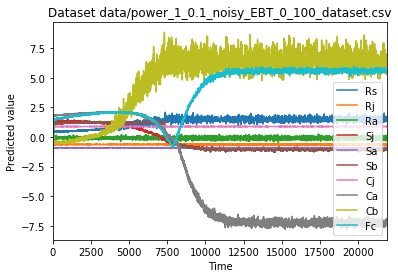

In [191]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 18040 --plot --train_test_split 0.4

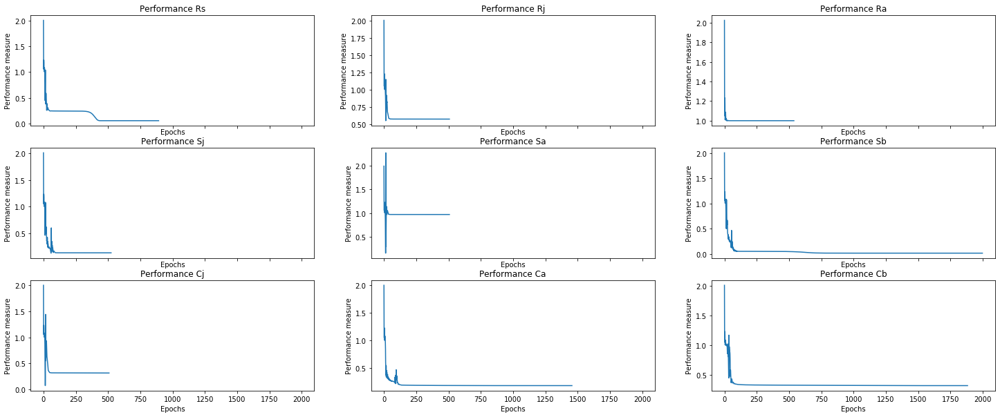

In [192]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

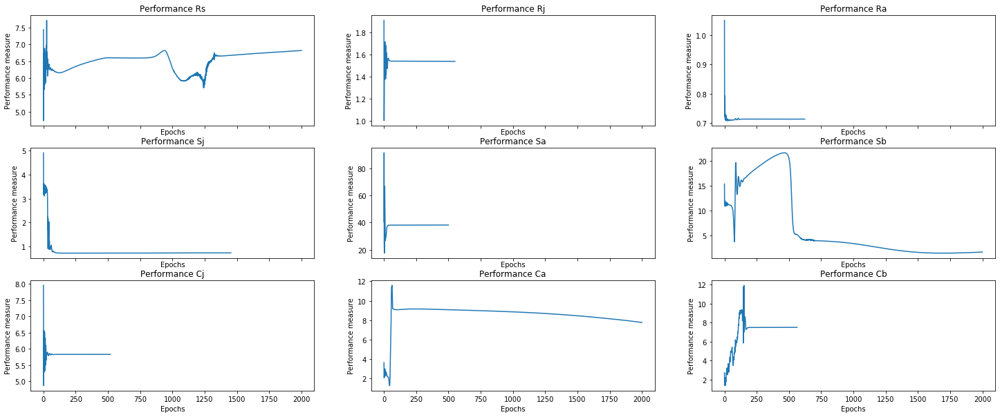

In [193]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

In [194]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 86547

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=86547, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.044824
Epoch    36: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.073115
Epoch: 500 [25%] 	Loss: 0.068978
Epoch: 750 [38%] 	Loss: 0.058609
Epoch: 1000 [50%] 	Loss: 0.051540
Epoch  1101: reducing learning rate of group 0 to 1.0000e-03.
Epoch  1121: reducing learning rate of group 0 to 1.0000e-04.
Epoch  1144: reducing learning rate of group 0 to 1.0000e-05.
Epoch  1155: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 1250 [62%

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_0_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=86547, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.833742
Epoch    71: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.007770
Epoch: 500 [25%] 	Loss: 0.004574
Epoch: 750 [38%] 	Loss: 0.003901
Epoch: 1000 [50%] 	Loss: 0.003404
Epoch: 1250 [62%] 	Loss: 0.002395
Epoch  1420: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 1500 [75%] 	Loss: 0.002324
Epoch: 1750 [88%] 	Loss: 0.002316
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.722806
Epoch    20: reducing learning rate o

/Users/markrademaker/opt/anaconda3/envs/my_env/lib/python3.7/site-packages/IPython/core/pylabtools.py:134: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


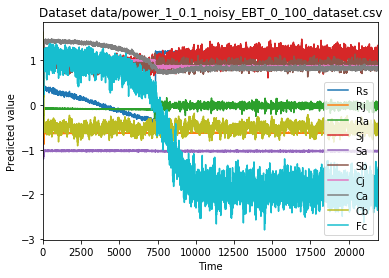

In [195]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 86547 --plot --train_test_split 0.4

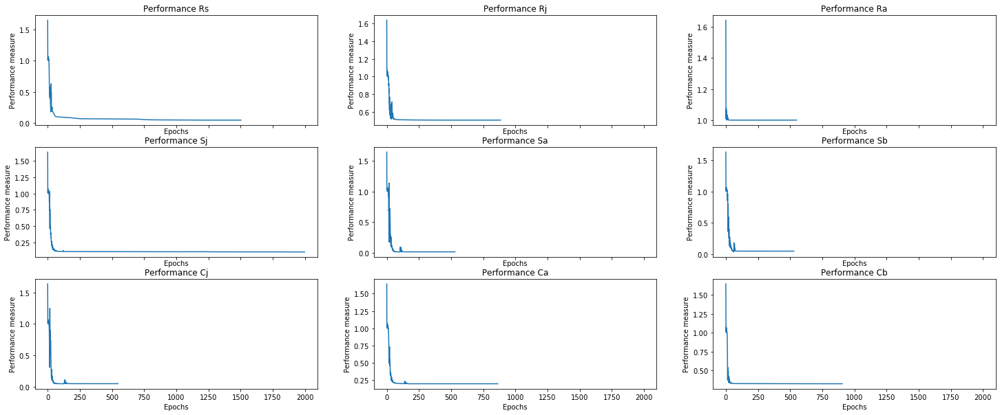

In [196]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

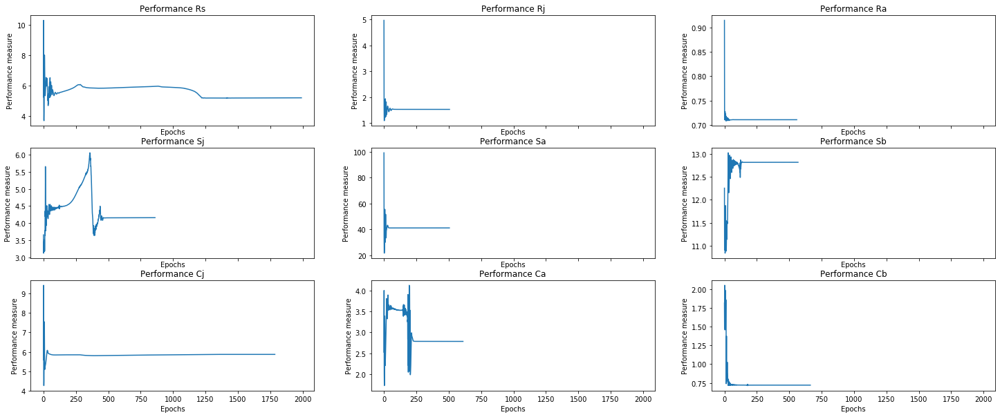

In [197]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

#### 0 - 20 years

,Rs,Rj,Ra,Sj,Sa,Sb,Cj,Ca,Cb,Fc
0,2.022311,1.217961,-2.349081,-0.690224,1.089763,-1.218047,-1.918842,-1.461917,-0.922177,0.038080
1,-0.456446,-1.153750,-2.672688,-0.724507,0.089282,-0.660205,-0.844904,-0.044008,1.251978,-0.411991
2,-0.698082,-0.487547,1.957056,-1.005798,-0.684363,0.917923,0.616411,0.179919,0.947474,-0.285458
3,-1.101535,1.386670,-0.836626,1.887206,0.885967,0.439390,-1.677579,-0.383848,-0.631578,1.145076
4,0.992437,0.952136,-0.784590,0.012140,0.321958,1.666532,2.631262,0.262135,-0.323887,-0.371326
...,...,...,...,...,...,...,...,...,...,...
7286,-0.494409,-1.394846,-1.914382,-0.998685,0.783991,-0.088707,-0.430981,-2.154929,1.057393,0.506479
7287,-0.116816,-1.441738,-0.680505,0.818725,-1.350933,1.138173,0.376838,0.282385,0.593748,1.201607
7288,0.457779,-1.038821,-0.228787,-0.437554,1.189808,-0.857255,-1.258674,1.050063,0.204264,0.323237
7289,-0.931639,-0.976075,2.211030,0.938470,-3.410396,1.867746,0.385383,0.805919,0.476433,-1.090396


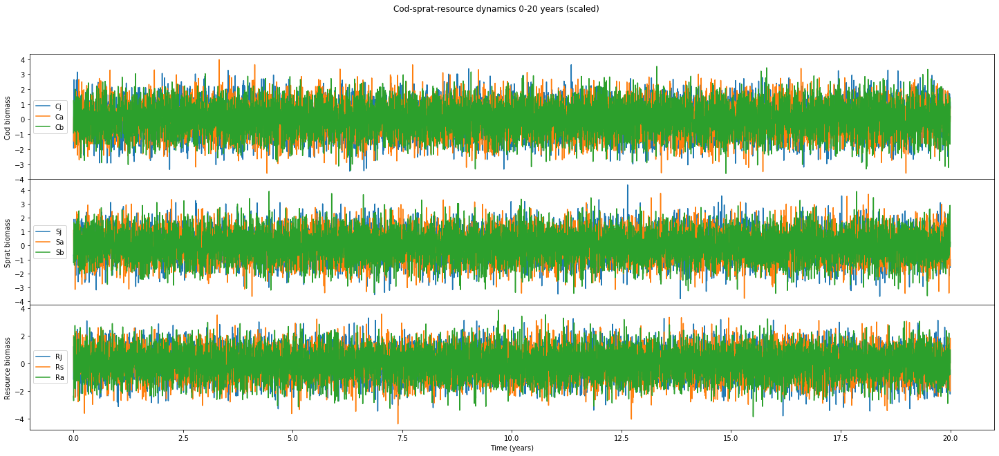

In [198]:
# Select data between 0 and 20 years
noisy_ebt_0_20 = select_data(noisy_ebt, 0, 20, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_0.1_noisy_EBT_0_20_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_0_20.to_csv(EBTScaled_path, index = False)

#### TCDF 0 - 20 years: first run (in triplicate)

In [199]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 37519

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_0_20_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=37519, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_0_20_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.047252
Epoch    24: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.981963
Epoch   498: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 500 [25%] 	Loss: 0.970436
Epoch   510: reducing learning rate of group 0 to 1.0000e-04.
Epoch   521: reducing learning rate of group 0 to 1.0000e-05.
Epoch   532: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 750 [38%] 	Loss: 0.970385
INFO: Early stopping
Potential causes:  [3, 9, 1, 4]

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_0_20_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=37519, train_test_split=0.8)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.042506
Epoch   151: reducing learning rate of group 0 to 1.0000e-02.
Epoch   236: reducing learning rate of group 0 to 1.0000e-03.
Epoch   248: reducing learning rate of group 0 to 1.0000e-04.
Epoch: 250 [12%] 	Loss: 0.956607
Epoch   259: reducing learning rate of group 0 to 1.0000e-05.
Epoch   270: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.956606
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.044642
Epoch   171: reducing

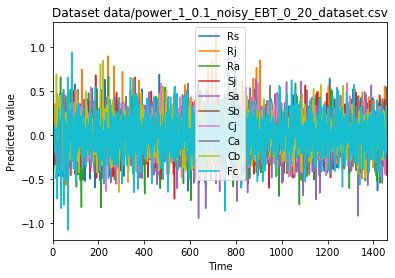

In [200]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 37519 --plot --train_test_split 0.8

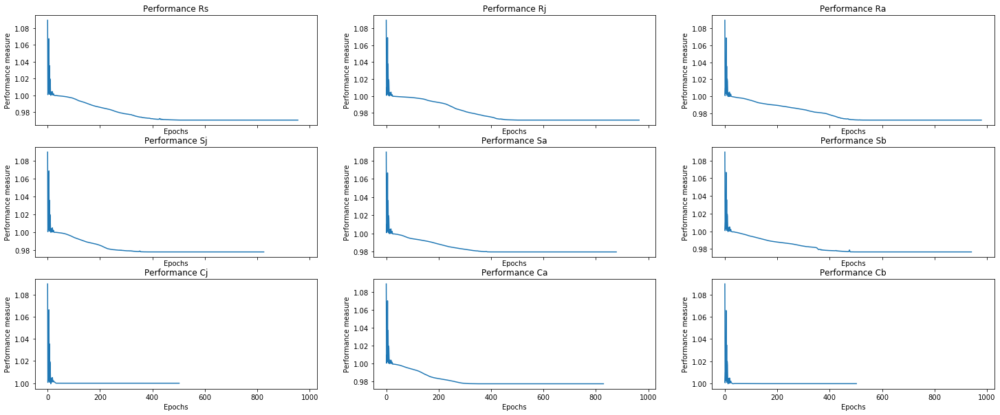

In [201]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

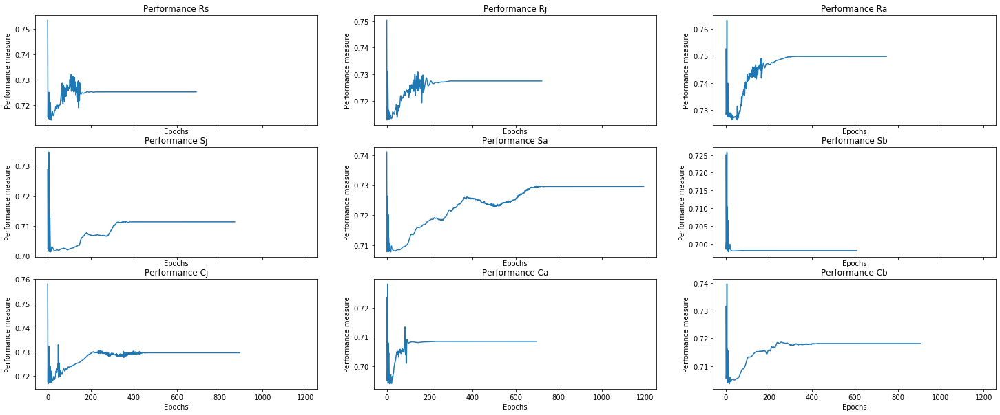

In [202]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [203]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 49741

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_0_20_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=49741, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_0_20_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.028067
Epoch   138: reducing learning rate of group 0 to 1.0000e-02.
Epoch   182: reducing learning rate of group 0 to 1.0000e-03.
Epoch   194: reducing learning rate of group 0 to 1.0000e-04.
Epoch   205: reducing learning rate of group 0 to 1.0000e-05.
Epoch   216: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.982793
Epoch: 500 [25%] 	Loss: 0.982792
INFO: Early stopping
Potential causes:  [2, 6]
Validated causes:  [2, 6]

 Analysis s

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_0_20_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=49741, train_test_split=0.8)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.022675
Epoch    17: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.976904
Epoch: 500 [25%] 	Loss: 0.962533
Epoch   646: reducing learning rate of group 0 to 1.0000e-03.
Epoch   658: reducing learning rate of group 0 to 1.0000e-04.
Epoch   673: reducing learning rate of group 0 to 1.0000e-05.
Epoch   684: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 750 [38%] 	Loss: 0.957212
Epoch: 1000 [50%] 	Loss: 0.957211
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing 

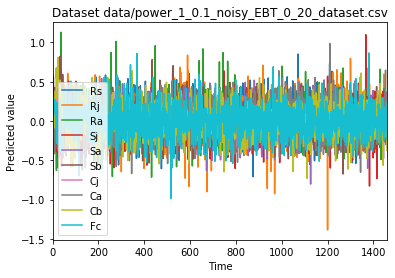

In [204]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 49741 --plot --train_test_split 0.8

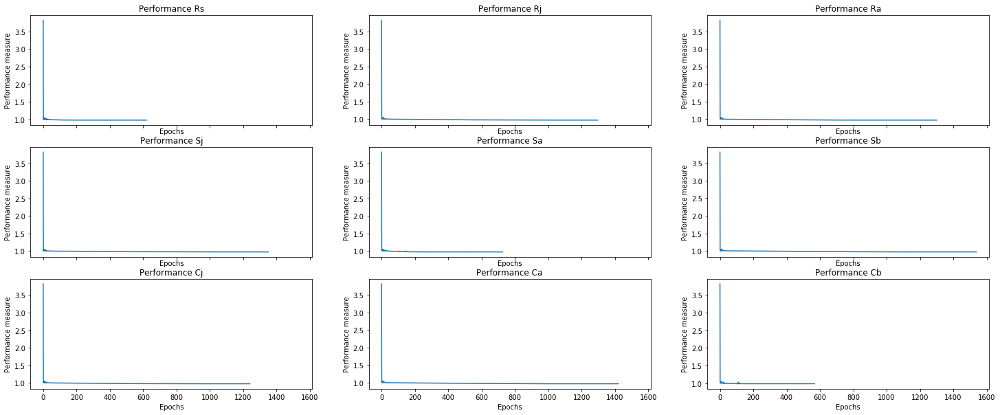

In [205]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

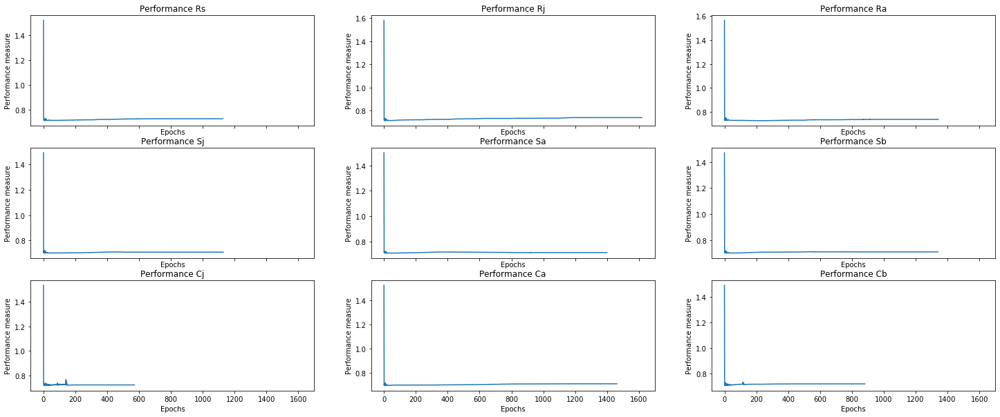

In [206]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [207]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 37786

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_0_20_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=37786, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_0_20_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.015183
Epoch    16: reducing learning rate of group 0 to 1.0000e-02.
Epoch    35: reducing learning rate of group 0 to 1.0000e-03.
Epoch    48: reducing learning rate of group 0 to 1.0000e-04.
Epoch    59: reducing learning rate of group 0 to 1.0000e-05.
Epoch    70: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.999636
Epoch: 500 [25%] 	Loss: 0.999635
INFO: Early stopping
Potential causes:  [4, 0, 8, 7]
Validated causes:  []

 Analysis

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_0_20_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=37786, train_test_split=0.8)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.006037
Epoch    17: reducing learning rate of group 0 to 1.0000e-02.
Epoch    36: reducing learning rate of group 0 to 1.0000e-03.
Epoch    57: reducing learning rate of group 0 to 1.0000e-04.
Epoch    68: reducing learning rate of group 0 to 1.0000e-05.
Epoch    79: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.991284
Epoch: 500 [25%] 	Loss: 0.991278
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.004957
Epoch    15: reducing

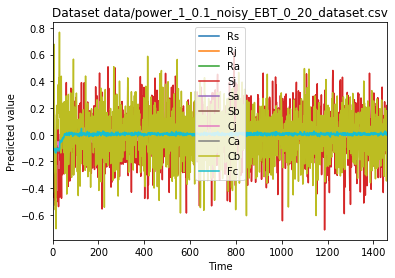

In [208]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 37786 --plot --train_test_split 0.8

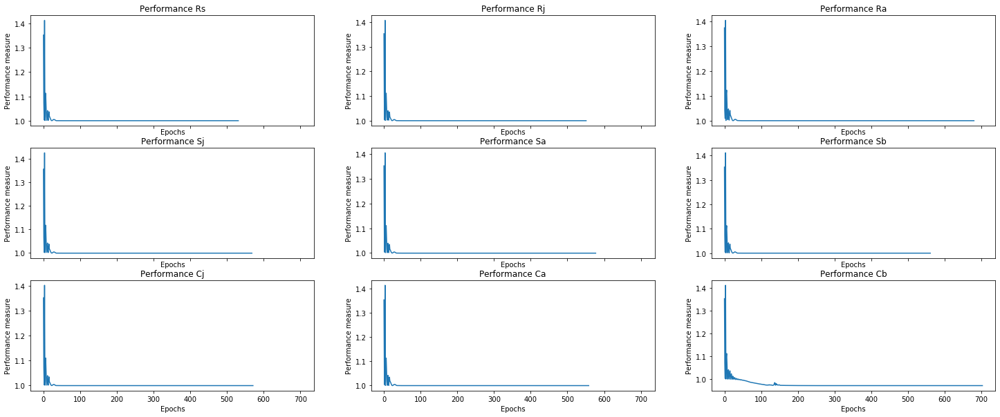

In [209]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

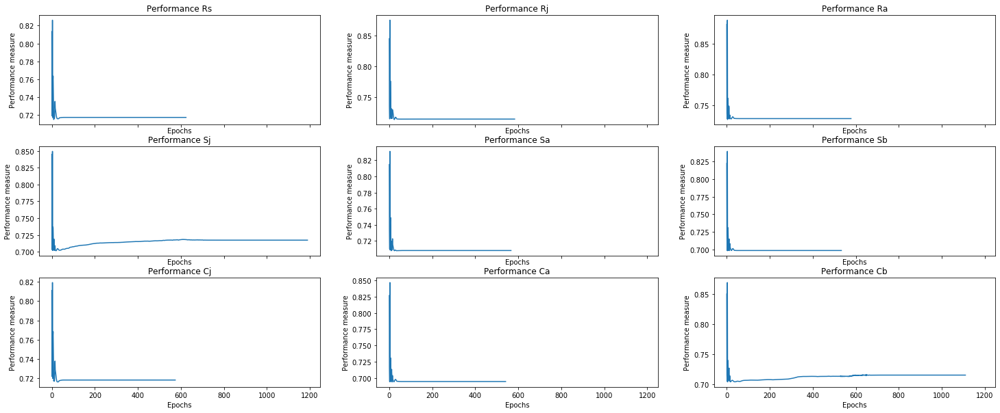

In [210]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 0-20 years: second run (increased hidden layers by 1, decreased dilation coefficient and kernel size by 1)

In [211]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 94139


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_0_20_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=94139, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_0_20_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.129129
Epoch    72: reducing learning rate of group 0 to 1.0000e-02.
Epoch    83: reducing learning rate of group 0 to 1.0000e-03.
Epoch    94: reducing learning rate of group 0 to 1.0000e-04.
Epoch   105: reducing learning rate of group 0 to 1.0000e-05.
Epoch   116: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.995544
Epoch: 500 [25%] 	Loss: 0.995534
INFO: Early stopping
Potential causes:  [4, 1, 2, 8, 7]
Validated causes:  []

 Analy

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_0_20_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=94139, train_test_split=0.8)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.116938
Epoch   100: reducing learning rate of group 0 to 1.0000e-02.
Epoch   111: reducing learning rate of group 0 to 1.0000e-03.
Epoch   122: reducing learning rate of group 0 to 1.0000e-04.
Epoch   133: reducing learning rate of group 0 to 1.0000e-05.
Epoch   144: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.985147
Epoch: 500 [25%] 	Loss: 0.985110
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.113613
Epoch   179: reducing

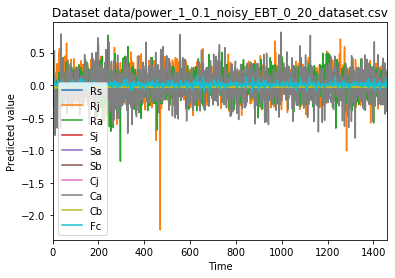

In [212]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 94139 --plot --train_test_split 0.8

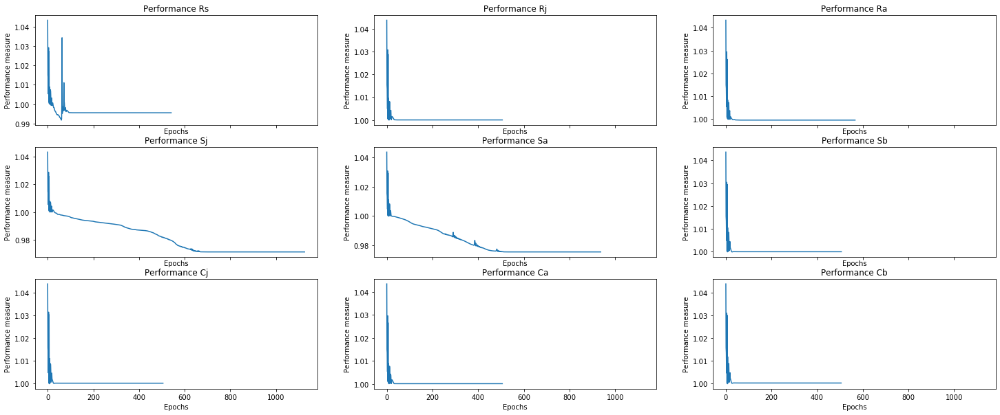

In [213]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

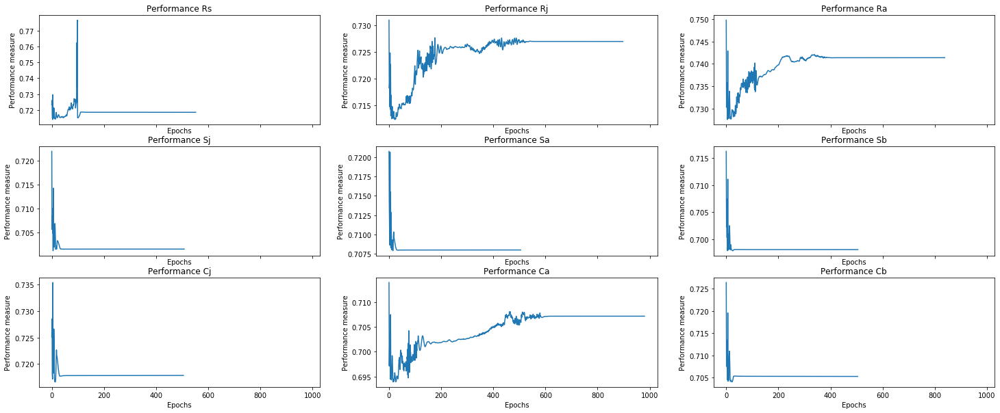

In [214]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [215]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 18147


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_0_20_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=18147, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_0_20_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.016842
Epoch   180: reducing learning rate of group 0 to 1.0000e-02.
Epoch   234: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [12%] 	Loss: 0.966964
Epoch   252: reducing learning rate of group 0 to 1.0000e-04.
Epoch   263: reducing learning rate of group 0 to 1.0000e-05.
Epoch   274: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.966960
INFO: Early stopping
Potential causes:  [1, 6]
Validated causes:  [1, 6]

 Analysis s

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_0_20_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=18147, train_test_split=0.8)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.010966
Epoch    22: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.970209
Epoch: 500 [25%] 	Loss: 0.957413
Epoch   538: reducing learning rate of group 0 to 1.0000e-03.
Epoch   555: reducing learning rate of group 0 to 1.0000e-04.
Epoch   566: reducing learning rate of group 0 to 1.0000e-05.
Epoch   577: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 750 [38%] 	Loss: 0.956582
Epoch: 1000 [50%] 	Loss: 0.956581
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing 

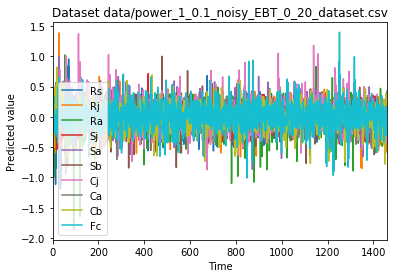

In [216]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 18147 --plot --train_test_split 0.8

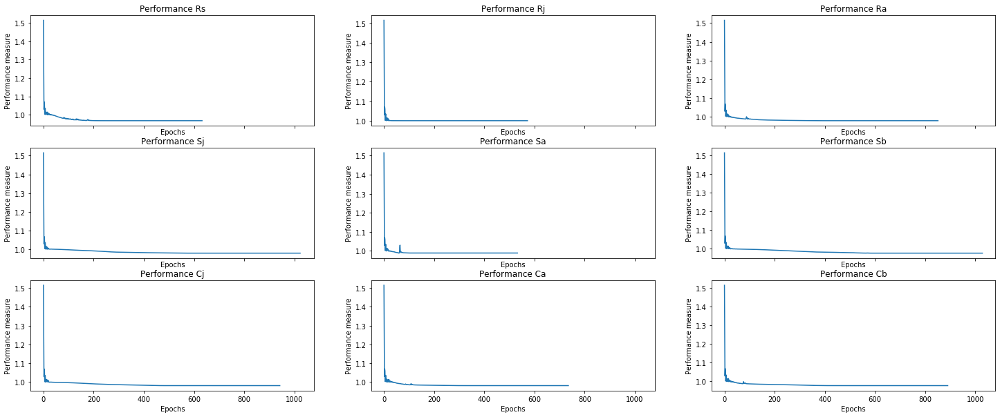

In [217]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

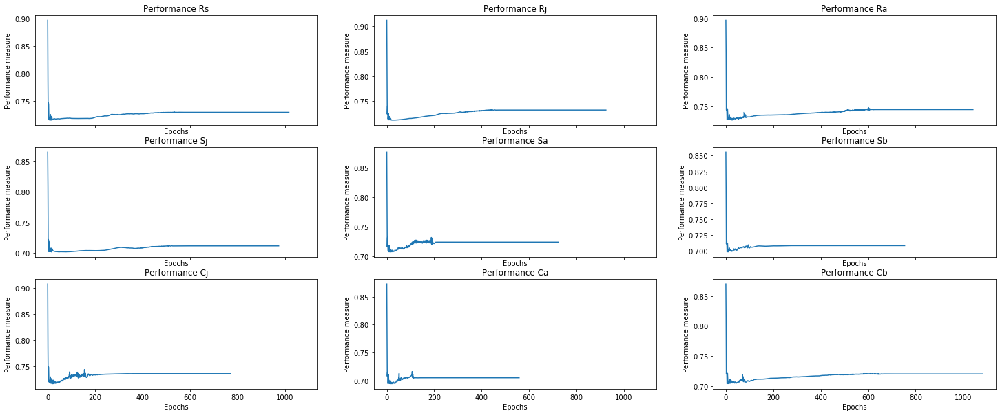

In [218]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [219]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 69089


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_0_20_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=69089, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_0_20_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.001242
Epoch    31: reducing learning rate of group 0 to 1.0000e-02.
Epoch    45: reducing learning rate of group 0 to 1.0000e-03.
Epoch    60: reducing learning rate of group 0 to 1.0000e-04.
Epoch    71: reducing learning rate of group 0 to 1.0000e-05.
Epoch    82: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.998605
Epoch: 500 [25%] 	Loss: 0.998604
INFO: Early stopping
Potential causes:  [7, 6, 4, 3]
Validated causes:  [7]

 Analysi

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_0_20_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=69089, train_test_split=0.8)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.994149
Epoch    97: reducing learning rate of group 0 to 1.0000e-02.
Epoch   108: reducing learning rate of group 0 to 1.0000e-03.
Epoch   247: reducing learning rate of group 0 to 1.0000e-04.
Epoch: 250 [12%] 	Loss: 0.977147
Epoch   261: reducing learning rate of group 0 to 1.0000e-05.
Epoch   272: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.977134
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.994563
Epoch    12: reducing

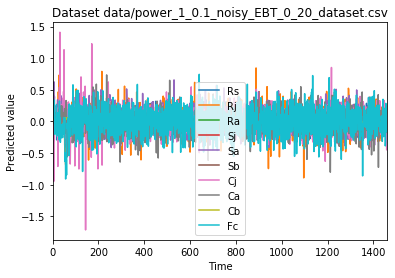

In [220]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 69089 --plot --train_test_split 0.8

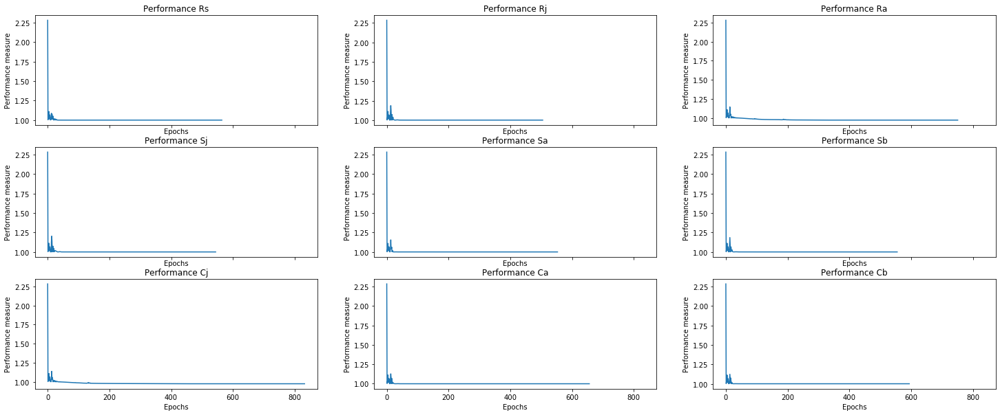

In [221]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

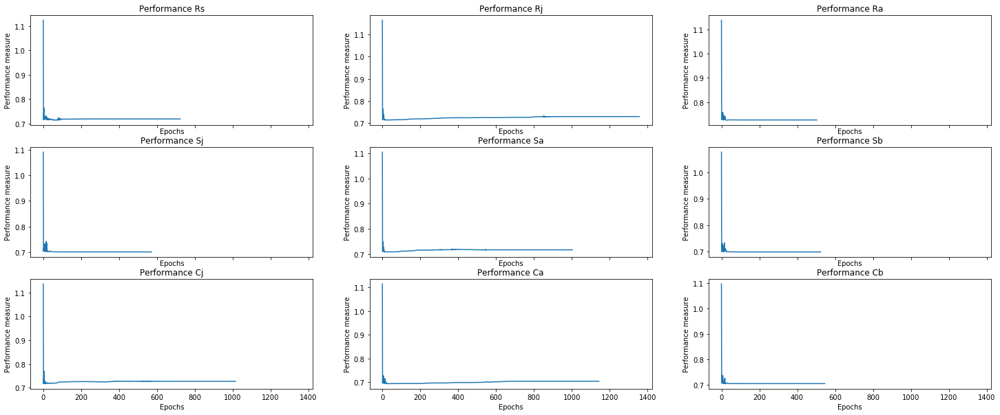

In [222]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 70 - 100 years

,Rs,Rj,Ra,Sj,Sa,Sb,Cj,Ca,Cb,Fc
0,0.553719,0.252797,1.211481,-0.066725,-0.067082,0.239910,-0.431971,-0.589699,0.002518,0.974034
1,-0.342067,1.004259,-0.248593,0.467231,-2.287047,-0.093097,-1.811860,-0.098752,-0.367070,-1.917159
2,-0.529590,0.380028,0.721948,-0.471057,-0.334067,-0.006202,-0.790771,-0.395759,1.024213,0.339307
3,-1.628577,0.524255,1.909476,-2.739201,-1.408742,1.876133,0.680284,0.564111,-1.694783,1.021204
4,-0.873248,-0.173343,0.725062,-0.646463,-1.783294,1.482862,1.969687,-1.313248,-1.733090,-0.873708
...,...,...,...,...,...,...,...,...,...,...
10936,1.089039,-1.093423,0.004786,2.365398,-2.064019,1.509263,0.506092,-0.648797,-0.040987,0.835890
10937,-0.772012,-0.135684,-1.478603,-0.270070,-0.820449,-0.091211,-0.460392,0.078169,0.647003,0.221712
10938,1.904524,0.426272,-1.852958,0.819886,-0.403861,-0.238018,1.561342,0.079798,0.509827,0.008850
10939,1.127979,1.076483,0.067414,0.093533,0.179144,-0.263118,-0.593425,1.424213,0.046876,-1.322951


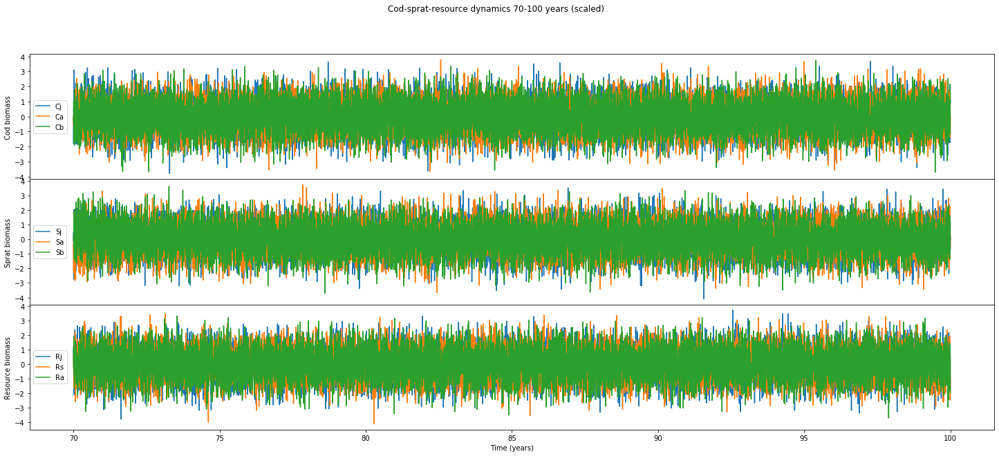

In [223]:
# Select data between 70 and 100 years
noisy_ebt_70_100 = select_data(noisy_ebt, 70, 100, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_0.1_noisy_EBT_70_100_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_70_100.to_csv(EBTScaled_path, index = False)

#### TCDF 70-100: first run (in triplicate)

In [224]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 34321

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_70_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=34321, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_70_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.003534
Epoch: 250 [12%] 	Loss: 0.984173
Epoch   405: reducing learning rate of group 0 to 1.0000e-02.
Epoch   429: reducing learning rate of group 0 to 1.0000e-03.
Epoch   440: reducing learning rate of group 0 to 1.0000e-04.
Epoch   451: reducing learning rate of group 0 to 1.0000e-05.
Epoch   462: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.976972
Epoch: 750 [38%] 	Loss: 0.976972
INFO: Early stopping
Potential causes:  [6, 8, 4

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_70_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=34321, train_test_split=0.8)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.004097
Epoch    12: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.987074
Epoch   442: reducing learning rate of group 0 to 1.0000e-03.
Epoch   454: reducing learning rate of group 0 to 1.0000e-04.
Epoch   465: reducing learning rate of group 0 to 1.0000e-05.
Epoch   476: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.980087
Epoch: 750 [38%] 	Loss: 0.980086
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	L

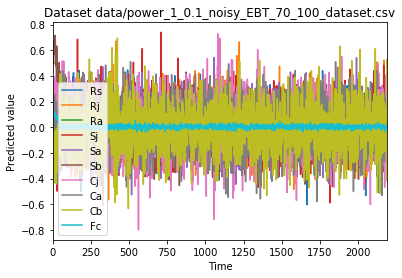

In [225]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 34321 --plot --train_test_split 0.8

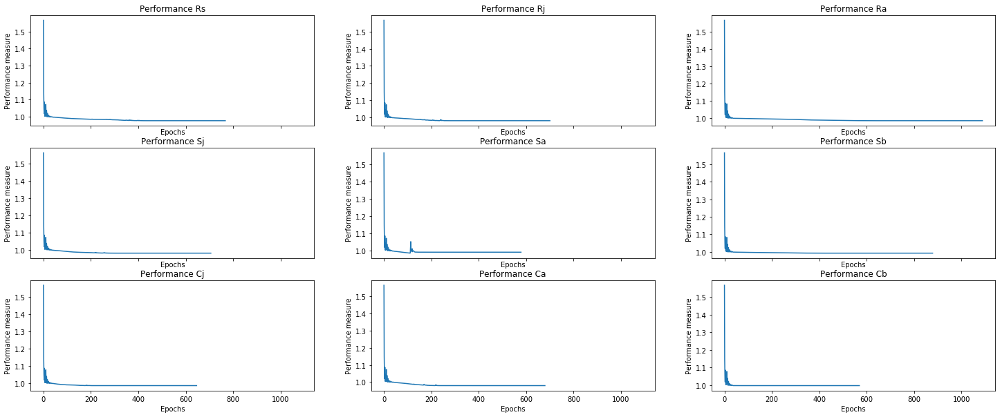

In [226]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

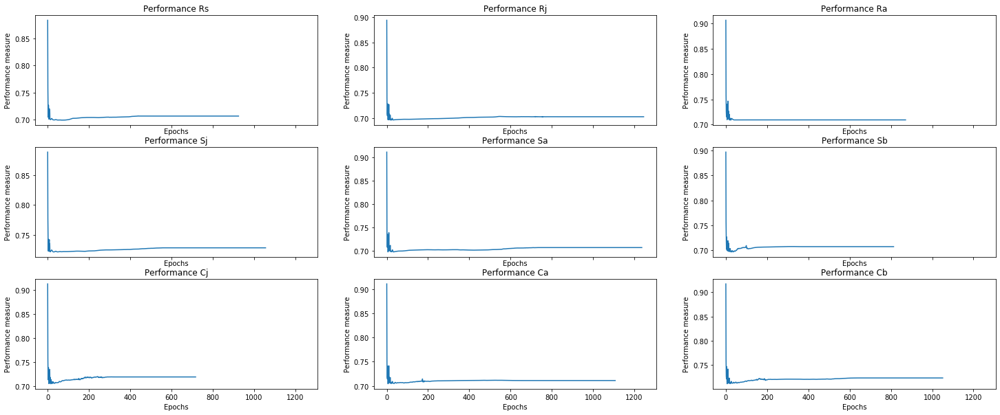

In [227]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [228]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 85672

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_70_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=85672, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_70_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.188076
Epoch    12: reducing learning rate of group 0 to 1.0000e-02.
Epoch    33: reducing learning rate of group 0 to 1.0000e-03.
Epoch    45: reducing learning rate of group 0 to 1.0000e-04.
Epoch    56: reducing learning rate of group 0 to 1.0000e-05.
Epoch    67: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.999819
Epoch: 500 [25%] 	Loss: 0.999818
INFO: Early stopping
Potential causes:  [5, 4]
Validated causes:  []

 Analysis s

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_70_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=85672, train_test_split=0.8)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.184003
Epoch    22: reducing learning rate of group 0 to 1.0000e-02.
Epoch    59: reducing learning rate of group 0 to 1.0000e-03.
Epoch    71: reducing learning rate of group 0 to 1.0000e-04.
Epoch    82: reducing learning rate of group 0 to 1.0000e-05.
Epoch    93: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 1.000454
Epoch: 500 [25%] 	Loss: 1.000453
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.191722
Epoch    34: reduci

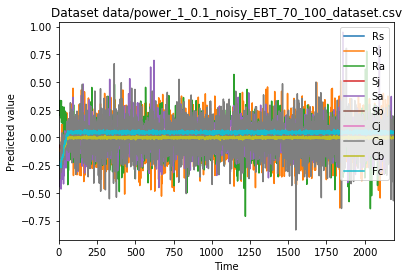

In [229]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 85672 --plot --train_test_split 0.8

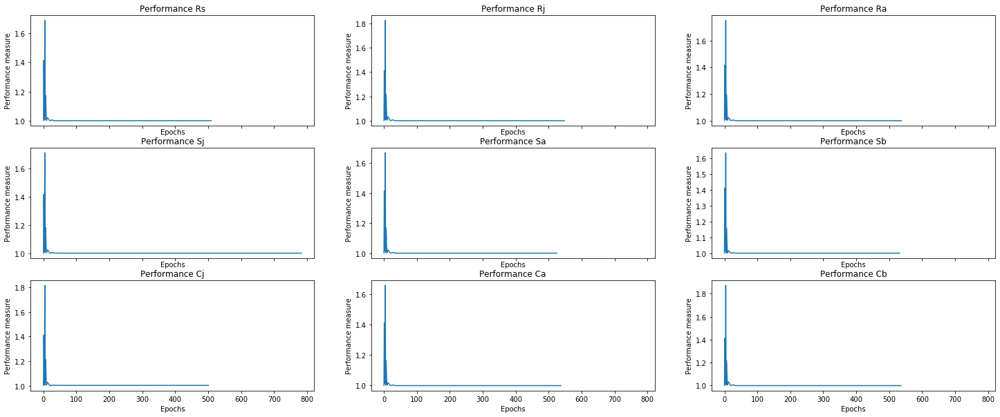

In [230]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

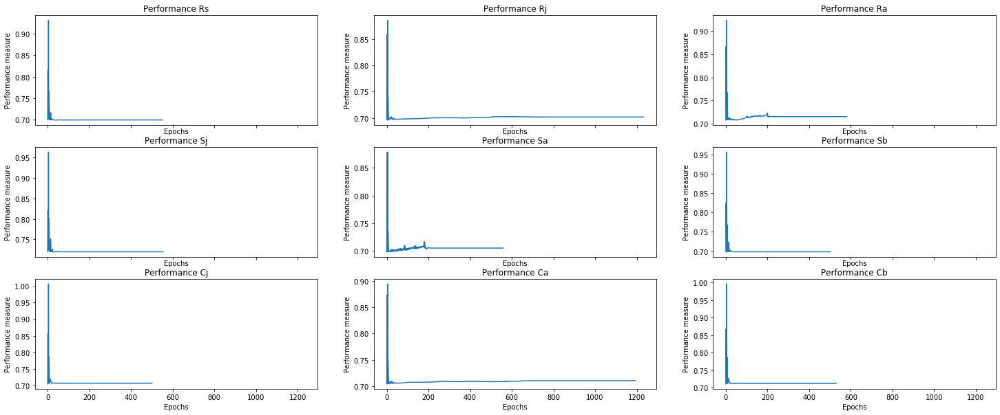

In [231]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [232]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 63109

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_70_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=63109, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_70_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.051384
Epoch    37: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.990846
Epoch: 500 [25%] 	Loss: 0.983357
Epoch   689: reducing learning rate of group 0 to 1.0000e-03.
Epoch   704: reducing learning rate of group 0 to 1.0000e-04.
Epoch   715: reducing learning rate of group 0 to 1.0000e-05.
Epoch   726: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 750 [38%] 	Loss: 0.980595
Epoch: 1000 [50%] 	Loss: 0.980594
INFO: Early st

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_70_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=63109, train_test_split=0.8)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.049881
Epoch   157: reducing learning rate of group 0 to 1.0000e-02.
Epoch   168: reducing learning rate of group 0 to 1.0000e-03.
Epoch   179: reducing learning rate of group 0 to 1.0000e-04.
Epoch   190: reducing learning rate of group 0 to 1.0000e-05.
Epoch   201: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.981195
Epoch: 500 [25%] 	Loss: 0.981194
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.052486
Epoch   134: reduci

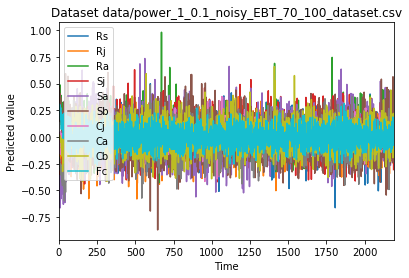

In [233]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 63109 --plot --train_test_split 0.8

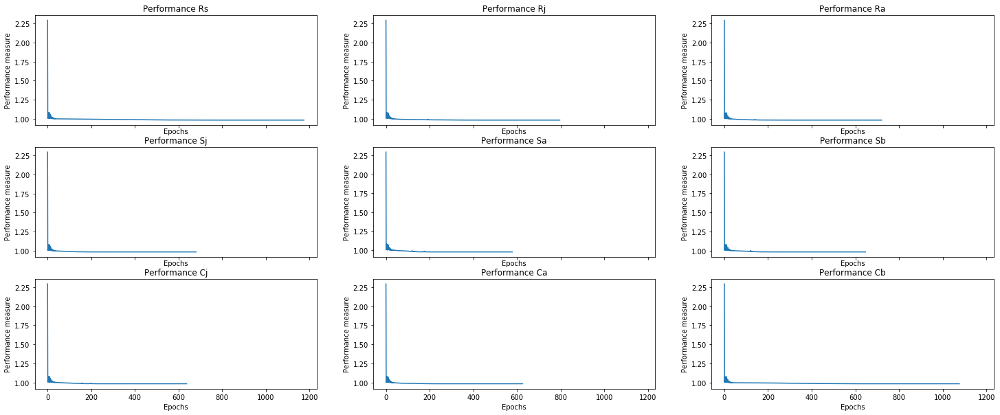

In [234]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

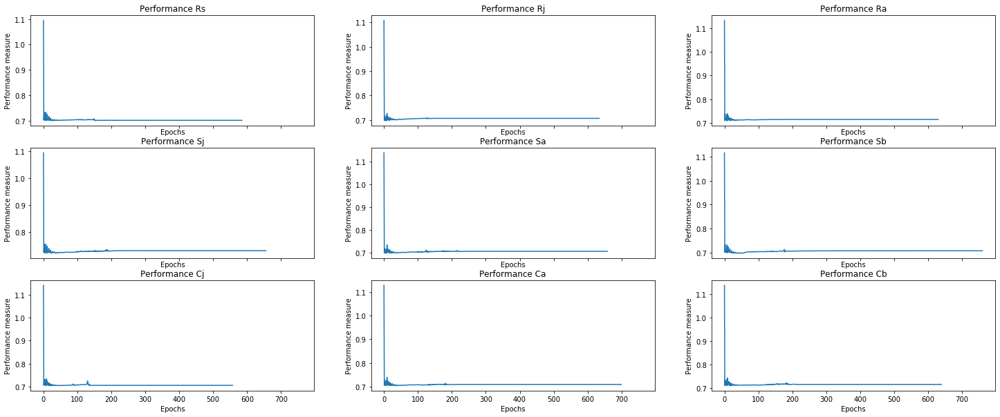

In [235]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 70-100: second run  (increased hidden layers by 1, decreased dilation coefficient and kernel size by 1)

In [236]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 1238

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_70_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=1238, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_70_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.016400
Epoch   105: reducing learning rate of group 0 to 1.0000e-02.
Epoch   116: reducing learning rate of group 0 to 1.0000e-03.
Epoch   127: reducing learning rate of group 0 to 1.0000e-04.
Epoch   138: reducing learning rate of group 0 to 1.0000e-05.
Epoch   149: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.991014
Epoch: 500 [25%] 	Loss: 0.990989
INFO: Early stopping
Potential causes:  [7, 3]
Validated causes:  [7]

 Analysis s

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_70_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=1238, train_test_split=0.8)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.019290
Epoch   144: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.977569
Epoch   407: reducing learning rate of group 0 to 1.0000e-03.
Epoch   419: reducing learning rate of group 0 to 1.0000e-04.
Epoch   430: reducing learning rate of group 0 to 1.0000e-05.
Epoch   441: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.975689
Epoch: 750 [38%] 	Loss: 0.975688
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Lo

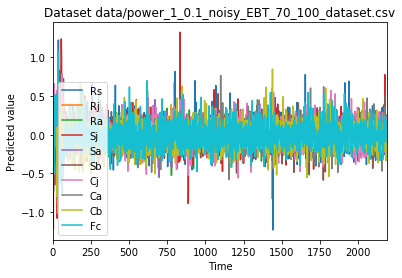

In [237]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 1238 --plot --train_test_split 0.8

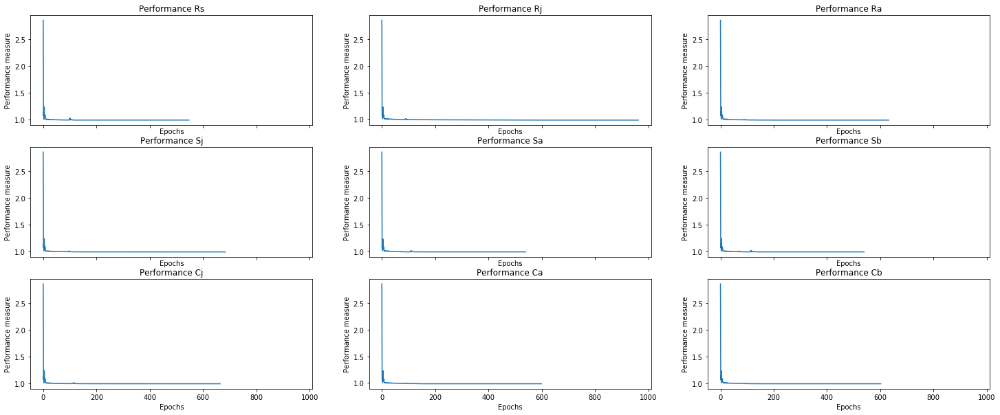

In [238]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

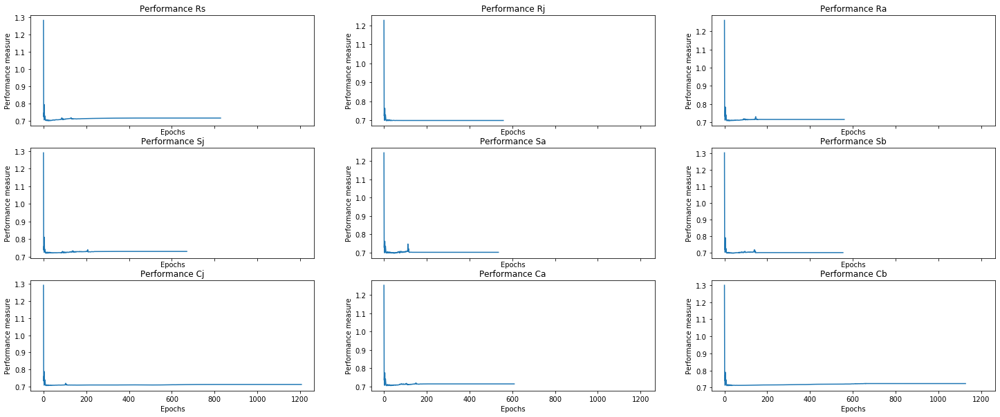

In [239]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [240]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 53988

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_70_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=53988, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_70_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.003570
Epoch    34: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.993554
Epoch   484: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 500 [25%] 	Loss: 0.985231
Epoch   499: reducing learning rate of group 0 to 1.0000e-04.
Epoch   510: reducing learning rate of group 0 to 1.0000e-05.
Epoch   521: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 750 [38%] 	Loss: 0.985217
INFO: Early stopping
Potential causes:  [1, 2, 4

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_70_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=53988, train_test_split=0.8)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.005616
Epoch   101: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.979446
Epoch: 500 [25%] 	Loss: 0.970731
Epoch   678: reducing learning rate of group 0 to 1.0000e-03.
Epoch   692: reducing learning rate of group 0 to 1.0000e-04.
Epoch   703: reducing learning rate of group 0 to 1.0000e-05.
Epoch   714: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 750 [38%] 	Loss: 0.966359
Epoch: 1000 [50%] 	Loss: 0.966357
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializin

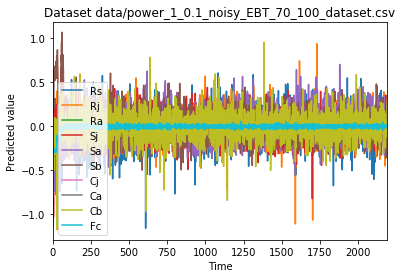

In [241]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 53988 --plot --train_test_split 0.8

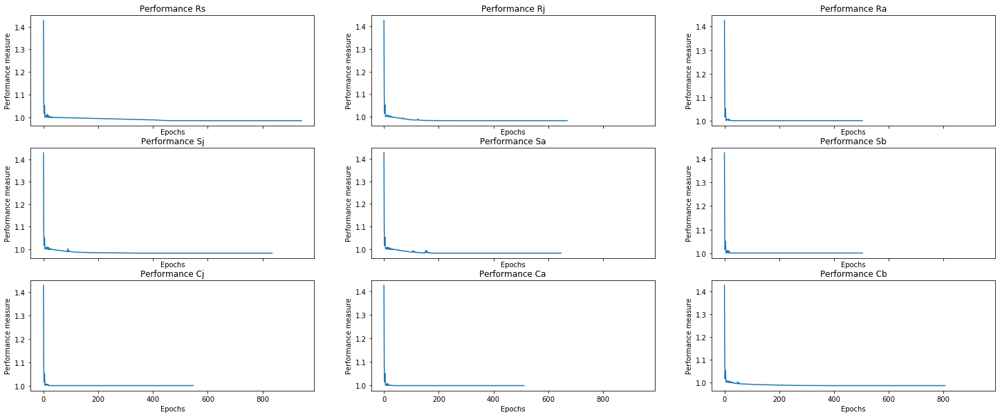

In [242]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

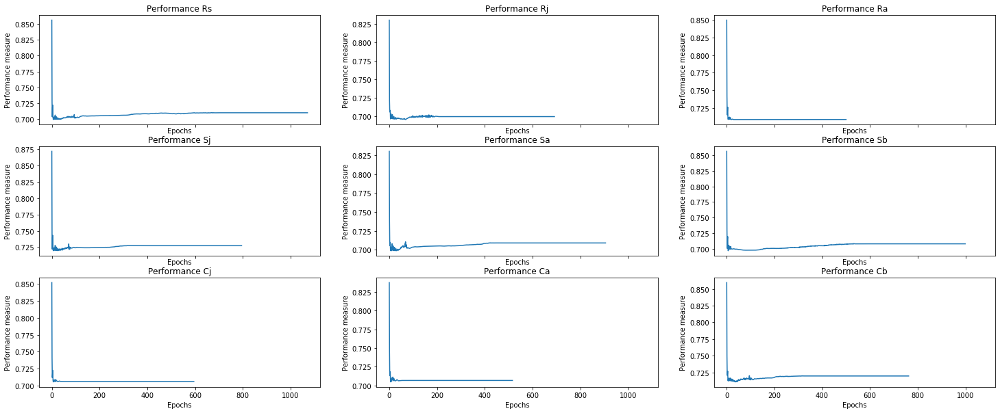

In [243]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [244]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 92422

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_70_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=92422, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_70_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.045827
Epoch   177: reducing learning rate of group 0 to 1.0000e-02.
Epoch   196: reducing learning rate of group 0 to 1.0000e-03.
Epoch   207: reducing learning rate of group 0 to 1.0000e-04.
Epoch   218: reducing learning rate of group 0 to 1.0000e-05.
Epoch   229: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.986418
Epoch: 500 [25%] 	Loss: 0.986417
INFO: Early stopping
Potential causes:  [8, 0, 5, 6]
Validated causes:  [8]

 Ana

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_70_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=92422, train_test_split=0.8)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.044492
Epoch   136: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.982502
Epoch   304: reducing learning rate of group 0 to 1.0000e-03.
Epoch   316: reducing learning rate of group 0 to 1.0000e-04.
Epoch   327: reducing learning rate of group 0 to 1.0000e-05.
Epoch   338: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.981933
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.046779
Epoch   202: reduci

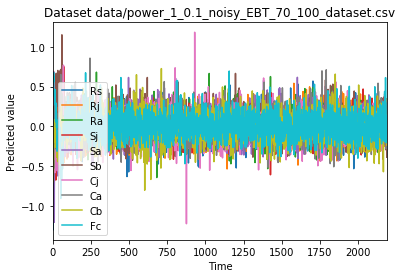

In [245]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 92422 --plot --train_test_split 0.8

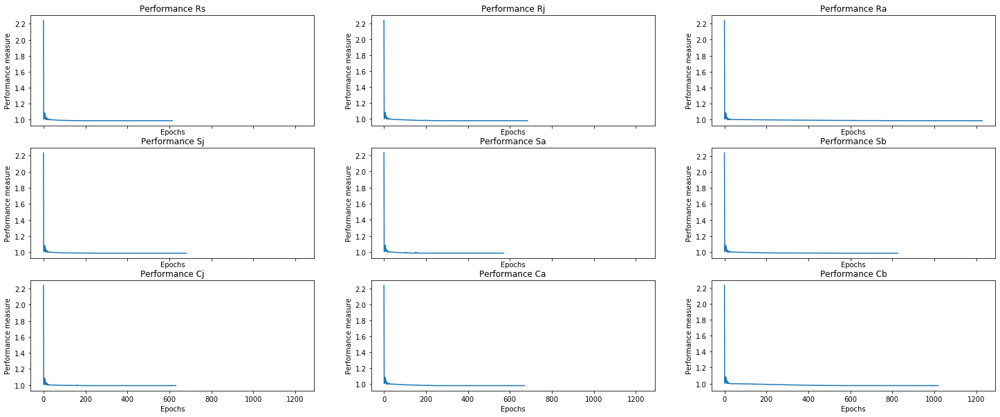

In [246]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

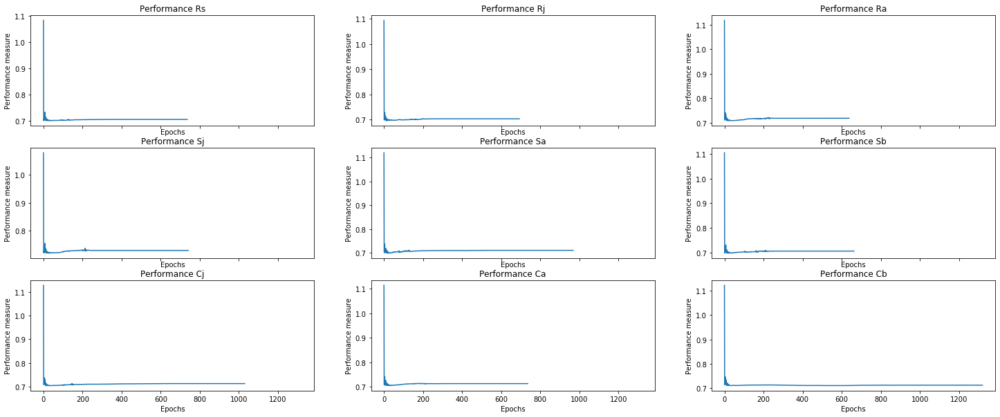

In [247]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 20 - 60 years

,Rs,Rj,Ra,Sj,Sa,Sb,Cj,Ca,Cb,Fc
0,1.619805,-1.660380,-0.884200,-1.769288,-1.239592,-1.568394,-0.204196,-0.865229,2.512651,-2.039574
1,1.610488,-0.804667,1.143859,-1.413256,-1.026544,-1.460783,-0.465537,-0.450810,2.004109,-2.109642
2,1.532000,-0.741227,-0.992218,-1.031663,-1.727543,-1.731204,0.540889,-0.640804,2.288836,-1.932732
3,1.601850,-1.610077,0.199346,-1.557816,-1.693467,-1.682602,-0.235913,-0.387798,2.256123,-1.795879
4,1.640054,-0.646658,-0.673231,-1.724583,-1.755430,-1.780738,-0.965596,-0.643391,2.221148,-1.770458
...,...,...,...,...,...,...,...,...,...,...
14586,-1.894924,1.300067,1.660206,-2.532527,2.248646,-1.020818,-2.065315,-1.203790,-0.002343,1.493271
14587,-1.425848,1.208372,0.243793,-2.189936,2.276375,-1.204536,-2.106960,-1.600298,-0.330527,1.424559
14588,-1.355912,-1.145386,-1.937089,-1.405064,2.221351,-1.163333,-2.151166,-0.883853,-0.497507,1.543403
14589,-1.557981,2.184883,-1.769688,-2.176092,2.230879,-1.278044,-2.143123,-1.138962,-1.431835,1.608207


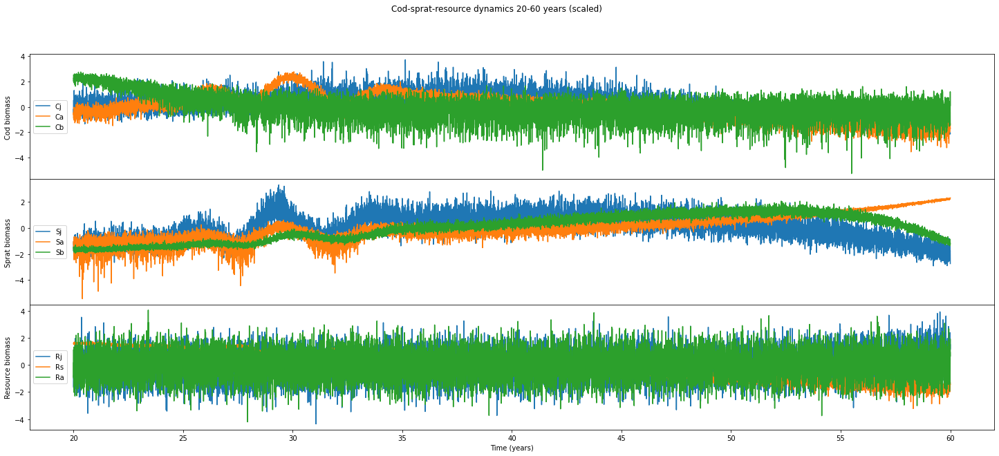

In [18]:
# Select data between 20 and 60 years
noisy_ebt_20_60 = select_data(noisy_ebt, 20, 60, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_0.1_noisy_EBT_20_60_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_20_60.to_csv(EBTScaled_path, index = False)

#### TCDF 20-60 years: first run (in triplicate)

In [249]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 24310

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_20_60_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=24310, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_20_60_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.078662
Epoch    33: reducing learning rate of group 0 to 1.0000e-02.
Epoch    44: reducing learning rate of group 0 to 1.0000e-03.
Epoch    55: reducing learning rate of group 0 to 1.0000e-04.
Epoch    66: reducing learning rate of group 0 to 1.0000e-05.
Epoch    77: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.386079
Epoch: 500 [25%] 	Loss: 0.384805
INFO: Early stopping
Potential causes:  [4, 2, 3, 7, 6]
Validated causes:  [4]

 An

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_20_60_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=24310, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.562968
Epoch    31: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.012020
Epoch: 500 [25%] 	Loss: 0.011544
Epoch: 750 [38%] 	Loss: 0.011333
Epoch: 1000 [50%] 	Loss: 0.011136
Epoch: 1250 [62%] 	Loss: 0.010988
Epoch: 1500 [75%] 	Loss: 0.010880
Epoch  1524: reducing learning rate of group 0 to 1.0000e-03.
Epoch  1539: reducing learning rate of group 0 to 1.0000e-04.
Epoch  1550: reducing learning rate of group 0 to 1.0000e-05.
Epoch  1561: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 1750 [88%] 	Loss: 0.010871
INFO: Early sto

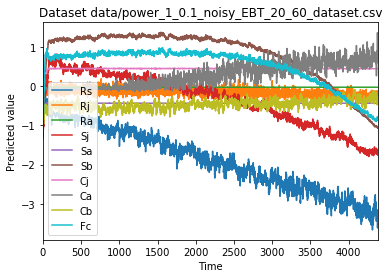

In [250]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 24310 --plot --train_test_split 0.7

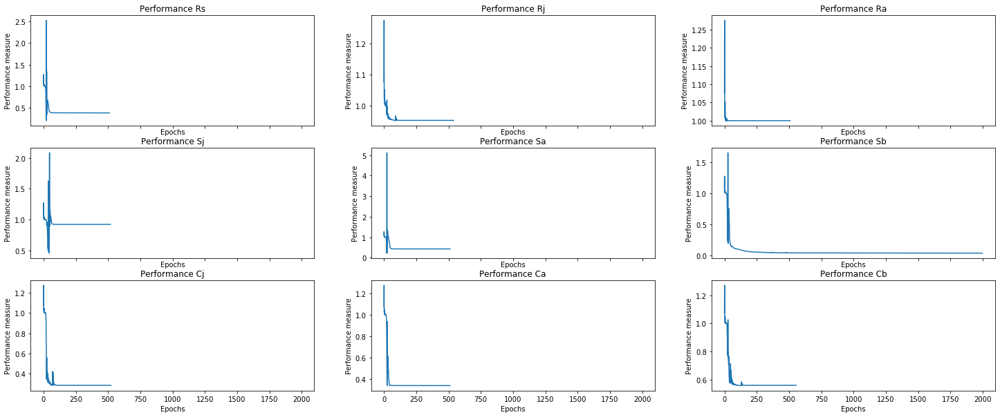

In [251]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

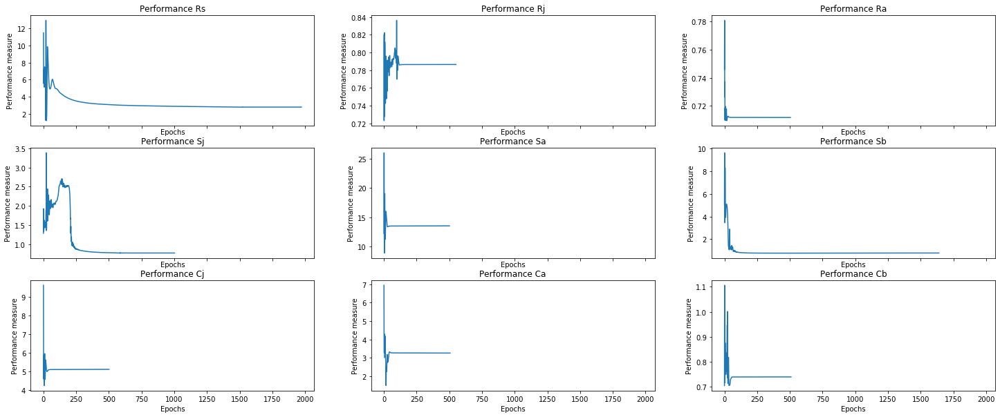

In [252]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [253]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 77139

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_20_60_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=77139, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_20_60_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.109586
Epoch   119: reducing learning rate of group 0 to 1.0000e-02.
Epoch   130: reducing learning rate of group 0 to 1.0000e-03.
Epoch   141: reducing learning rate of group 0 to 1.0000e-04.
Epoch   152: reducing learning rate of group 0 to 1.0000e-05.
Epoch   163: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.096726
Epoch: 500 [25%] 	Loss: 0.096562
INFO: Early stopping
Potential causes:  [2, 5, 3]
Validated causes:  [5, 3]

 Analy

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_20_60_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=77139, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.214444
Epoch    47: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.020295
Epoch: 500 [25%] 	Loss: 0.012254
Epoch: 750 [38%] 	Loss: 0.011180
Epoch   804: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 1000 [50%] 	Loss: 0.011017
Epoch: 1250 [62%] 	Loss: 0.010961
Epoch: 1500 [75%] 	Loss: 0.010901
Epoch: 1750 [88%] 	Loss: 0.010839
Epoch: 2000 [100%] 	Loss: 0.010778

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.006148
Epoch    87: reducing l

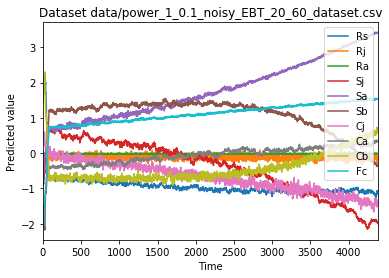

In [254]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 77139 --plot --train_test_split 0.7

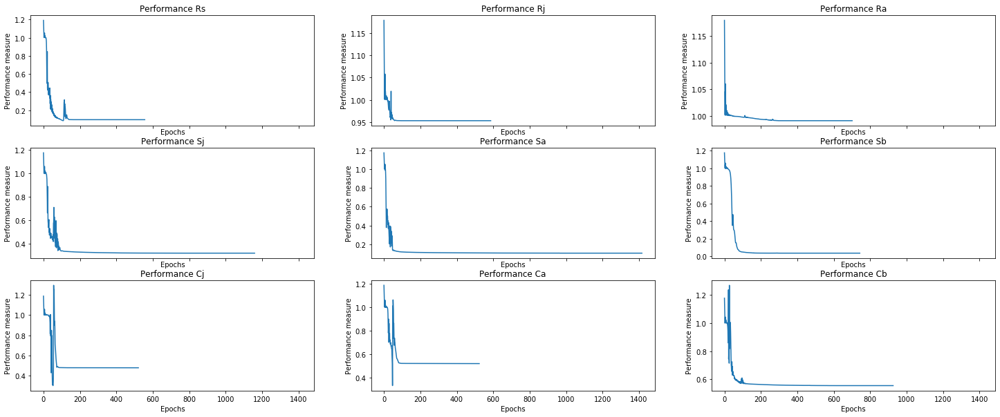

In [255]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

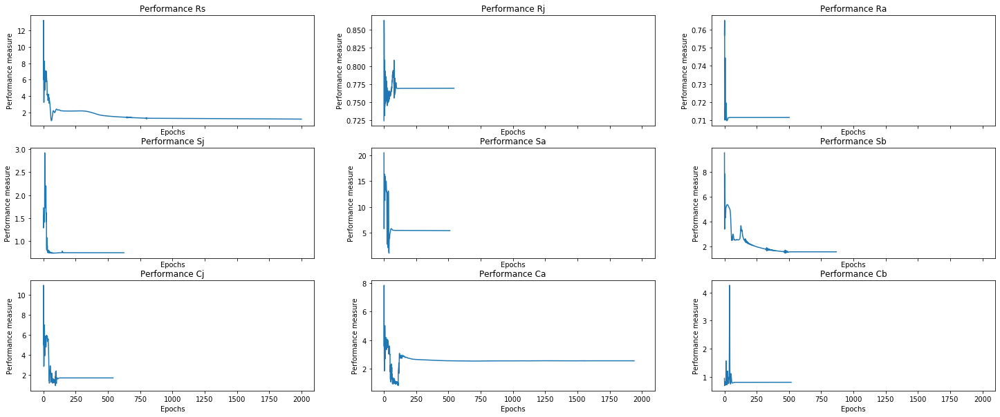

In [256]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [257]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 45184

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_20_60_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=45184, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_20_60_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.008124
Epoch    24: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.064766
Epoch: 500 [25%] 	Loss: 0.058114
Epoch: 750 [38%] 	Loss: 0.033668
Epoch   846: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 1000 [50%] 	Loss: 0.032273
Epoch: 1250 [62%] 	Loss: 0.031967
Epoch: 1500 [75%] 	Loss: 0.031586
Epoch: 1750 [88%] 	Loss: 0.030374
Epoch: 2000 [100%] 	Loss: 0.028545
Potential causes:  [6, 4]
Validated causes:  [4]

 Analysis start

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_20_60_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=45184, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.867864
Epoch   211: reducing learning rate of group 0 to 1.0000e-02.
Epoch   231: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [12%] 	Loss: 0.011088
Epoch   254: reducing learning rate of group 0 to 1.0000e-04.
Epoch   265: reducing learning rate of group 0 to 1.0000e-05.
Epoch   276: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.011050
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.958971
Epoch    19: reducin

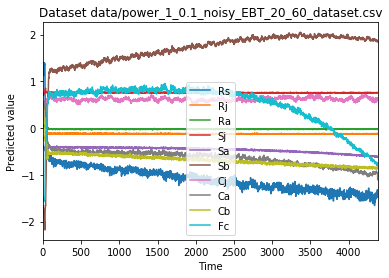

In [258]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 45184 --plot --train_test_split 0.7

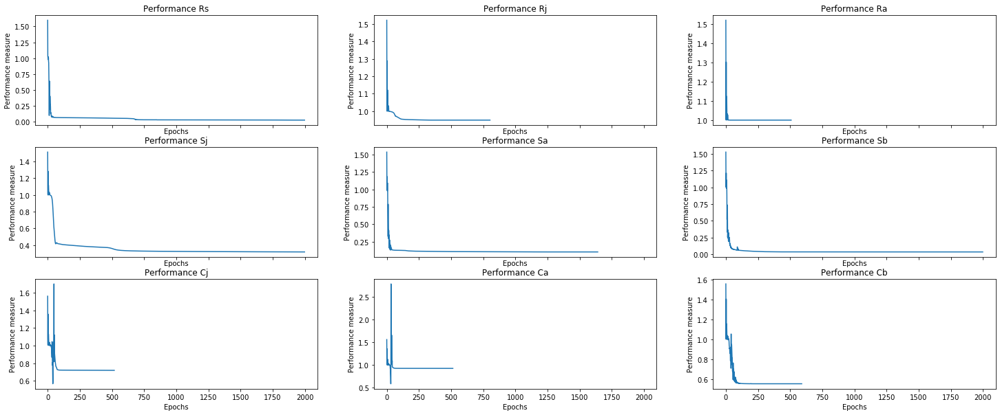

In [259]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

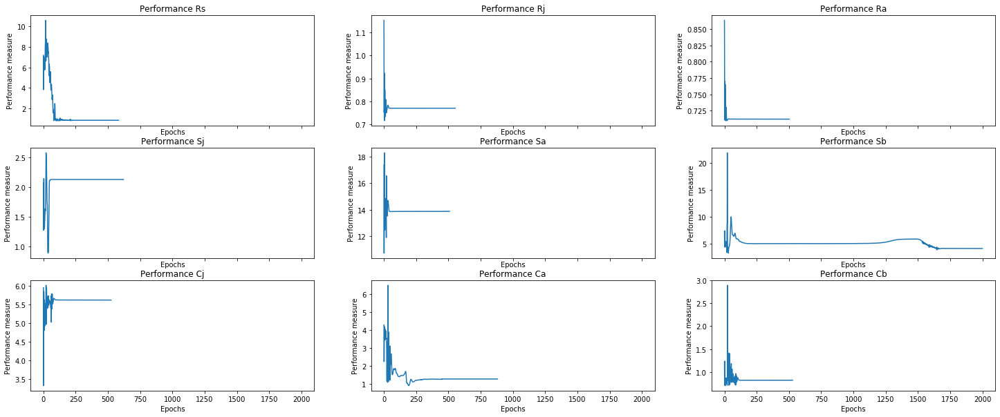

In [260]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 20-60 years: second run  (decreased hidden layers by 1, increased dilation coefficient and kernel size by 1)

In [19]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 78025

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_20_60_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=78025, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_20_60_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.000995
Epoch    21: reducing learning rate of group 0 to 1.0000e-02.
Epoch    56: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [12%] 	Loss: 0.033495
Epoch: 500 [25%] 	Loss: 0.031903
Epoch: 750 [38%] 	Loss: 0.030370
Epoch: 1000 [50%] 	Loss: 0.028936
Epoch: 1250 [62%] 	Loss: 0.027771
Epoch: 1500 [75%] 	Loss: 0.027317
Epoch: 1750 [88%] 	Loss: 0.027184
Epoch: 2000 [100%] 	Loss: 0.027090
Potential causes:  [0, 9, 6, 3, 2]
Validated causes:  [0]

 Analy

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_20_60_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=78025, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.739093
Epoch   117: reducing learning rate of group 0 to 1.0000e-02.
Epoch   128: reducing learning rate of group 0 to 1.0000e-03.
Epoch   139: reducing learning rate of group 0 to 1.0000e-04.
Epoch   150: reducing learning rate of group 0 to 1.0000e-05.
Epoch   161: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.013377
Epoch: 500 [25%] 	Loss: 0.013371
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.975986
Epoch   186: reducin

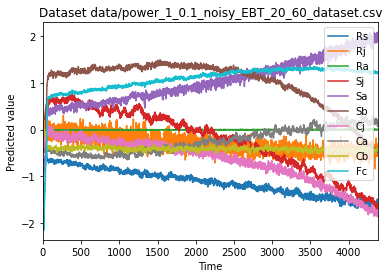

<Figure size 432x288 with 0 Axes>

In [20]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 78025 --plot --train_test_split 0.7

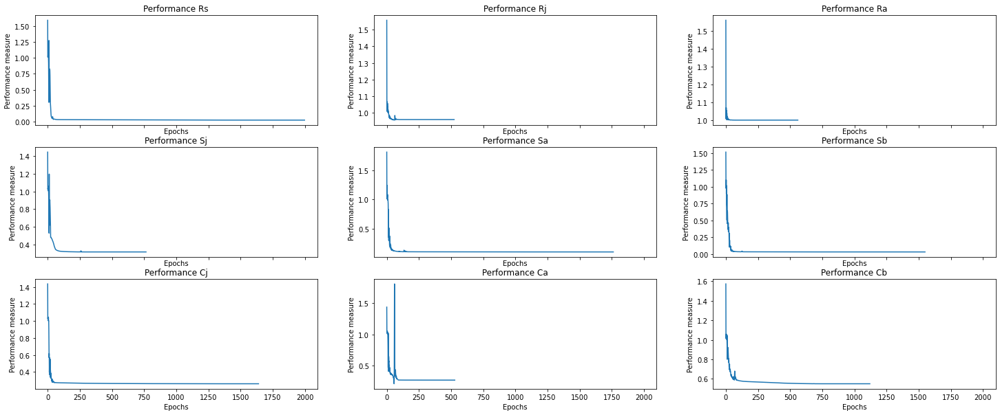

In [21]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

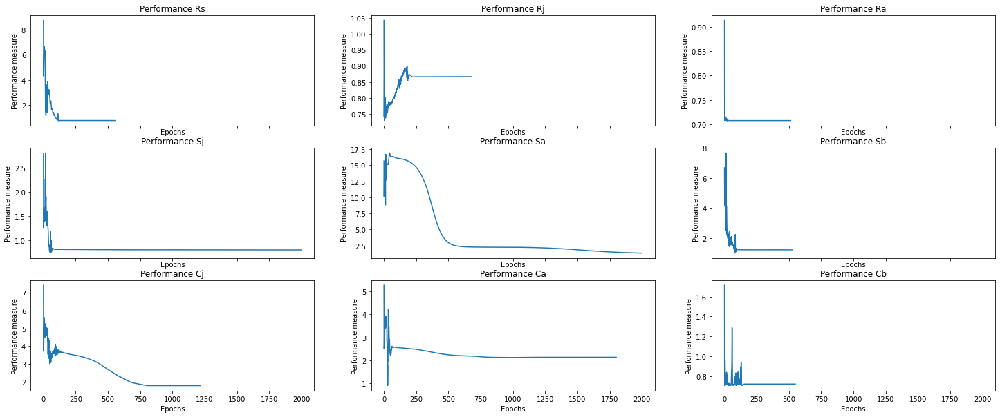

In [22]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [23]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 53391

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_20_60_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=53391, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_20_60_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.083482
Epoch: 250 [12%] 	Loss: 0.027135
Epoch   343: reducing learning rate of group 0 to 1.0000e-02.
Epoch   354: reducing learning rate of group 0 to 1.0000e-03.
Epoch   365: reducing learning rate of group 0 to 1.0000e-04.
Epoch   376: reducing learning rate of group 0 to 1.0000e-05.
Epoch   387: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.027200
Epoch: 750 [38%] 	Loss: 0.027184
INFO: Early stopping
Potential causes:  [4, 0]
Val

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_20_60_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=53391, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.144991
Epoch    96: reducing learning rate of group 0 to 1.0000e-02.
Epoch   107: reducing learning rate of group 0 to 1.0000e-03.
Epoch   118: reducing learning rate of group 0 to 1.0000e-04.
Epoch   129: reducing learning rate of group 0 to 1.0000e-05.
Epoch   140: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.011102
Epoch: 500 [25%] 	Loss: 0.011100
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.997321
Epoch    18: reducin

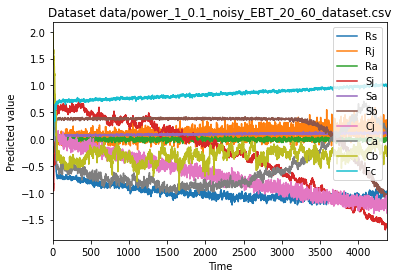

<Figure size 432x288 with 0 Axes>

In [24]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 53391 --plot --train_test_split 0.7

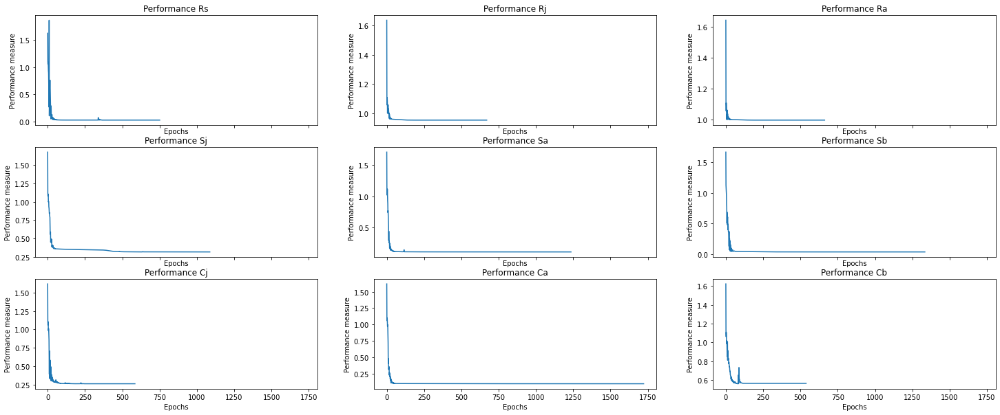

In [25]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

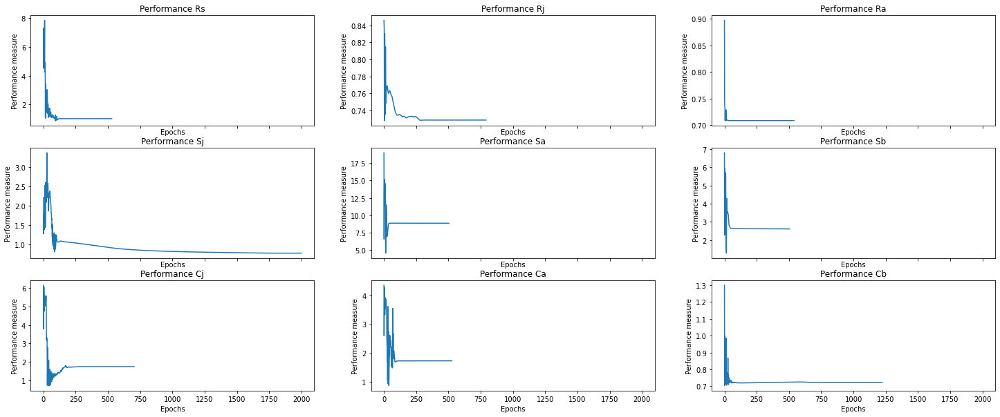

In [26]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [27]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 34061

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_20_60_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=34061, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_20_60_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.051311
Epoch   143: reducing learning rate of group 0 to 1.0000e-02.
Epoch   154: reducing learning rate of group 0 to 1.0000e-03.
Epoch   165: reducing learning rate of group 0 to 1.0000e-04.
Epoch   176: reducing learning rate of group 0 to 1.0000e-05.
Epoch   187: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.031812
Epoch: 500 [25%] 	Loss: 0.031810
INFO: Early stopping
Potential causes:  [0, 5]
Validated causes:  [0]

 Analysis st

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_20_60_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=34061, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.049089
Epoch   145: reducing learning rate of group 0 to 1.0000e-02.
Epoch   156: reducing learning rate of group 0 to 1.0000e-03.
Epoch   167: reducing learning rate of group 0 to 1.0000e-04.
Epoch   178: reducing learning rate of group 0 to 1.0000e-05.
Epoch   189: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.011391
Epoch: 500 [25%] 	Loss: 0.011378
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.977123
Epoch   112: reducin

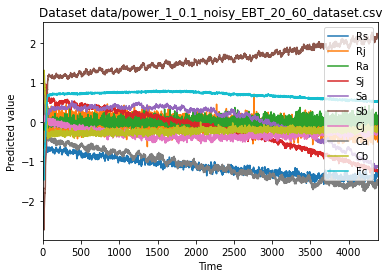

<Figure size 432x288 with 0 Axes>

In [28]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 34061 --plot --train_test_split 0.7

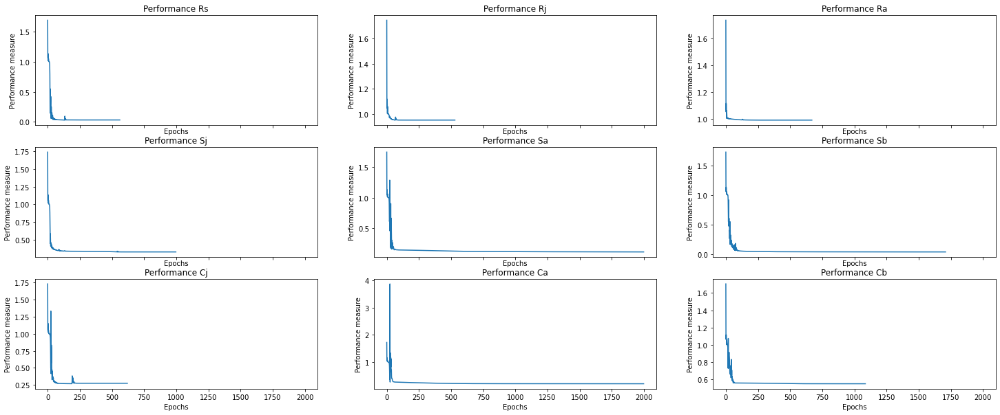

In [29]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

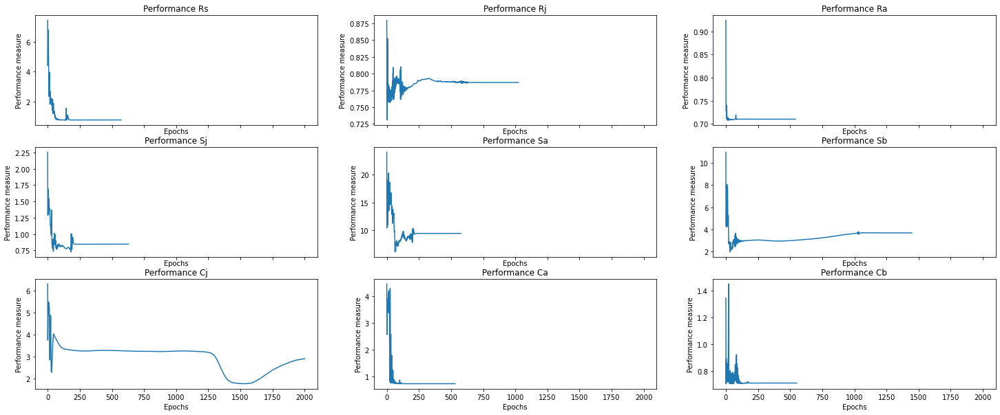

In [30]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 60 - 70 years

,Rs,Rj,Ra,Sj,Sa,Sb,Cj,Ca,Cb,Fc
0,1.196380,-0.115955,1.894982,-0.167067,-1.713293,1.693715,1.225272,-0.346734,0.491916,1.480122
1,1.197857,-0.448463,-2.156727,2.589748,-1.793191,1.749250,0.676572,-0.136770,0.255663,0.697338
2,1.191255,-0.717677,1.535694,2.167821,-1.837996,1.695686,1.826513,0.423399,0.168439,-1.556867
3,0.564909,-0.786734,0.066200,0.265131,-1.792784,1.739012,1.055109,-0.315842,1.053470,-0.715068
4,-1.023078,-1.462463,-1.011111,0.159709,-1.845298,1.756377,1.465671,0.054461,0.151699,0.234150
...,...,...,...,...,...,...,...,...,...,...
3636,-1.842563,1.282772,2.188951,0.485101,1.281356,-1.549765,1.024049,-1.640064,-0.767786,-1.900997
3637,0.026090,1.999397,-0.874698,0.394388,1.532407,-0.860011,-0.096437,-1.601107,-1.171943,0.119968
3638,0.537971,0.861056,0.713867,-1.027765,0.810293,-1.430906,-1.845684,0.822298,-0.541055,-0.035457
3639,0.456459,-0.623053,0.732027,-0.880581,0.994578,-1.537398,-0.581066,-0.569632,0.800566,0.914950


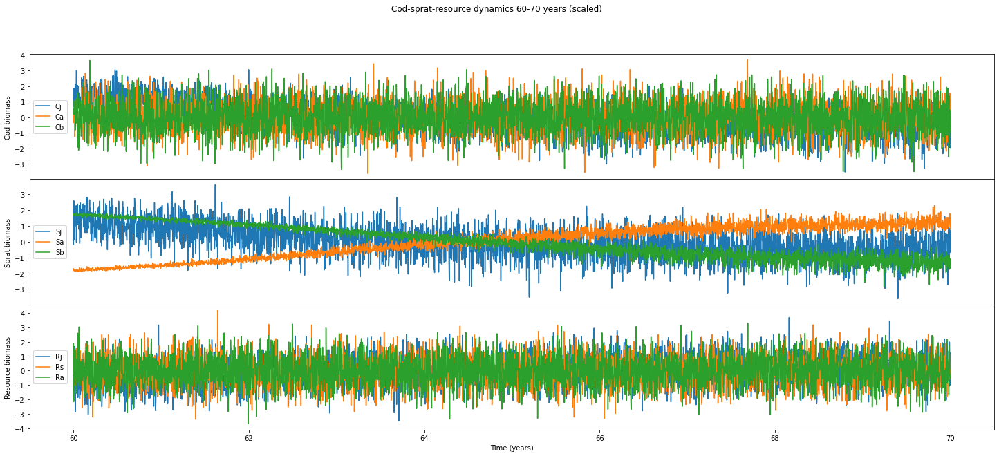

In [31]:
# Select data between 60 and 70 years
noisy_ebt_60_70 = select_data(noisy_ebt, 60, 70, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_0.1_noisy_EBT_60_70_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_60_70.to_csv(EBTScaled_path, index = False)

#### TCDF 60-70 years: first run (in triplicate)

In [32]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 2369

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_60_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=2369, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_60_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.028925
Epoch    14: reducing learning rate of group 0 to 1.0000e-02.
Epoch    25: reducing learning rate of group 0 to 1.0000e-03.
Epoch    36: reducing learning rate of group 0 to 1.0000e-04.
Epoch    47: reducing learning rate of group 0 to 1.0000e-05.
Epoch    58: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 1.001697
Epoch: 500 [25%] 	Loss: 1.001614
INFO: Early stopping
Potential causes:  [1, 9, 4, 8]
Validated causes:  []

 Analysi

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_60_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=2369, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.043079
Epoch    15: reducing learning rate of group 0 to 1.0000e-02.
Epoch    26: reducing learning rate of group 0 to 1.0000e-03.
Epoch    37: reducing learning rate of group 0 to 1.0000e-04.
Epoch    48: reducing learning rate of group 0 to 1.0000e-05.
Epoch    59: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 1.018535
Epoch: 500 [25%] 	Loss: 1.018424
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.085998
Epoch    27: reducing

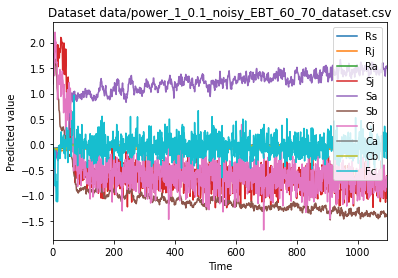

<Figure size 432x288 with 0 Axes>

In [33]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 2369 --plot --train_test_split 0.7

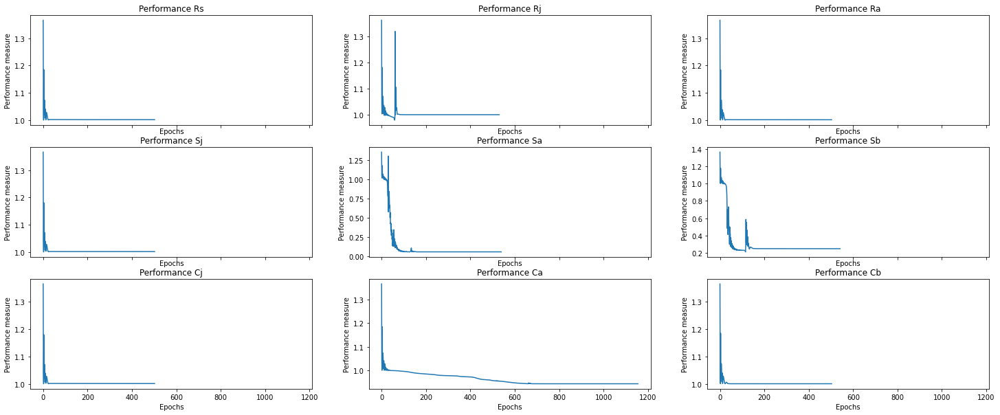

In [34]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

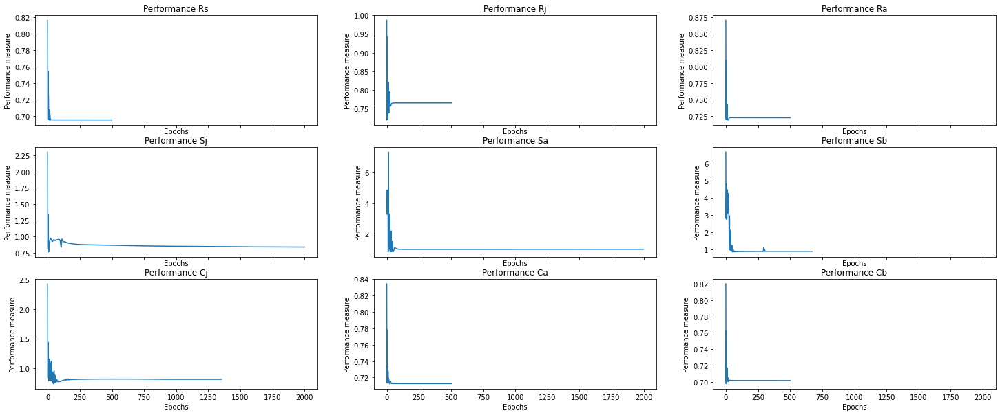

In [35]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [36]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 33520

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_60_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=33520, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_60_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.000329
Epoch    13: reducing learning rate of group 0 to 1.0000e-02.
Epoch    24: reducing learning rate of group 0 to 1.0000e-03.
Epoch    35: reducing learning rate of group 0 to 1.0000e-04.
Epoch    46: reducing learning rate of group 0 to 1.0000e-05.
Epoch    57: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 1.001888
Epoch: 500 [25%] 	Loss: 1.001886
INFO: Early stopping
Potential causes:  [9, 2]
Validated causes:  [9, 2]

 Analysis

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_60_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=33520, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.016870
Epoch    14: reducing learning rate of group 0 to 1.0000e-02.
Epoch    25: reducing learning rate of group 0 to 1.0000e-03.
Epoch    36: reducing learning rate of group 0 to 1.0000e-04.
Epoch    47: reducing learning rate of group 0 to 1.0000e-05.
Epoch    58: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 1.018510
Epoch: 500 [25%] 	Loss: 1.018501
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.018782
Epoch   144: reducin

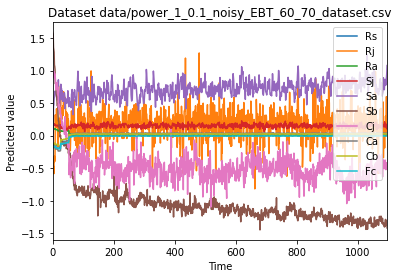

<Figure size 432x288 with 0 Axes>

In [37]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 33520 --plot --train_test_split 0.7

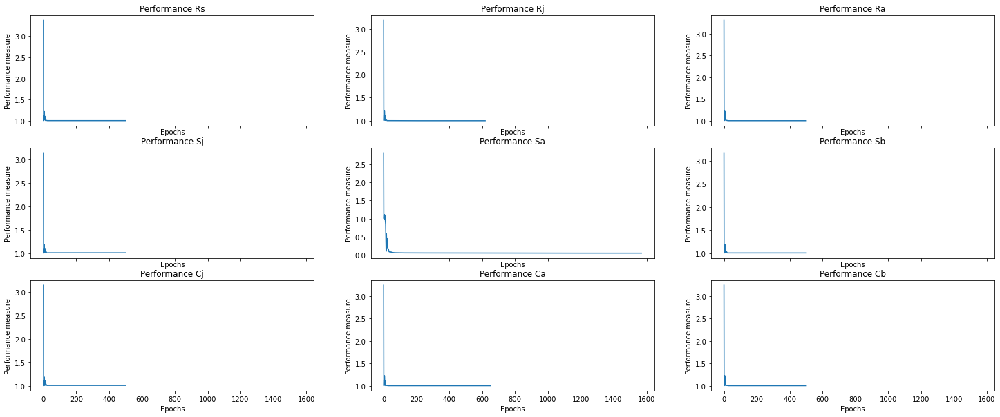

In [38]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

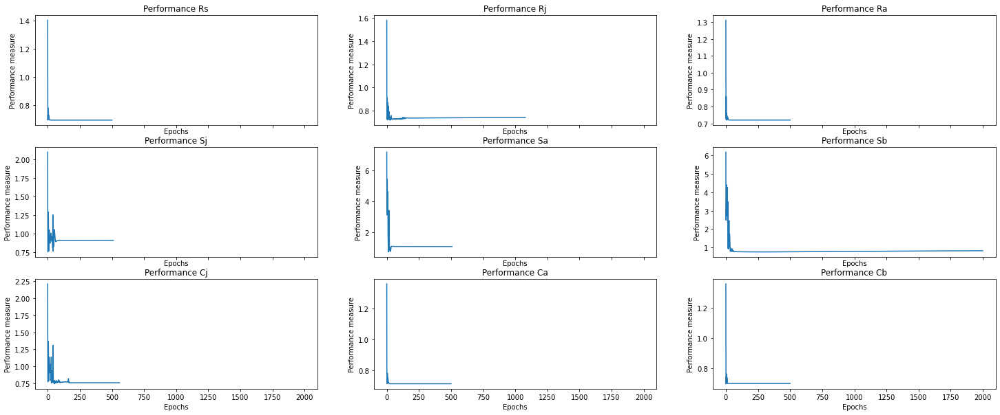

In [39]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [40]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 66848

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_60_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=66848, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_60_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.103936
Epoch: 250 [12%] 	Loss: 0.953318
Epoch   274: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 500 [25%] 	Loss: 0.941075
Epoch: 750 [38%] 	Loss: 0.937696
Epoch   859: reducing learning rate of group 0 to 1.0000e-03.
Epoch   891: reducing learning rate of group 0 to 1.0000e-04.
Epoch   902: reducing learning rate of group 0 to 1.0000e-05.
Epoch   913: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 1000 [50%] 	Loss: 0.935522
INFO: Early stop

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_60_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=66848, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.124382
Epoch   157: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.953260
Epoch   433: reducing learning rate of group 0 to 1.0000e-03.
Epoch   448: reducing learning rate of group 0 to 1.0000e-04.
Epoch   459: reducing learning rate of group 0 to 1.0000e-05.
Epoch   470: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.951232
Epoch: 750 [38%] 	Loss: 0.951232
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Lo

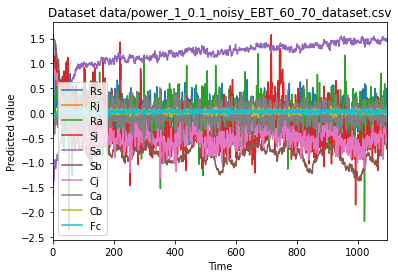

<Figure size 432x288 with 0 Axes>

In [41]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 66848 --plot --train_test_split 0.7

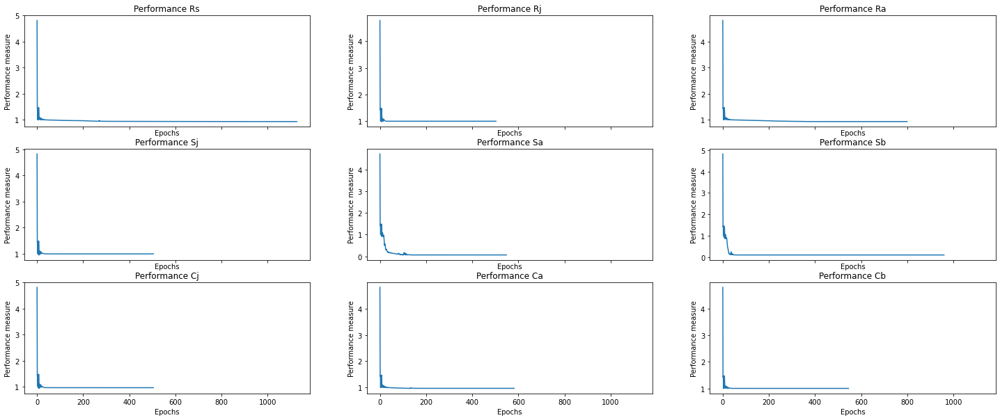

In [42]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

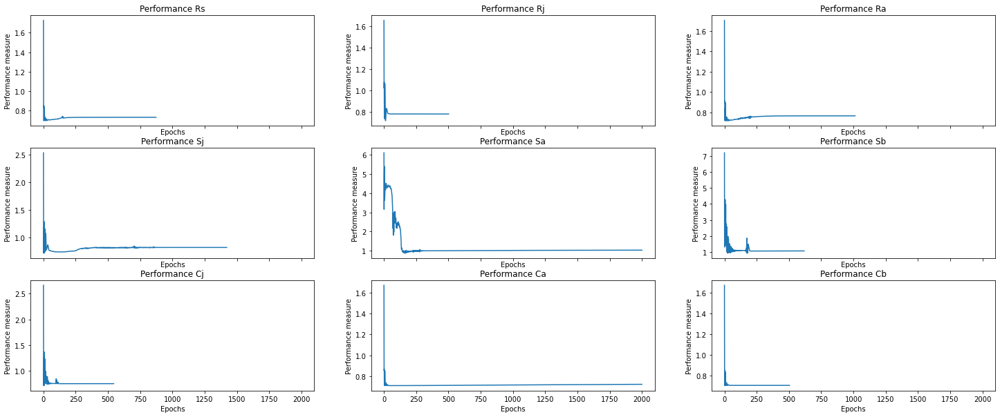

In [43]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 60-70 years: second run  (decreased hidden layers by 1, increased dilation coefficient and kernel size by 1)

In [44]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 2369

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_60_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=2369, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_60_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.084937
Epoch    70: reducing learning rate of group 0 to 1.0000e-02.
Epoch    81: reducing learning rate of group 0 to 1.0000e-03.
Epoch    92: reducing learning rate of group 0 to 1.0000e-04.
Epoch   103: reducing learning rate of group 0 to 1.0000e-05.
Epoch   114: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.984872
Epoch: 500 [25%] 	Loss: 0.984853
INFO: Early stopping
Potential causes:  [1, 2]
Validated causes:  [1]

 Analysis sta

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_60_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=2369, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.097562
Epoch   127: reducing learning rate of group 0 to 1.0000e-02.
Epoch   138: reducing learning rate of group 0 to 1.0000e-03.
Epoch   149: reducing learning rate of group 0 to 1.0000e-04.
Epoch   160: reducing learning rate of group 0 to 1.0000e-05.
Epoch   171: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.962972
Epoch: 500 [25%] 	Loss: 0.962944
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.166500
Epoch   103: reducing

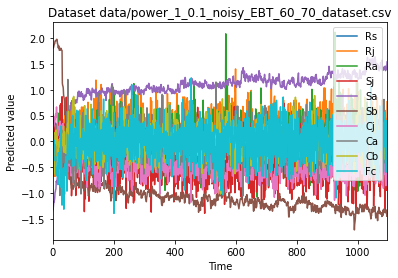

<Figure size 432x288 with 0 Axes>

In [45]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 2369 --plot --train_test_split 0.7

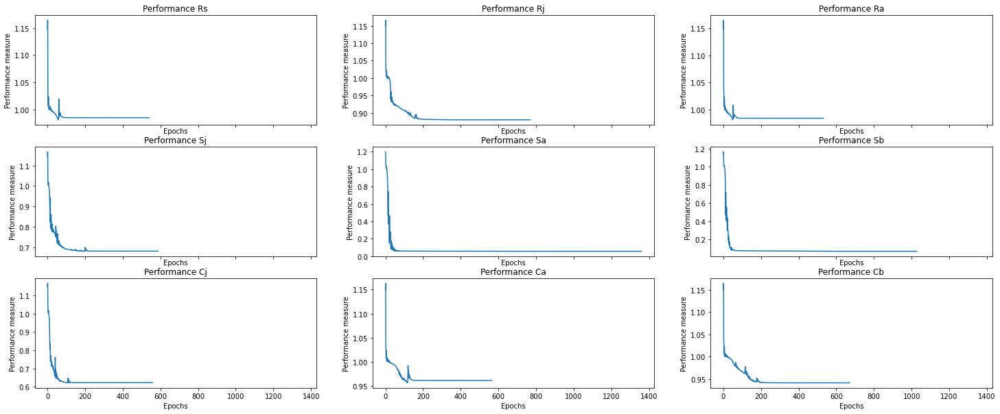

In [46]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

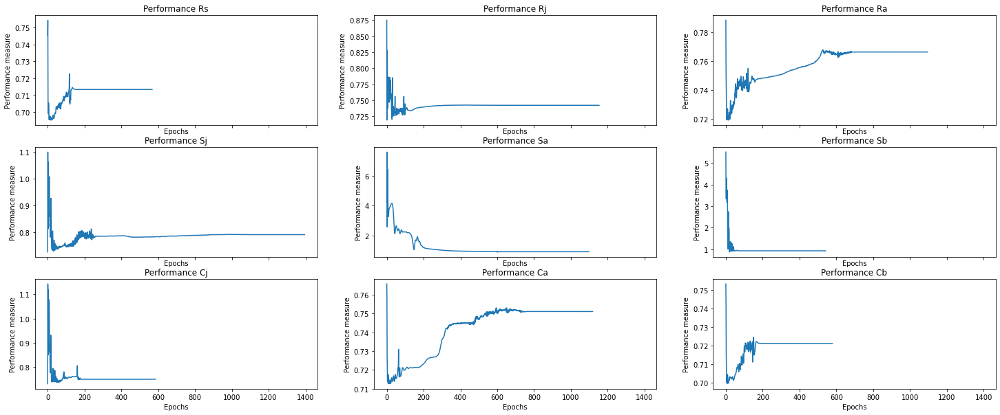

In [47]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [48]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 21312

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_60_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=21312, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_60_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.036378
Epoch   189: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.935174
Epoch   372: reducing learning rate of group 0 to 1.0000e-03.
Epoch   384: reducing learning rate of group 0 to 1.0000e-04.
Epoch   395: reducing learning rate of group 0 to 1.0000e-05.
Epoch   406: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.933571
Epoch: 750 [38%] 	Loss: 0.933570
INFO: Early stopping
Potential causes:  [9, 2]
Val

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_60_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=21312, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.055066
Epoch   186: reducing learning rate of group 0 to 1.0000e-02.
Epoch   197: reducing learning rate of group 0 to 1.0000e-03.
Epoch   208: reducing learning rate of group 0 to 1.0000e-04.
Epoch   219: reducing learning rate of group 0 to 1.0000e-05.
Epoch   230: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.956482
Epoch: 500 [25%] 	Loss: 0.956459
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.019909
Epoch    12: reducin

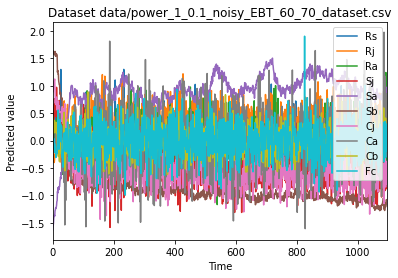

<Figure size 432x288 with 0 Axes>

In [49]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 21312 --plot --train_test_split 0.7

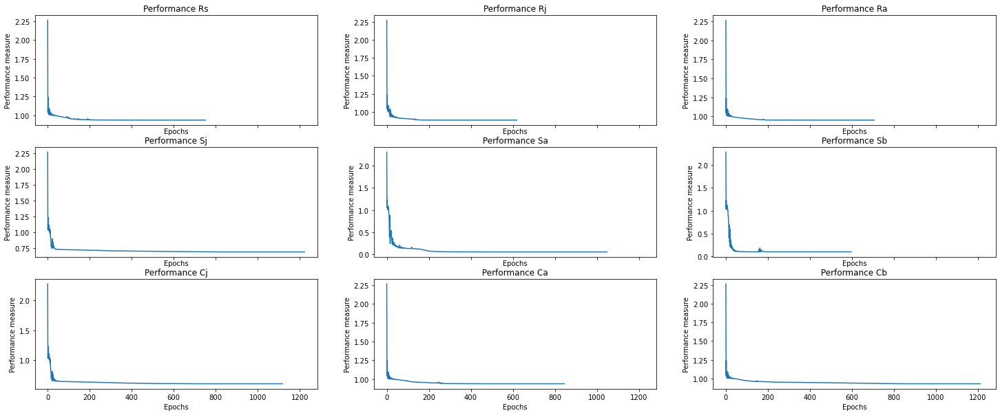

In [50]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

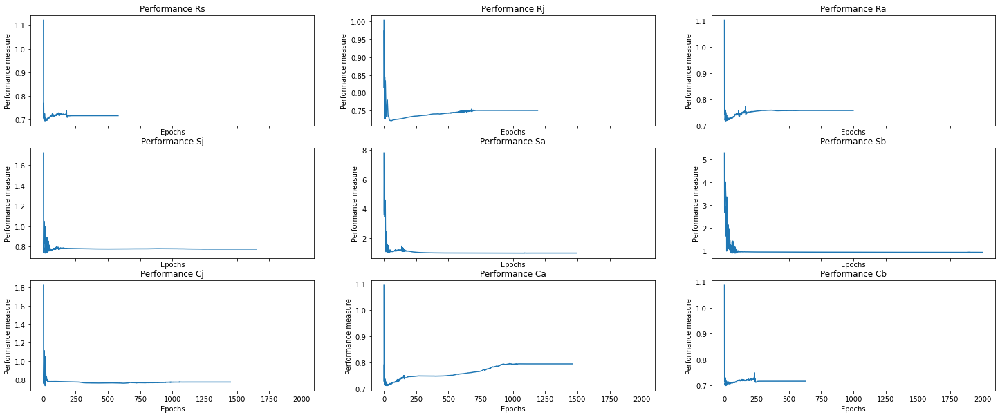

In [51]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [52]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_0.1_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 8023

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_0.1_noisy_EBT_60_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=8023, significance=0.9)

 Dataset:  power_1_0.1_noisy_EBT_60_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.003505
Epoch    23: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.974215
Epoch: 500 [25%] 	Loss: 0.943828
Epoch   592: reducing learning rate of group 0 to 1.0000e-03.
Epoch   606: reducing learning rate of group 0 to 1.0000e-04.
Epoch   617: reducing learning rate of group 0 to 1.0000e-05.
Epoch   628: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 750 [38%] 	Loss: 0.941973
Epoch: 1000 [50%] 	Loss: 0.941972
INFO: Early stopp

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_0.1_noisy_EBT_60_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=8023, train_test_split=0.7)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.019068
Epoch    74: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.979163
Epoch: 500 [25%] 	Loss: 0.950522
Epoch   593: reducing learning rate of group 0 to 1.0000e-03.
Epoch   608: reducing learning rate of group 0 to 1.0000e-04.
Epoch   619: reducing learning rate of group 0 to 1.0000e-05.
Epoch   640: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 750 [38%] 	Loss: 0.945772
Epoch: 1000 [50%] 	Loss: 0.945768
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing 

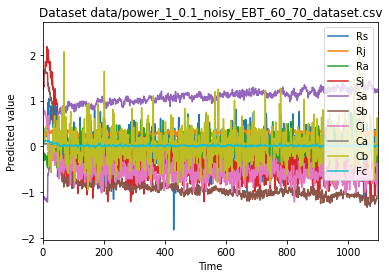

<Figure size 432x288 with 0 Axes>

In [53]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_0.1_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 8023 --plot --train_test_split 0.7

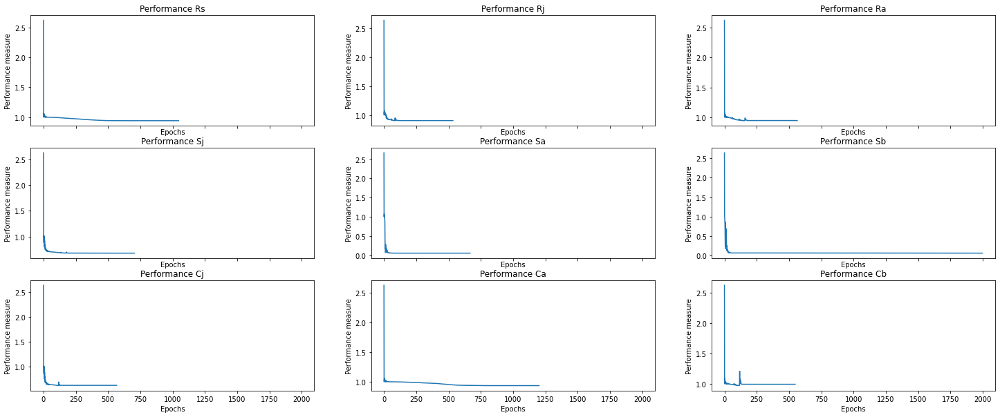

In [54]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

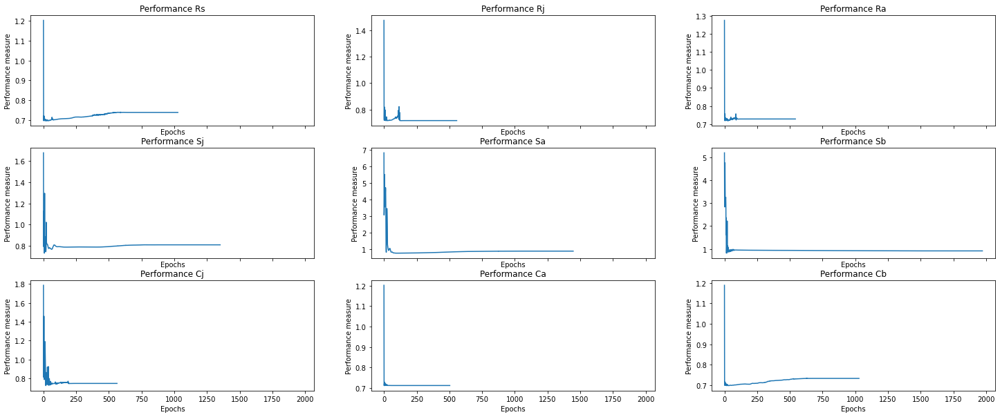

In [55]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

### Signal to Noise ratio 1:1

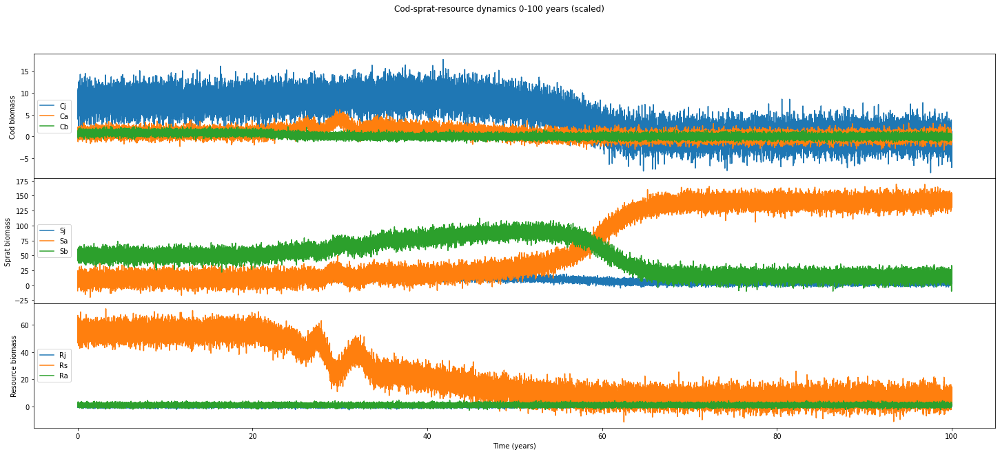

In [56]:
# Create new dataset with snr 1:1
noisy_ebt = noisy_data(1)

#### 20 - 70 years

,Rs,Rj,Ra,Sj,Sa,Sb,Cj,Ca,Cb,Fc
0,1.816755,0.123709,-1.079847,0.825216,-0.633717,-0.895841,1.745566,-0.828270,1.532521,-1.019757
1,2.107558,0.324108,0.371923,-0.879317,-1.069583,-0.279106,-0.076400,-1.136521,-0.031023,-0.601871
2,1.851754,-1.102546,-1.545242,-0.274766,-0.944047,-0.623236,0.166018,-0.499986,-0.039272,-1.379074
3,1.929355,-1.323095,-0.727457,-0.792845,-0.805287,-1.167204,0.558820,0.092811,0.832407,-0.713060
4,1.682819,1.405750,-2.073329,-1.130198,-1.167276,-0.832443,-0.458226,0.558791,0.619647,-0.965756
...,...,...,...,...,...,...,...,...,...,...
18236,-2.254598,2.430557,1.011950,-0.808448,1.748092,-2.040529,-1.691201,-2.482040,-0.244670,-2.564305
18237,-0.725350,0.389612,-0.297595,-0.636691,1.804212,-1.586193,-1.848422,-0.920657,0.084773,-1.086537
18238,-1.486836,1.332546,1.257545,-2.246152,1.929775,-2.082091,-1.487797,-0.178981,-0.751227,-1.360327
18239,-0.540544,-0.003828,1.257916,-2.358174,1.719637,-2.085994,-1.878888,-1.032532,0.837439,-1.125737


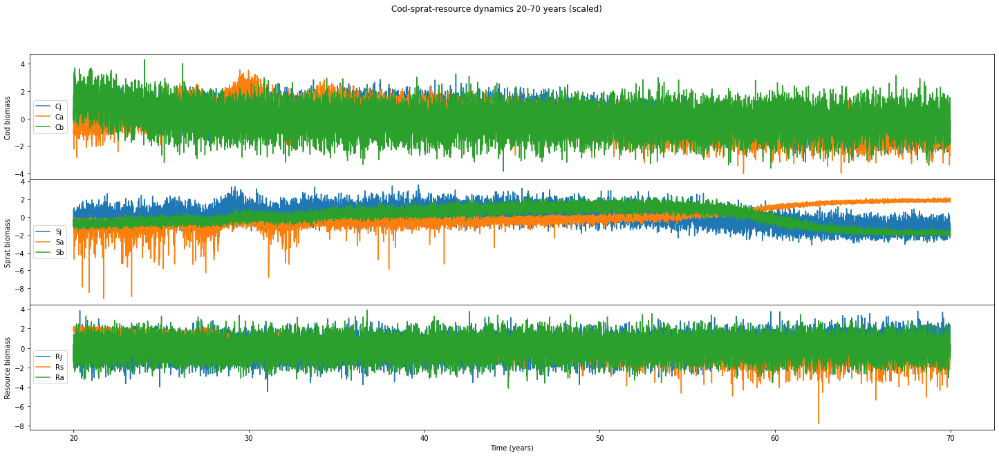

In [57]:
# Select data between 20 and 70 years
noisy_ebt_20_70 = select_data(noisy_ebt, 20, 70, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_1_noisy_EBT_20_70_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_20_70.to_csv(EBTScaled_path, index = False)

#### TCDF 20-70 years: first run (in triplicate)

In [58]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 5678


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_1_noisy_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=5678, significance=0.9)

 Dataset:  power_1_1_noisy_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.020096
Epoch   144: reducing learning rate of group 0 to 1.0000e-02.
Epoch   155: reducing learning rate of group 0 to 1.0000e-03.
Epoch   166: reducing learning rate of group 0 to 1.0000e-04.
Epoch   177: reducing learning rate of group 0 to 1.0000e-05.
Epoch   188: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.203764
Epoch: 500 [25%] 	Loss: 0.203584
INFO: Early stopping
Potential causes:  [4, 3]
Validated causes:  [4]

 Analysis started

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_1_noisy_EBT_20_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=5467, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.711270
Epoch    34: reducing learning rate of group 0 to 1.0000e-02.
Epoch    45: reducing learning rate of group 0 to 1.0000e-03.
Epoch    56: reducing learning rate of group 0 to 1.0000e-04.
Epoch    67: reducing learning rate of group 0 to 1.0000e-05.
Epoch    78: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.453369
Epoch: 500 [25%] 	Loss: 0.453151
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.148210
Epoch    38: reducing l

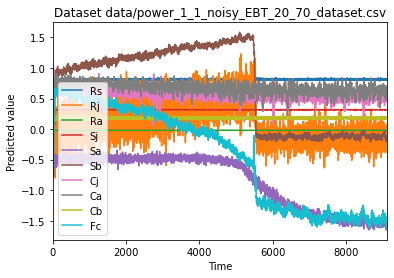

<Figure size 432x288 with 0 Axes>

In [59]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 5467 --plot --train_test_split 0.5

In [60]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 2371


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_1_noisy_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=2371, significance=0.9)

 Dataset:  power_1_1_noisy_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.033898
Epoch   194: reducing learning rate of group 0 to 1.0000e-02.
Epoch   205: reducing learning rate of group 0 to 1.0000e-03.
Epoch   216: reducing learning rate of group 0 to 1.0000e-04.
Epoch   227: reducing learning rate of group 0 to 1.0000e-05.
Epoch   238: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.163362
Epoch: 500 [25%] 	Loss: 0.163321
INFO: Early stopping
Potential causes:  [0, 3]
Validated causes:  [0]

 Analysis started

Arguments: Namespace(cuda=False, data=['data/power_1_1_noisy_EBT_20_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=2371, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.822083
Epoch    31: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.069110
Epoch   395: reducing learning rate of group 0 to 1.0000e-03.
Epoch   430: reducing learning rate of group 0 to 1.0000e-04.
Epoch   441: reducing learning rate of group 0 to 1.0000e-05.
Epoch   452: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.066355
Epoch: 750 [38%] 	Loss: 0.066354
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss:

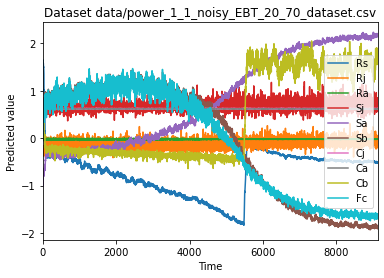

<Figure size 432x288 with 0 Axes>

In [61]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 2371 --plot --train_test_split 0.5

In [62]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 1084


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_1_noisy_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=1084, significance=0.9)

 Dataset:  power_1_1_noisy_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.058399
Epoch    27: reducing learning rate of group 0 to 1.0000e-02.
Epoch    38: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [12%] 	Loss: 0.323304
Epoch: 500 [25%] 	Loss: 0.247791
Epoch: 750 [38%] 	Loss: 0.225496
Epoch: 1000 [50%] 	Loss: 0.219982
Epoch: 1250 [62%] 	Loss: 0.215741
Epoch: 1500 [75%] 	Loss: 0.210370
Epoch: 1750 [88%] 	Loss: 0.190667
Epoch: 2000 [100%] 	Loss: 0.169962
Potential causes:  [6, 9]
Validated causes:  [6]

 Analysis started fo

Arguments: Namespace(cuda=False, data=['data/power_1_1_noisy_EBT_20_70_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=1048, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.905088
Epoch   232: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.093263
Epoch: 500 [25%] 	Loss: 0.067688
Epoch: 750 [38%] 	Loss: 0.064020
Epoch: 1000 [50%] 	Loss: 0.060969
Epoch  1091: reducing learning rate of group 0 to 1.0000e-03.
Epoch  1102: reducing learning rate of group 0 to 1.0000e-04.
Epoch  1122: reducing learning rate of group 0 to 1.0000e-05.
Epoch  1133: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 1250 [62%] 	Loss: 0.060665
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning ra

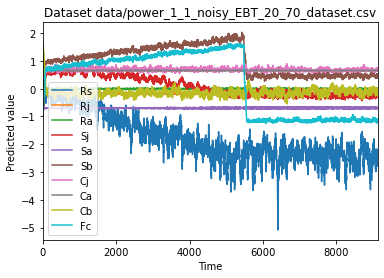

<Figure size 432x288 with 0 Axes>

In [63]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 1048 --plot --train_test_split 0.5

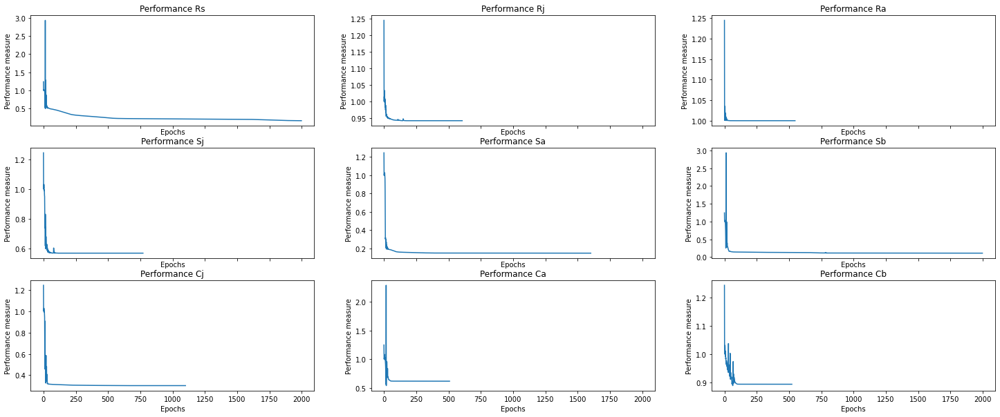

In [64]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

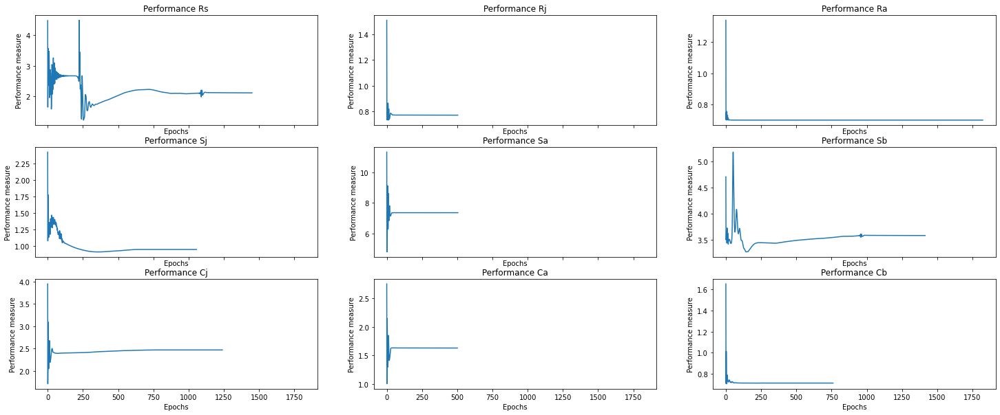

In [65]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 20-70 years: second run (decreased hidden layers by 1, incremented dilation coefficient and kernel size by 1)

In [66]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 5467


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_1_noisy_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=5467, significance=0.9)

 Dataset:  power_1_1_noisy_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.039660
Epoch    89: reducing learning rate of group 0 to 1.0000e-02.
Epoch   100: reducing learning rate of group 0 to 1.0000e-03.
Epoch   111: reducing learning rate of group 0 to 1.0000e-04.
Epoch   122: reducing learning rate of group 0 to 1.0000e-05.
Epoch   133: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.195845
Epoch: 500 [25%] 	Loss: 0.195518
INFO: Early stopping
Potential causes:  [7, 5, 9, 3]
Validated causes:  [5]

 Analysis s

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_1_noisy_EBT_20_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=5467, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.805821
Epoch   208: reducing learning rate of group 0 to 1.0000e-02.
Epoch   219: reducing learning rate of group 0 to 1.0000e-03.
Epoch   240: reducing learning rate of group 0 to 1.0000e-04.
Epoch: 250 [12%] 	Loss: 0.060423
Epoch   251: reducing learning rate of group 0 to 1.0000e-05.
Epoch   262: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.060320
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.078126
Epoch   125: reducing l

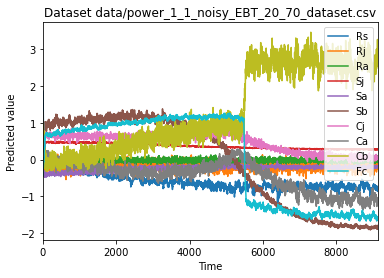

<Figure size 432x288 with 0 Axes>

In [67]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 5467 --plot --train_test_split 0.5

In [68]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 9238


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_1_noisy_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=9238, significance=0.9)

 Dataset:  power_1_1_noisy_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.022514
Epoch    96: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.163010
Epoch: 500 [25%] 	Loss: 0.160635
Epoch   600: reducing learning rate of group 0 to 1.0000e-03.
Epoch   619: reducing learning rate of group 0 to 1.0000e-04.
Epoch   630: reducing learning rate of group 0 to 1.0000e-05.
Epoch   641: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 750 [38%] 	Loss: 0.160373
Epoch: 1000 [50%] 	Loss: 0.160373
INFO: Early stopping


Arguments: Namespace(cuda=False, data=['data/power_1_1_noisy_EBT_20_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=9238, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.865134
Epoch   221: reducing learning rate of group 0 to 1.0000e-02.
Epoch   232: reducing learning rate of group 0 to 1.0000e-03.
Epoch   243: reducing learning rate of group 0 to 1.0000e-04.
Epoch: 250 [12%] 	Loss: 0.063940
Epoch   254: reducing learning rate of group 0 to 1.0000e-05.
Epoch   265: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.063941
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.045898
Epoch    99: reducing l

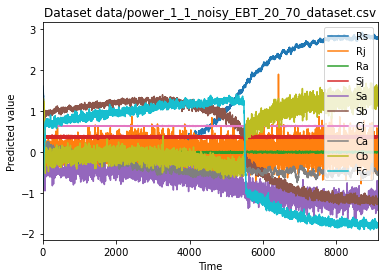

<Figure size 432x288 with 0 Axes>

In [69]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 9238 --plot --train_test_split 0.5

In [70]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 157


Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_1_noisy_EBT_20_70_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=157, significance=0.9)

 Dataset:  power_1_1_noisy_EBT_20_70_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.078968
Epoch   198: reducing learning rate of group 0 to 1.0000e-02.
Epoch   209: reducing learning rate of group 0 to 1.0000e-03.
Epoch   220: reducing learning rate of group 0 to 1.0000e-04.
Epoch   231: reducing learning rate of group 0 to 1.0000e-05.
Epoch   242: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.164244
Epoch: 500 [25%] 	Loss: 0.164228
INFO: Early stopping
Potential causes:  [8, 0]
Validated causes:  [0]

 Analysis started 

Arguments: Namespace(cuda=False, data=['data/power_1_1_noisy_EBT_20_70_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=157, train_test_split=0.5)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.589997
Epoch: 250 [12%] 	Loss: 0.061535
Epoch   265: reducing learning rate of group 0 to 1.0000e-02.
Epoch   276: reducing learning rate of group 0 to 1.0000e-03.
Epoch   287: reducing learning rate of group 0 to 1.0000e-04.
Epoch   298: reducing learning rate of group 0 to 1.0000e-05.
Epoch   309: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 500 [25%] 	Loss: 0.061738
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.972190
Epoch    31: reducing le

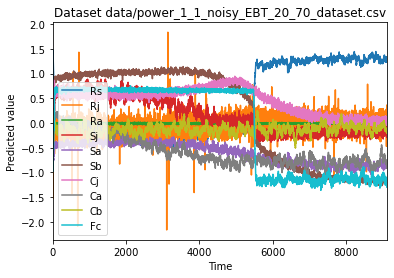

<Figure size 432x288 with 0 Axes>

In [71]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 157 --plot --train_test_split 0.5

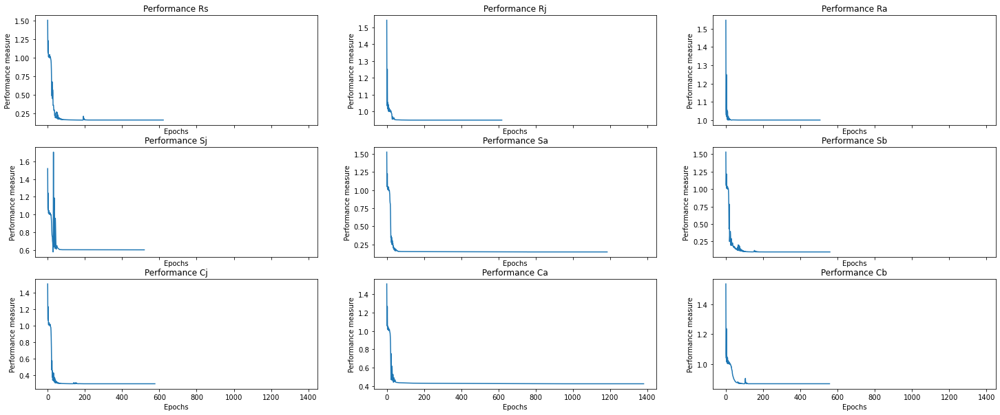

In [72]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

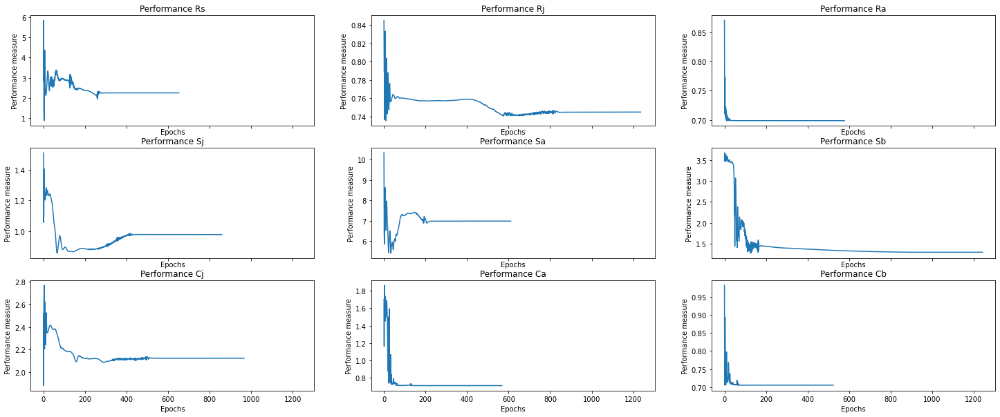

In [73]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 0 - 100 years

,Rs,Rj,Ra,Sj,Sa,Sb,Cj,Ca,Cb,Fc
0,1.328744,-1.372485,-1.129495,1.263355,-3.712547,0.525874,1.214303,0.139018,0.237505,-0.743059
1,1.481142,-0.105920,0.331752,0.162786,-1.002909,0.524278,0.706061,0.478615,0.547034,-0.540116
2,1.726226,1.689509,0.001439,1.130672,-1.059023,0.195428,0.741879,0.292437,0.544496,-0.716479
3,1.229986,-0.551469,0.586247,-0.255286,-0.797149,0.178671,0.875726,-0.458195,1.590642,-0.742692
4,1.321035,1.173116,-0.351496,0.051053,-0.912075,0.446080,-0.110876,1.250366,0.913019,-0.175962
...,...,...,...,...,...,...,...,...,...,...
36486,-1.116945,0.572456,0.638877,-0.529192,1.168085,-1.163797,-1.017495,-1.494043,-0.437878,-1.710250
36487,-0.346473,0.488250,-0.536183,-0.317624,1.331356,-1.555033,-1.109986,-0.382534,-0.610585,-0.180682
36488,-1.078416,2.768051,2.083738,-1.026920,1.099333,-1.127016,-1.505271,-1.211958,-1.406464,-0.381195
36489,-1.381330,2.294133,-0.495572,-0.446966,1.102922,-0.811895,-1.225725,-0.110352,0.568934,-0.090273


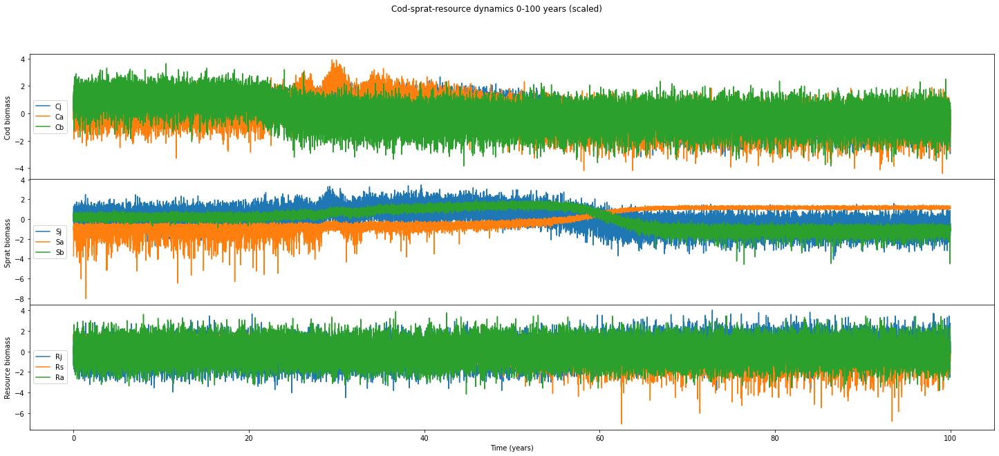

In [74]:
# Select data between 0 and 100 years
noisy_ebt_0_100 = select_data(noisy_ebt, 0, 100, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_1_noisy_EBT_0_100_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_0_100.to_csv(EBTScaled_path, index = False)

#### TCDF 0-100 years: first run (in triplicate)

In [75]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 37519

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_1_noisy_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=37519, significance=0.9)

 Dataset:  power_1_1_noisy_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.047382
Epoch: 250 [12%] 	Loss: 0.147802
Epoch   261: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 500 [25%] 	Loss: 0.147287
Epoch   653: reducing learning rate of group 0 to 1.0000e-03.
Epoch   665: reducing learning rate of group 0 to 1.0000e-04.
Epoch   676: reducing learning rate of group 0 to 1.0000e-05.
Epoch   687: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 750 [38%] 	Loss: 0.147024
Epoch: 1000 [50%] 	Loss: 0.147024
INFO: Early stopping

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_1_noisy_EBT_0_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=37519, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.828090
Epoch   132: reducing learning rate of group 0 to 1.0000e-02.
Epoch   143: reducing learning rate of group 0 to 1.0000e-03.
Epoch   154: reducing learning rate of group 0 to 1.0000e-04.
Epoch   165: reducing learning rate of group 0 to 1.0000e-05.
Epoch   176: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.033603
Epoch: 500 [25%] 	Loss: 0.033578
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.909555
Epoch    18: reducing 

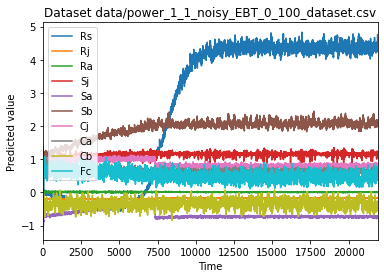

<Figure size 432x288 with 0 Axes>

In [76]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 37519 --plot --train_test_split 0.4

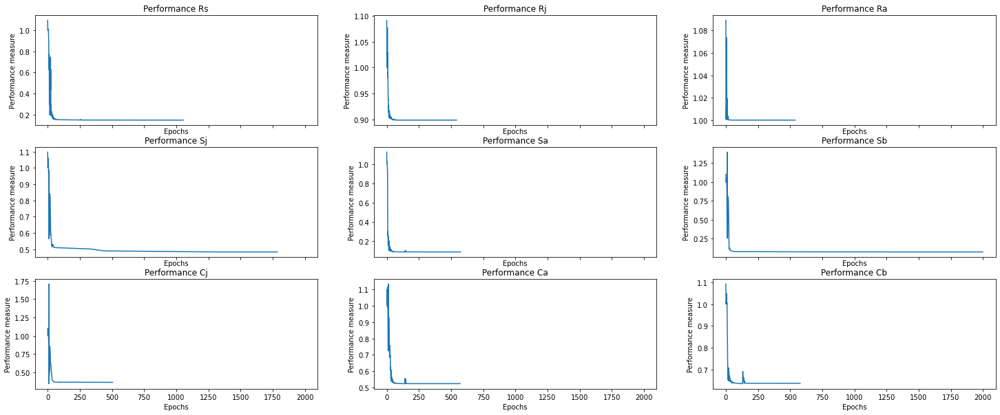

In [77]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

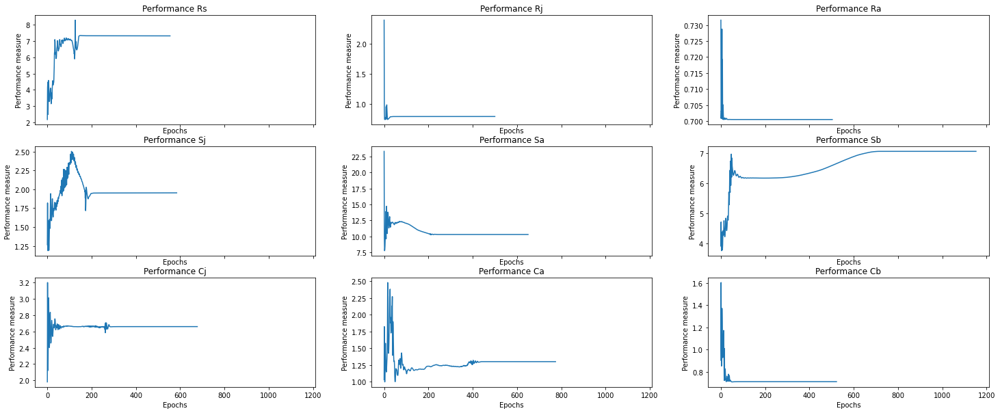

In [78]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

In [79]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 15787

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_1_noisy_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=15787, significance=0.9)

 Dataset:  power_1_1_noisy_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.030817
Epoch    30: reducing learning rate of group 0 to 1.0000e-02.
Epoch    48: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [12%] 	Loss: 0.189679
Epoch: 500 [25%] 	Loss: 0.183553
Epoch: 750 [38%] 	Loss: 0.174086
Epoch: 1000 [50%] 	Loss: 0.155126
Epoch: 1250 [62%] 	Loss: 0.150517
Epoch: 1500 [75%] 	Loss: 0.149743
Epoch: 1750 [88%] 	Loss: 0.149277
Epoch: 2000 [100%] 	Loss: 0.148895
Potential causes:  [5, 1]
Validated causes:  []

 Analysis started fo

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_1_noisy_EBT_0_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=15787, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.723928
Epoch    15: reducing learning rate of group 0 to 1.0000e-02.
Epoch    72: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [12%] 	Loss: 0.033018
Epoch: 500 [25%] 	Loss: 0.031749
Epoch: 750 [38%] 	Loss: 0.030888
Epoch: 1000 [50%] 	Loss: 0.030206
Epoch: 1250 [62%] 	Loss: 0.029466
Epoch: 1500 [75%] 	Loss: 0.028593
Epoch: 1750 [88%] 	Loss: 0.027743
Epoch: 2000 [100%] 	Loss: 0.027079

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.917488
Epoch    14: reducing lea

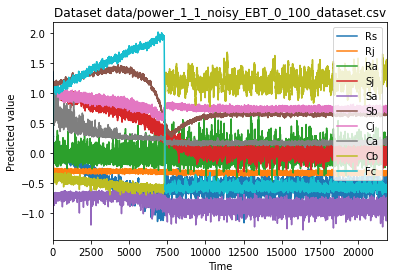

<Figure size 432x288 with 0 Axes>

In [80]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 15787 --plot --train_test_split 0.4

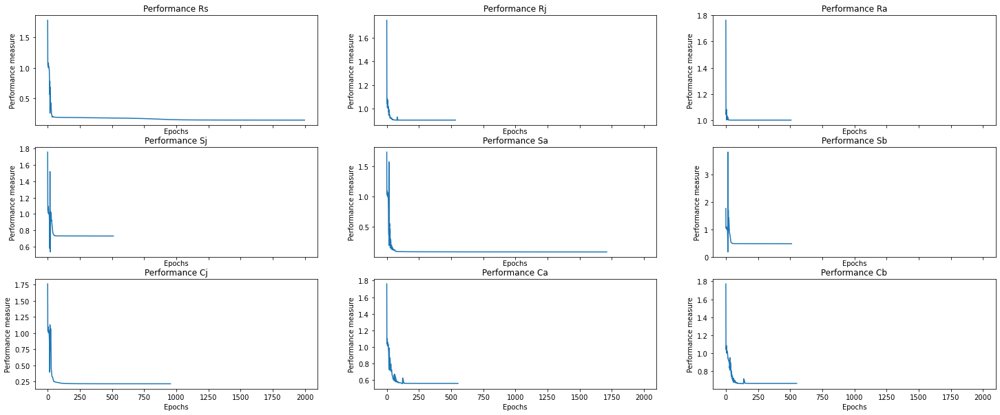

In [81]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

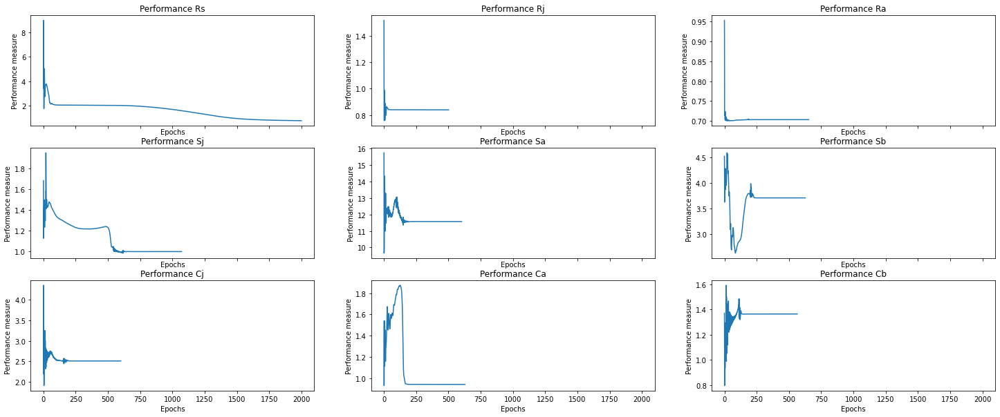

In [82]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

In [83]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 74326

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=4, early_stopping=True, epochs=2000, ground_truth={'data/power_1_1_noisy_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=74326, significance=0.9)

 Dataset:  power_1_1_noisy_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.030478
Epoch    56: reducing learning rate of group 0 to 1.0000e-02.
Epoch    67: reducing learning rate of group 0 to 1.0000e-03.
Epoch    78: reducing learning rate of group 0 to 1.0000e-04.
Epoch: 250 [12%] 	Loss: 0.198981
Epoch: 500 [25%] 	Loss: 0.197962
Epoch: 750 [38%] 	Loss: 0.197265
Epoch: 1000 [50%] 	Loss: 0.196442
Epoch: 1250 [62%] 	Loss: 0.195459
Epoch: 1500 [75%] 	Loss: 0.194111
Epoch: 1750 [88%] 	Loss: 0.192101
Epoch: 2000 [100%] 	Loss: 0.189188
Potenti

<Figure size 432x288 with 0 Axes>

Arguments: Namespace(cuda=False, data=['data/power_1_1_noisy_EBT_0_100_dataset.csv'], dilation_coefficient=4, early_stopping=True, epochs=2000, hidden_layers=2, kernel_size=4, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=74326, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 0.989306
Epoch    82: reducing learning rate of group 0 to 1.0000e-02.
Epoch    93: reducing learning rate of group 0 to 1.0000e-03.
Epoch   104: reducing learning rate of group 0 to 1.0000e-04.
Epoch   115: reducing learning rate of group 0 to 1.0000e-05.
Epoch   126: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 250 [12%] 	Loss: 0.032355
Epoch: 500 [25%] 	Loss: 0.032255
INFO: Early stopping

 Analysis started for target:  Rj
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.121157
Epoch    17: reducing 

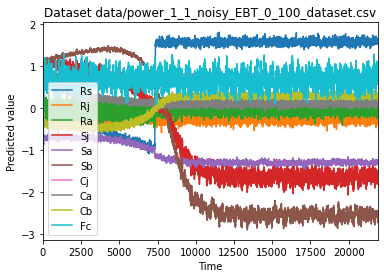

<Figure size 432x288 with 0 Axes>

In [84]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 74326 --plot --train_test_split 0.4

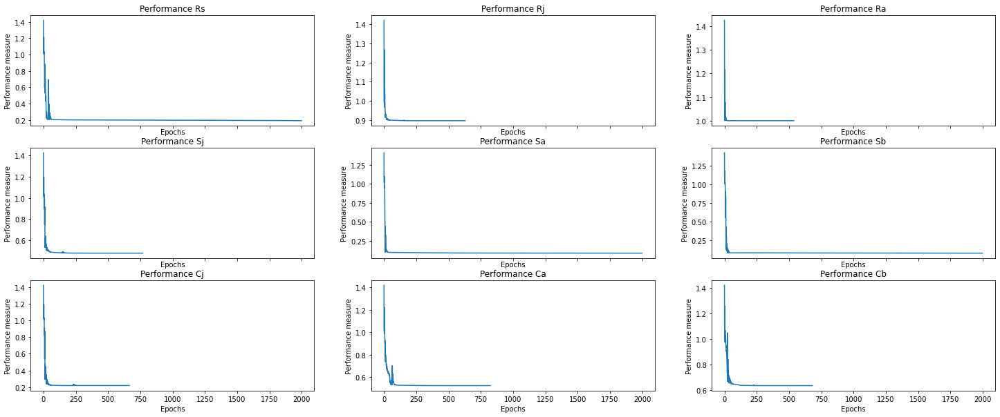

In [85]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

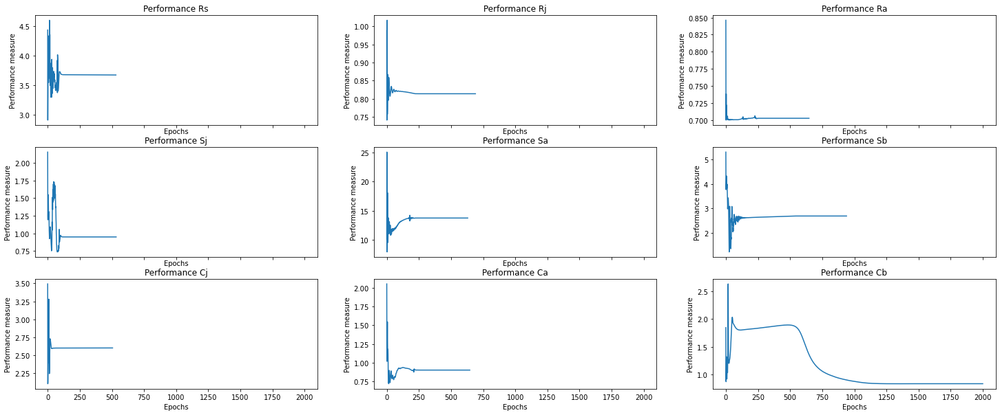

In [86]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

#### TCDF 0-100 years: second run (increased hidden layers by 1, decreased dilation coefficient and kernel size by 1)

In [87]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 1111

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_1_noisy_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=1111, significance=0.9)

 Dataset:  power_1_1_noisy_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.021825
Epoch    47: reducing learning rate of group 0 to 1.0000e-02.
Epoch: 250 [12%] 	Loss: 0.157562
Epoch   340: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 500 [25%] 	Loss: 0.150230
Epoch: 750 [38%] 	Loss: 0.149406
Epoch: 1000 [50%] 	Loss: 0.148378
Epoch  1184: reducing learning rate of group 0 to 1.0000e-04.
Epoch  1199: reducing learning rate of group 0 to 1.0000e-05.
Epoch  1210: reducing learning rate of group 0 to 1.0000e-06.
Epoch: 1250 [62%] 	Lo

<Figure size 432x288 with 0 Axes>

In [88]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 1111 --plot --train_test_split 0.4

Arguments: Namespace(cuda=False, data=['data/power_1_1_noisy_EBT_0_100_dataset.csv'], dilation_coefficient=3, early_stopping=True, epochs=2000, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=True, seed=1111, train_test_split=0.4)

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.657171
Epoch    23: reducing learning rate of group 0 to 1.0000e-02.
Epoch    45: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 250 [12%] 	Loss: 0.139397
Epoch: 500 [25%] 	Loss: 0.040071
Epoch: 750 [38%] 	Loss: 0.037687
Epoch: 1000 [50%] 	Loss: 0.032842
Epoch: 1250 [62%] 	Loss: 0.028595
Epoch: 1500 [75%] 	Loss: 0.026921
Epoch: 1750 [88%] 	Loss: 0.026256


KeyboardInterrupt: 

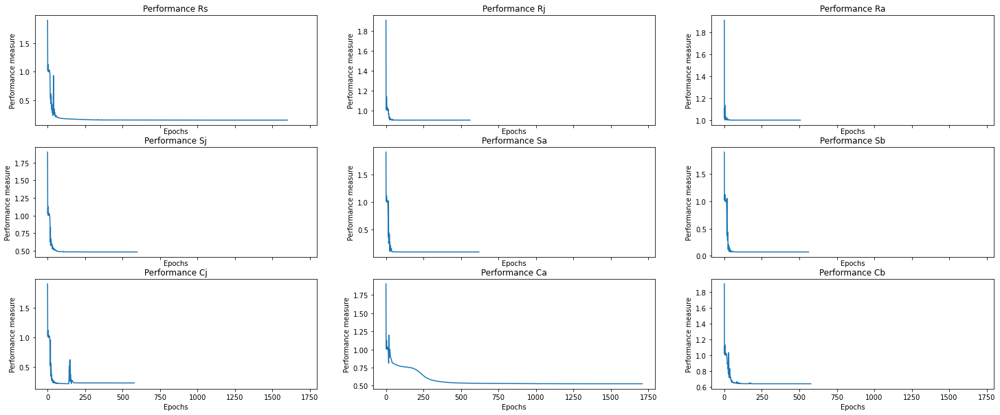

In [89]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

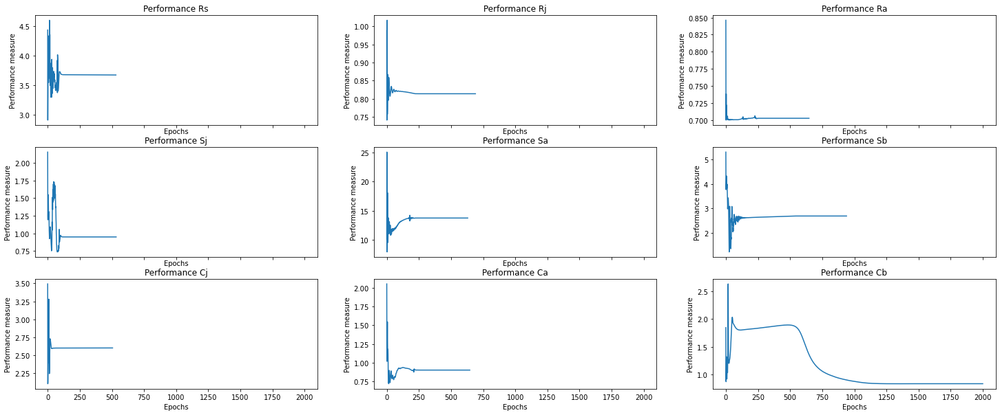

In [90]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 18040

Arguments: Namespace(cuda=False, data=None, dilation_coefficient=3, early_stopping=True, epochs=2000, ground_truth={'data/power_1_1_noisy_EBT_0_100_dataset.csv': 'data/EBT_demo_groundtruth.csv'}, hidden_layers=3, kernel_size=3, learning_rate=0.1, log_interval=250, lr_scheduler=True, optimizer='Adam', plot=False, seed=18040, significance=0.9)

 Dataset:  power_1_1_noisy_EBT_0_100_dataset.csv

 Analysis started for target:  Rs
INFO: Initializing learning rate scheduler
INFO: Initializing early stopping
Epoch:  1 [0%] 	Loss: 1.047922
Epoch    57: reducing learning rate of group 0 to 1.0000e-02.
Epoch    68: reducing learning rate of group 0 to 1.0000e-03.
Epoch    79: reducing learning rate of group 0 to 1.0000e-04.
Epoch    90: reducing learning rate of group 0 to 1.0000e-05.
Epoch   101: reducing learning rate of group 0 to 1.0000e-06.


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 18040 --plot --train_test_split 0.4

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 86547

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 86547 --plot --train_test_split 0.4

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

#### 0 - 20 years

In [ ]:
# Select data between 0 and 20 years
noisy_ebt_0_20 = select_data(noisy_ebt, 0, 20, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_1_noisy_EBT_0_20_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_0_20.to_csv(EBTScaled_path, index = False)

#### TCDF 0 - 20 years: first run (in triplicate)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 37519

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 37519 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 49741

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 49741 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 37786

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 37786 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 0-20 years: second run (increased hidden layers by 1, decreased dilation coefficient and kernel size by 1)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 94139


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 94139 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 18147


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 18147 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 69089


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 69089 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 70 - 100 years

In [ ]:
# Select data between 70 and 100 years
noisy_ebt_70_100 = select_data(noisy_ebt, 70, 100, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_1_noisy_EBT_70_100_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_70_100.to_csv(EBTScaled_path, index = False)

#### TCDF 70-100: first run (in triplicate)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 34321

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 34321 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 85672

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 85672 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 63109

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 63109 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 70-100: second run  (increased hidden layers by 1, decreased dilation coefficient and kernel size by 1)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 1238

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 1238 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 53988

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 53988 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 92422

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 92422 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 20 - 60 years

In [ ]:
# Select data between 20 and 60 years
noisy_ebt_20_60 = select_data(noisy_ebt, 20, 60, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_1_noisy_EBT_20_60_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_20_60.to_csv(EBTScaled_path, index = False)

#### TCDF 20-60 years: first run (in triplicate)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 24310

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 24310 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 77139

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 77139 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 45184

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 45184 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 20-60 years: second run  (decreased hidden layers by 1, increased dilation coefficient and kernel size by 1)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 78025

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 78025 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 53391

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 53391 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 34061

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 34061 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 60 - 70 years

In [ ]:
# Select data between 60 and 70 years
noisy_ebt_60_70 = select_data(noisy_ebt, 60, 70, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_1_noisy_EBT_60_70_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_60_70.to_csv(EBTScaled_path, index = False)

#### TCDF 60-70 years: first run (in triplicate)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 2369

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 2369 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 33520

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 33520 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 66848

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 66848 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 60-70 years: second run  (decreased hidden layers by 1, increased dilation coefficient and kernel size by 1)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 2369

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 2369 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 21312

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 21312 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_1_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 8023

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_1_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 8023 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

### Signal to Noise ratio 1:10

In [ ]:
# Create new dataset with snr 1:10
noisy_ebt = noisy_data(0.1)

#### 20 - 70 years

In [ ]:
# Select data between 20 and 70 years
noisy_ebt_20_70 = select_data(noisy_ebt, 20, 70, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_10_noisy_EBT_20_70_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_20_70.to_csv(EBTScaled_path, index = False)

#### TCDF 20-70 years: first run (in triplicate)

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 5678


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 5467 --plot --train_test_split 0.5

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 2371


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 2371 --plot --train_test_split 0.5

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 1084


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 1048 --plot --train_test_split 0.5

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 20-70 years: second run (decreased hidden layers by 1, incremented dilation coefficient and kernel size by 1)

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 5467


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 5467 --plot --train_test_split 0.5

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 9238


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 9238 --plot --train_test_split 0.5

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_20_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 157


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_20_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 157 --plot --train_test_split 0.5

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 0 - 100 years

In [ ]:
# Select data between 0 and 100 years
noisy_ebt_0_100 = select_data(noisy_ebt, 0, 100, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_10_noisy_EBT_0_100_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_0_100.to_csv(EBTScaled_path, index = False)

#### TCDF 0-100 years: first run (in triplicate)

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 37519

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 37519 --plot --train_test_split 0.4

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 15787

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 15787 --plot --train_test_split 0.4

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 74326

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 74326 --plot --train_test_split 0.4

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

#### TCDF 0-100 years: second run (increased hidden layers by 1, decreased dilation coefficient and kernel size by 1)

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 1111

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 1111 --plot --train_test_split 0.4

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 18040

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 18040 --plot --train_test_split 0.4

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected total dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_0_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 86547

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_0_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 86547 --plot --train_test_split 0.4

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(accuracy)

#### 0 - 20 years

In [ ]:
# Select data between 0 and 20 years
noisy_ebt_0_20 = select_data(noisy_ebt, 0, 20, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_10_noisy_EBT_0_20_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_0_20.to_csv(EBTScaled_path, index = False)

#### TCDF 0 - 20 years: first run (in triplicate)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 37519

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 37519 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 49741

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 49741 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 37786

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 37786 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 0-20 years: second run (increased hidden layers by 1, decreased dilation coefficient and kernel size by 1)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 94139


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 94139 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 18147


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 18147 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_0_20_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 69089


In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_0_20_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 69089 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 70 - 100 years

In [ ]:
# Select data between 70 and 100 years
noisy_ebt_70_100 = select_data(noisy_ebt, 70, 100, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_10_noisy_EBT_70_100_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_70_100.to_csv(EBTScaled_path, index = False)

#### TCDF 70-100: first run (in triplicate)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 34321

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 34321 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 85672

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 85672 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 63109

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 63109 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 70-100: second run  (increased hidden layers by 1, decreased dilation coefficient and kernel size by 1)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 1238

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 1238 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 53988

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 53988 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_70_100_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 92422

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_70_100_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 92422 --plot --train_test_split 0.8

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 20 - 60 years

In [ ]:
# Select data between 20 and 60 years
noisy_ebt_20_60 = select_data(noisy_ebt, 20, 60, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_10_noisy_EBT_20_60_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_20_60.to_csv(EBTScaled_path, index = False)

#### TCDF 20-60 years: first run (in triplicate)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 24310

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 24310 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 77139

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 77139 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 45184

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 45184 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 20-60 years: second run  (decreased hidden layers by 1, increased dilation coefficient and kernel size by 1)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 78025

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 78025 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 53391

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 53391 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_20_60_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 34061

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_20_60_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 34061 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### 60 - 70 years

In [ ]:
# Select data between 20 and 60 years
noisy_ebt_60_70 = select_data(noisy_ebt, 60, 70, 'power')

# Create file path for new file
EBTScaled_path = os.path.join(TCDFdata_path, 'power_1_10_noisy_EBT_60_70_dataset.csv')

# Write clean dataframe demo_ebt to a new .csv file
noisy_ebt_60_70.to_csv(EBTScaled_path, index = False)

#### TCDF 60-70 years: first run (in triplicate)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 2369

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 2369 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 33520

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 33520 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 3 --kernel_size 3 --seed 66848

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 3 --epochs 2000 --log_interval 250 --dilation_coefficient 3 --kernel_size 3 --seed 66848 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

#### TCDF 60-70 years: second run  (decreased hidden layers by 1, increased dilation coefficient and kernel size by 1)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 2369

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 2369 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 21312

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 21312 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)

In [ ]:
%matplotlib inline

# Run TCDF with the selected equilibrium dataset of EBT data

%run -i "runTCDF.py"  --ground_truth data/power_1_10_noisy_EBT_60_70_dataset.csv=data/EBT_demo_groundtruth.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --significance 0.9 --dilation_coefficient 4 --kernel_size 4 --seed 8023

In [ ]:
# Run TCDF for predictive accuracy

%run -i "evaluate_predictions_TCDF.py" --data data/power_1_10_noisy_EBT_60_70_dataset.csv --learning_rate 0.1 --hidden_layers 2 --epochs 2000 --log_interval 250 --dilation_coefficient 4 --kernel_size 4 --seed 8023 --plot --train_test_split 0.7

In [ ]:
%matplotlib inline
# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot training losses
plot_performance(alllosses)

In [ ]:
## Prologue

# Set figure size 
plt.rcParams['figure.figsize'] = [25, 10]

# Plot accuracy (MASE values)
plot_performance(accuracy)